In [1]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt
import datetime
from numpy import linalg
#from numpy import *
import pandas as pd
%matplotlib inline

# Introduction
The Hamiltonian for this system is 
$$
\newcommand{\braket}[2]{\left\langle{#1}\middle|{#2}\right\rangle}
\newcommand{\ket}[1]{\left|{#1}\right\rangle}
\newcommand{\bra}[1]{\left\langle{#1}\right|}
$$

$$
\begin{align}
H =& 
\frac{J_1 \cos(\phi_1)}{2}\left(\sigma_x^{(d)}\sigma_x^{(a1)}+\sigma_y^{(d)}\sigma_y^{(a1)}\right)
+\frac{J_1 \sin(\phi_1)}{2}\left(\sigma_y^{(d)}\sigma_x^{(a1)}-\sigma_x^{(d)}\sigma_y^{(a1)}\right)\\
&+\frac{J_2 \cos(\phi_2)}{2}\left(\sigma_x^{(d)}\sigma_x^{(a2)}+\sigma_y^{(d)}\sigma_y^{(a2)}\right)
+\frac{J_2 \sin(\phi_2)}{2}\left(\sigma_y^{(d)}\sigma_x^{(a2)}-\sigma_x^{(d)}\sigma_y^{(a2)}\right)\\
&+\frac{J_3 \cos(\phi_3)}{2}\left(\sigma_x^{(a1)}\sigma_x^{(a3)}+\sigma_y^{(a1)}\sigma_y^{(a3)}\right)
+\frac{J_3 \sin(\phi_3)}{2}\left(\sigma_y^{(a1)}\sigma_x^{(a3)}-\sigma_x^{(a1)}\sigma_y^{(a3)}\right)\\
&+\frac{J_4 \cos(\phi_4)}{2}\left(\sigma_x^{(a2)}\sigma_x^{(a3)}+\sigma_y^{(a2)}\sigma_y^{(a3)}\right)
+\frac{J_4 \sin(\phi_4)}{2}\left(\sigma_y^{(a2)}\sigma_x^{(a3)}-\sigma_x^{(a2)}\sigma_y^{(a3)}\right)\\
&+\frac{\Delta}{2}\sigma_z^{(d)}+\frac{\kappa}{2}\sigma_z^{(d)}(\hat{a}+\hat{a}^{\dagger}) +\nu_{eff}\hat{a}^{\dagger}\hat{a}
+\frac{\Delta_1}{2}\sigma_z^{(a_1)}+\frac{\kappa_1}{2}\sigma_z^{(a_1)}(\hat{a}+\hat{a}^{\dagger}) 
\end{align}
$$
### Parameters
1. $J = \eta_{ax}^2 \Omega_1^G \Omega_2^G / \delta_{ms}$ is the coupling coefficient, $\eta_{ax}$ is the Lamb-Dekie parameter for axial axis, $\Omega_{1,2}^G$ are Rabi frequencies of two laser tones of global beam. It can be measured by setting $\Delta, \kappa = 0$. This MS gate is based on the **axial strech** modes.

2. $\Delta$ Relative energy detuning. AC-Stark shift caused by the energy imbalance of two tones of local beam.

3. $\kappa$ is the coupling coeeficient between environment and sites, $\kappa = \eta_{r}^2 \Omega^L_1 \Omega^L_2 / \omega_r$, where $\Omega^L_i$ is the on-resonance coupling between $\ket{S}$ and $\ket{D}$ states generated by the ith tone of the local beam.

4. $\nu_{eff}$ is the frequency of environmental vibration mode. In this paper, the **radial rocking** mode is served as environmental mode. 

In [2]:
class VAET:
    def __init__(self, 
                 Nmax = 20, # max number of phonons
                 J = [1,1,1,1],     # kHz
                 phi = [0,0,0,0],
                 Delta = 1, # kHz
                 Delta1 = 0,
                 kappa = 1, # kHz
                 kappa1 = 0,
                 nu = 1,    # kHz 
                 delta = 1,
                 phi_s = 0,
                 phi_m = 0
                ):
        self.Nmax = Nmax
        self.J = [i * 2 * np.pi for i in J]
        self.phi = phi
        self.Delta = Delta * 2 * np.pi
        self.Delta1 = Delta1 * 2 * np.pi
        self.kappa = kappa * 2 * np.pi
        self.kappa1 = kappa1
        self.nu = nu * 2 * np.pi
        self.delta = delta * 2 * np.pi
        self.phi_r = phi_s
        self.phi_b = phi_m
        
        self.nth = 0
        self.s_init = tensor(\
                             ket2dm(tensor(basis(2, 0),basis(2, 1),basis(2, 1),basis(2, 1))), thermal_dm(self.Nmax, 0.5))
        self.output = None
        
    def solve(self, tlist):
        a = destroy(self.Nmax) # basis(2,0) is excited state
        
        H0xx = 0.5*(self.J[0]*np.cos(self.phi[0])* tensor(sigmax(), sigmax(), qeye(2), qeye(2), qeye(self.Nmax))\
                    +self.J[1]*np.cos(self.phi[1])*tensor(sigmax(), qeye(2), sigmax(), qeye(2), qeye(self.Nmax))\
                    +self.J[2]*np.cos(self.phi[2])*tensor(qeye(2), qeye(2), sigmax(), sigmax(), qeye(self.Nmax))\
                    +self.J[3]*np.cos(self.phi[3])*tensor(qeye(2), sigmax(), qeye(2), sigmax(), qeye(self.Nmax)))
        H0yy = 0.5*(self.J[0]*np.cos(self.phi[0])*tensor(sigmay(), sigmay(), qeye(2), qeye(2), qeye(self.Nmax))\
                    +self.J[1]*np.cos(self.phi[1])*tensor(sigmay(), qeye(2), sigmay(), qeye(2), qeye(self.Nmax))\
                    +self.J[2]*np.cos(self.phi[2])*tensor(qeye(2), qeye(2), sigmay(), sigmay(), qeye(self.Nmax))\
                    +self.J[3]*np.cos(self.phi[3])*tensor(qeye(2), sigmay(), qeye(2), sigmay(), qeye(self.Nmax)))
        H0yx = 0.5*(self.J[0]*np.sin(self.phi[0])* tensor(sigmay(), sigmax(), qeye(2), qeye(2), qeye(self.Nmax))\
                    +self.J[1]*np.sin(self.phi[1])*tensor(sigmay(), qeye(2), sigmax(), qeye(2), qeye(self.Nmax))\
                    +self.J[2]*np.sin(self.phi[2])*tensor(qeye(2), qeye(2), sigmay(), sigmax(), qeye(self.Nmax))\
                    +self.J[3]*np.sin(self.phi[3])*tensor(qeye(2), sigmay(), qeye(2), sigmax(), qeye(self.Nmax)))
        H0xy = 0.5*(self.J[0]*np.sin(self.phi[0])*tensor(sigmax(), sigmay(), qeye(2), qeye(2), qeye(self.Nmax))\
                    +self.J[1]*np.sin(self.phi[1])*tensor(sigmax(), qeye(2), sigmay(), qeye(2), qeye(self.Nmax))\
                    +self.J[2]*np.sin(self.phi[2])*tensor(qeye(2), qeye(2), sigmax(), sigmay(), qeye(self.Nmax))\
                    +self.J[3]*np.sin(self.phi[3])*tensor(qeye(2), sigmax(), qeye(2), sigmay(), qeye(self.Nmax)))
        if self.kappa1 == 0:
            H1 = -self.Delta/2 * tensor(sigmaz(),qeye(2),qeye(2),qeye(2),qeye(self.Nmax))
            H2 = -self.kappa/2 * tensor(sigmaz(),qeye(2),qeye(2),qeye(2),(a + a.dag()))
            H3 = self.nu * tensor(qeye(2),qeye(2),qeye(2),qeye(2),a.dag()*a)
        else:
            H1 = -self.Delta/2 * tensor(sigmaz(),qeye(2),qeye(2),qeye(2),qeye(self.Nmax))\
                -self.Delta1/2 * tensor(qeye(2),sigmaz(),qeye(2),qeye(2),qeye(self.Nmax))
            H2 = -self.kappa/2 * tensor(sigmaz(),qeye(2),qeye(2),qeye(2),(a + a.dag()))\
                -self.kappa1/2 * tensor(qeye(2),sigmaz(),qeye(2),qeye(2),(a + a.dag()))
            H3 = self.nu * tensor(qeye(2),qeye(2),qeye(2),qeye(2),a.dag()*a)
    
        H = H0xx+H0yy+H0yx-H0xy+H1+H2+H3
        c_ops = []

        self.output = mesolve(H, self.s_init, tlist, c_ops, [])
    
    def time_scan(self,
                  t_start,
                  t_stop,
                  Nsample,
                  nth = 0.5,
                  which = 1
                 ):
        self.nth = nth
        self.s_init = tensor(\
                    ket2dm(tensor(basis(2, 0), basis(2, 1), basis(2, 1), basis(2, 1))), thermal_dm(self.Nmax, self.nth))
        now = datetime.datetime.now()
        t_list = np.linspace(t_start, t_stop, Nsample)
        self.solve(t_list)
        states = self.output.states
        now1 = datetime.datetime.now()
        '''
        e0 = self.measure(states, self.output.times, 0)
        e3 = self.measure(states, self.output.times, 3)
        '''
        '''
        e1 = self.measure(states, self.output.times, 1)
        e2 = self.measure(states, self.output.times, 2)
        e3 = self.measure(states, self.output.times, 3)
        fig, ax = plt.subplots()
        ax.plot(t_list, e0+e1+e2+e3)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('Sum of all four probabilities')'''
        
        trans = self.jointMeasure(states, self.output.times)
        now2 = datetime.datetime.now()
        print('time used for solving mesolve:', now1-now, ' time used for ploting:', now2-now1)
        return trans
        
    def measure(self, states, x_axis, which):
        # states: np.array of dm includes two ions and phonons
        # which: donor 0, acceptor1: 1, acceptor2: 2, acceptor3: 3
        s_g = basis(2, 1) # basis(2,1) is ground state
        s_e = basis(2, 0) # basis(2,0) is excited state
        
        def _measure(state, s_meas, which):
            state_ptr = state.ptrace(which)  
            result = s_meas.dag()*state_ptr*s_meas
            if result.data.data.size:
                return np.real(result.data.data[0])
            else:
                return 0.0    # np.array has same type
         
        e = np.zeros(len(states))
        g = np.zeros(len(states))
        for i in range(len(states)):
            e[i] = _measure(states[i], s_e, which)
            g[i] = _measure(states[i], s_g, which)
            
        fig, ax = plt.subplots()
        ax.plot(x_axis, e)
        ax.set_xlabel('Time (ms)')
        plt.ylim(0,1)
        #ax.legend(('Ground state', 'Excited state'))
        plt.show()   
        if which == 0:
            ax.set_ylabel('Probability of excited state of Donor')
        elif which == 1:
            ax.set_ylabel('Probability of excited state of Acceptor1')
        elif which == 2:
            ax.set_ylabel('Probability of excited state of Acceptor2')
        elif which == 3:
            ax.set_ylabel('Probability of excited state of Acceptor3')
        return(e)

    def jointMeasure(self, states, x_axis):
        # states: np.array of dm includes two ions and phonons
        s_ee = tensor(basis(2, 0), basis(2, 0))
        s_gg = tensor(basis(2, 1), basis(2, 1))
        s_eg = tensor(basis(2, 0), basis(2, 1))
        s_ge = tensor(basis(2, 1), basis(2, 0))
        
        def _measure(state, s_meas):
            state_ptr = state.ptrace([0,3])  
            result = s_meas.dag()*state_ptr*s_meas
            if result.data.data.size:
                return np.real(result.data.data[0])
            else:
                return 0.0    # np.array has same type
         
        ee = np.zeros(len(states))
        gg = np.zeros(len(states))
        eg = np.zeros(len(states))
        ge = np.zeros(len(states))
        for i in range(len(states)):
            ee[i] = _measure(states[i], s_ee)
            gg[i] = _measure(states[i], s_gg)
            eg[i] = _measure(states[i], s_eg)
            ge[i] = _measure(states[i], s_ge)
        P_acc = ge/(ge+eg)
        trans = max(P_acc)
        print('max=', max(P_acc))
        fig, ax = plt.subplots()
        ax.plot(x_axis, P_acc)
        ax.plot(x_axis, eg)
        ax.plot(x_axis, ge)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('$P_{acc}$')
        ax.legend(('$P_{acc}$','eg', 'ge'))
        plt.show()
        return trans
        
    def PaccVsVeff(self,
                   nu_start,
                   nu_stop,
                   Nusample,
                   t_start,
                   t_stop,
                   Nsample,
                   noise = 0.02,
                   nth = 0.5
                  ):
        now = datetime.datetime.now()
        def _measure(state, s_meas):
            state_ptr = state.ptrace([0,1])  
            result = s_meas.dag()*state_ptr*s_meas
            if result.data.data.size:
                return np.real(result.data.data[0])
            else:
                return 0.0    # np.array has same type
        P_peak = []
        nus = np.linspace(nu_start, nu_stop, Nusample)
        Delta_mean = self.Delta
        for nu in nus:
            self.nth = nth
            self.nu = nu
            self.Delta = Delta_mean*(1+np.random.normal(0, noise))
            self.s_init = tensor(\
                        ket2dm(tensor(basis(2, 0), basis(2, 1))), thermal_dm(self.Nmax, self.nth))
            t_list = np.linspace(t_start, t_stop, Nsample)
            self.solve(t_list)
            states = self.output.states
            # states: np.array of dm includes two ions and phonons
            s_eg = tensor(basis(2, 0), basis(2, 1))
            s_ge = tensor(basis(2, 1), basis(2, 0))
            eg = np.zeros(len(states))
            ge = np.zeros(len(states))
            for i in range(len(states)):
                eg[i] = _measure(states[i], s_eg)
                ge[i] = _measure(states[i], s_ge)
            P_acc = ge/(ge+eg)
            #plt.plot(t_list, P_acc)
            P_peak.append(P_acc[-1])
        fig, ax = plt.subplots()
        ax.plot(nus, P_peak)
        ax.set_xlabel('$v_{eff}/2\pi$')
        ax.set_ylabel('$P_{acc}$')
        #ax.legend(('$P_{acc}$','eg', 'ge'))
        plt.show()
        now2 = datetime.datetime.now()
        print('time elapsed:', now2-now)

max= 1.0001781290675373


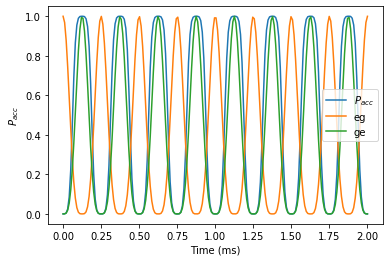

time used for solving mesolve: 0:00:00.937951  time used for ploting: 0:00:00.674620


1.0001781290675373

In [32]:
exp1 = VAET(Nmax=10, J =[2,2,2,2], Delta = 0, kappa = 0, nu = 0)
exp1.time_scan(0, 2, 200, nth = 0, which = 0)

max= 0.9786138070427877


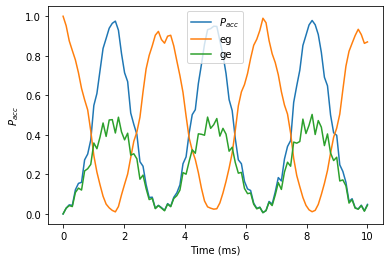

time used for solving mesolve: 0:00:41.669967  time used for ploting: 0:00:00.492118


0.9786138070427877

In [3]:
j = 1.3
J = [j]*4
Delta = 10
kappa = 1.4
nu = np.sqrt(4*j**2+1.45*Delta**2)
exp1 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
exp1.time_scan(0, 10, 100, nth = 0, which = 0)

## Findings
At high temperature (large $\bar{n}$), there is a symmtry between possitive and negetive $\nu_{eff}$. However, at low temperature (small $\bar{n}$), the result shows a suppression for possitive $\nu_{eff}$ but exhibits strong peaks at negative $\nu_{eff}$. This is similar to the suppression on the red sideband after cooling.
<br>
A negative $\nu_{eff}$ means negative detuning $\Delta$.

nth = 10 , nu =  12.319090875547595
max= 0.49739574789128593


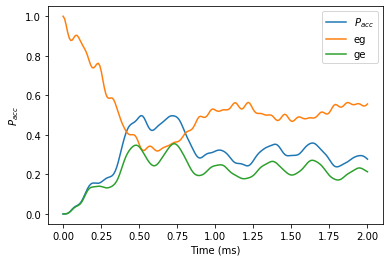

time used for solving mesolve: 0:01:01.206770  time used for ploting: 0:00:00.668298
nth = 10 , nu =  -12.319090875547595
max= 0.5719336071712694


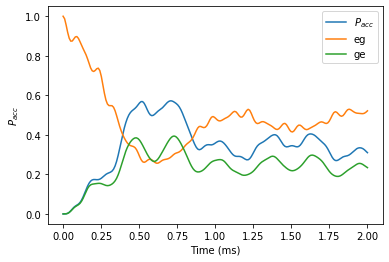

time used for solving mesolve: 0:00:54.246135  time used for ploting: 0:00:00.716041
nth = 0.1 , nu =  12.319090875547595
max= 0.06876755223986653


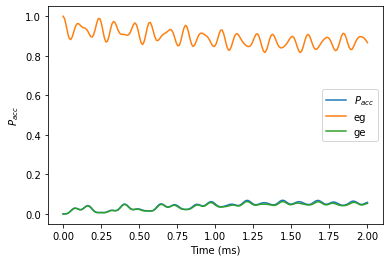

time used for solving mesolve: 0:01:30.632852  time used for ploting: 0:00:00.685579
nth = 0.1 , nu =  -12.319090875547595
max= 0.9300078514474583


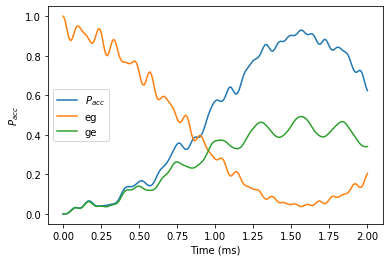

time used for solving mesolve: 0:01:03.603002  time used for ploting: 0:00:00.688663


0.9300078514474583

In [4]:
j = 1.3
J = [j]*4
Delta = 10
kappa = 1.4
nu = np.sqrt(4*j**2+1.45*Delta**2)
nth = 10
exp = VAET(Nmax=20, J = J, Delta = Delta, kappa = kappa, nu = nu)
print('nth =', nth, ', nu = ', nu)
exp.time_scan(0, 2, 200, nth = nth, which = 1)
exp = VAET(Nmax=20, J = J, Delta = Delta, kappa = kappa, nu = -nu)
print('nth =', nth, ', nu = ', -nu)
exp.time_scan(0, 2, 200, nth = nth, which = 1)

nth = 0.1
exp = VAET(Nmax=20, J = J, Delta = Delta, kappa = kappa, nu = nu)
print('nth =', nth, ', nu = ', nu)
exp.time_scan(0, 2, 200, nth = nth, which = 1)
exp = VAET(Nmax=20, J = J, Delta = Delta, kappa = kappa, nu = -nu)
print('nth =', nth, ', nu = ', -nu)
exp.time_scan(0, 2, 200, nth = nth, which = 1)

## Assumptions
$$
\newcommand{\braket}[2]{\left\langle{#1}\middle|{#2}\right\rangle}
\newcommand{\ket}[1]{\left|{#1}\right\rangle}
\newcommand{\bra}[1]{\left\langle{#1}\right|}
$$
(a) Significant transfer should occurs only at $\nu_{eff} = \sqrt{n\Delta^2+mJ^2}/k$, which corresponds to $\ket{SD,n} \Rightarrow \ket{DS, n\pm k}$
<br>
(b) If $\Delta >>J$, 
<br>
and if we choose vibrational mode energy as $\nu = \sqrt{n\Delta^2+mJ^2}\approx \sqrt{n}\Delta$, vibrational mode will assist donor to accepter 1,2, but will not assist 1,2 to 3.
<br>
If we choose vibrational mode energy as $\nu = J$, vibrational mode will assist acceptor 1,2 to 3, but will not assist donor to accepter 1,2.
<br>
If $J>>\Delta$,
<br>
$\nu = \sqrt{J^2+\Delta^2} \approx J$, which means the motional state will assist all the transitions.
<br>
(c) For sufficient large $\Delta$, the multiphonon process can be spectrally resolved up to a maximum integer value. However, when J ~ $\Delta$, the multiphonon, single-phonon, inter-site process will not be distinguishable.

### Step 1. Find suitable effective parameters m and n
#### Case 1.1 $\Delta >> J$
$\Delta = 10, J = 1.3, \kappa = 1.4$

n =  0.0
max= 0.07341561365681135


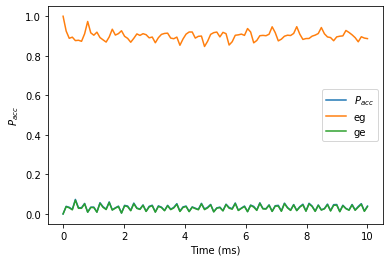

time used for solving mesolve: 0:00:09.034422  time used for ploting: 0:00:00.343161
n =  0.1
max= 0.12293934951145045


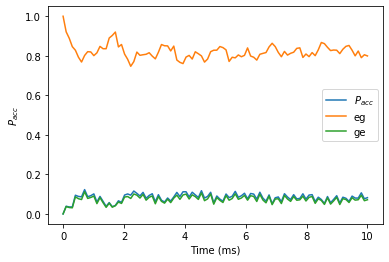

time used for solving mesolve: 0:00:11.899552  time used for ploting: 0:00:00.341359
n =  0.2
max= 0.07199234888601105


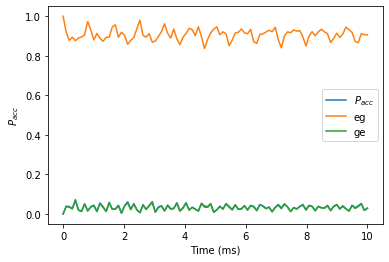

time used for solving mesolve: 0:00:17.364681  time used for ploting: 0:00:00.347703
n =  0.30000000000000004
max= 0.14209406236346778


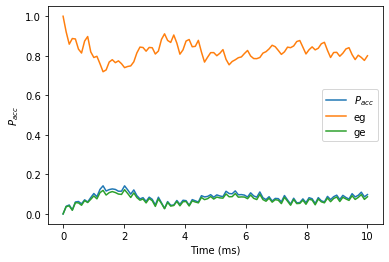

time used for solving mesolve: 0:00:23.802210  time used for ploting: 0:00:00.346460
n =  0.4
max= 0.0776481426289204


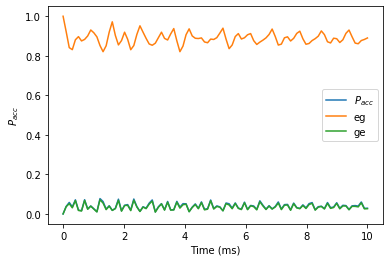

time used for solving mesolve: 0:00:27.176211  time used for ploting: 0:00:00.337738
n =  0.5
max= 0.14407565553248788


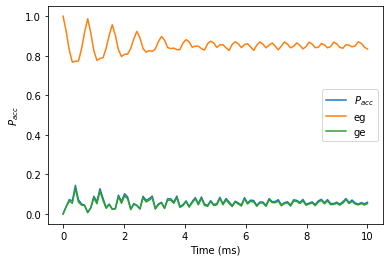

time used for solving mesolve: 0:00:23.974888  time used for ploting: 0:00:00.342586
n =  0.6000000000000001
max= 0.33242366816394187


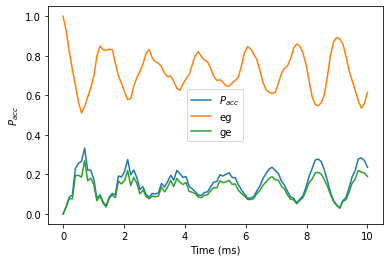

time used for solving mesolve: 0:00:26.550963  time used for ploting: 0:00:00.339778
n =  0.7000000000000001
max= 0.8138524557651872


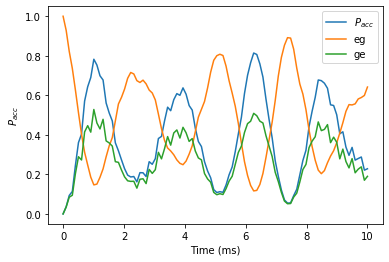

time used for solving mesolve: 0:00:33.226285  time used for ploting: 0:00:00.351288
n =  0.8
max= 0.27342881536284336


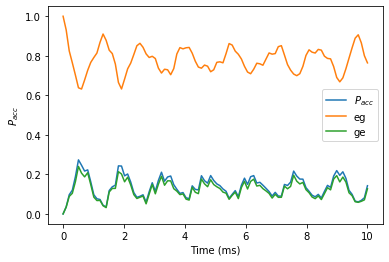

time used for solving mesolve: 0:00:30.580099  time used for ploting: 0:00:00.345095
n =  0.9
max= 0.12005518062180598


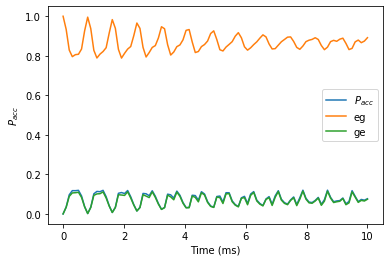

time used for solving mesolve: 0:00:54.097515  time used for ploting: 0:00:00.345610
n =  1.0
max= 0.11190608558995394


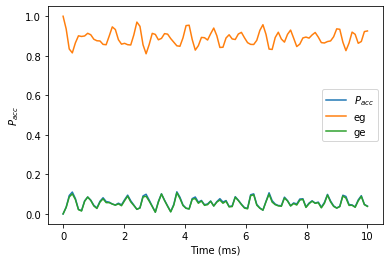

time used for solving mesolve: 0:00:32.749685  time used for ploting: 0:00:00.355249
n =  1.1
max= 0.10766975275473038


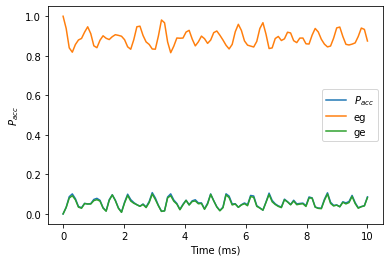

time used for solving mesolve: 0:00:36.215675  time used for ploting: 0:00:00.348063
n =  1.2000000000000002
max= 0.1381075711662821


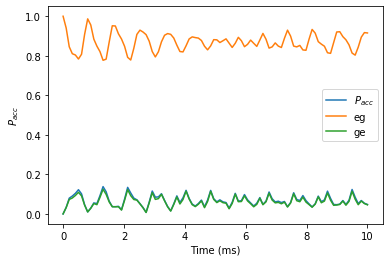

time used for solving mesolve: 0:00:35.920560  time used for ploting: 0:00:00.339670
n =  1.3
max= 0.20890676510068187


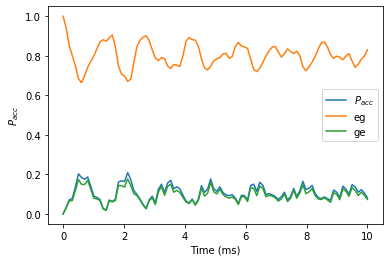

time used for solving mesolve: 0:00:34.230624  time used for ploting: 0:00:00.343654
n =  1.4000000000000001
max= 0.5716333749606929


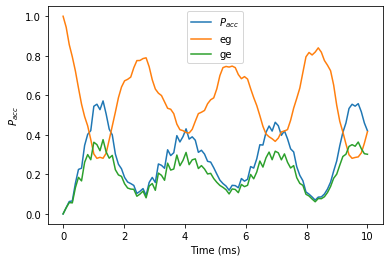

time used for solving mesolve: 0:01:11.896166  time used for ploting: 0:00:00.349275
n =  1.5
max= 0.4997083411306151


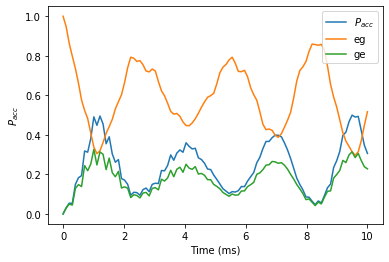

time used for solving mesolve: 0:01:14.925470  time used for ploting: 0:00:00.365973
n =  1.6
max= 0.15665501730292725


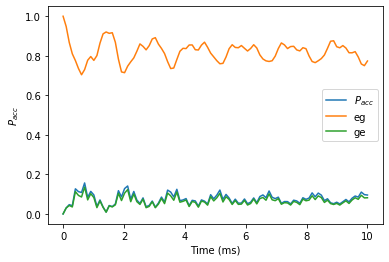

time used for solving mesolve: 0:00:50.195682  time used for ploting: 0:00:00.339679
n =  1.7000000000000002
max= 0.09924306930080158


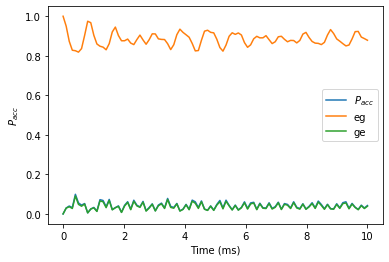

time used for solving mesolve: 0:00:52.343789  time used for ploting: 0:00:00.354099
n =  1.8
max= 0.0753431229245636


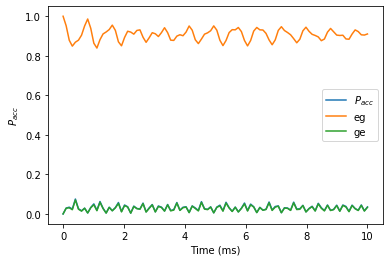

time used for solving mesolve: 0:00:54.033249  time used for ploting: 0:00:00.354209
n =  1.9000000000000001
max= 0.05927459582231154


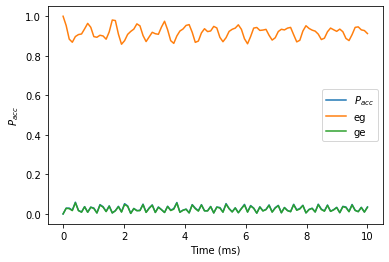

time used for solving mesolve: 0:01:27.339586  time used for ploting: 0:00:00.343711
n =  2.0
max= 0.054943447464297135


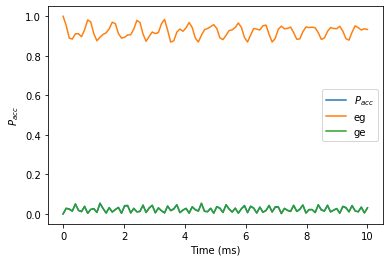

time used for solving mesolve: 0:01:00.610014  time used for ploting: 0:00:00.373490


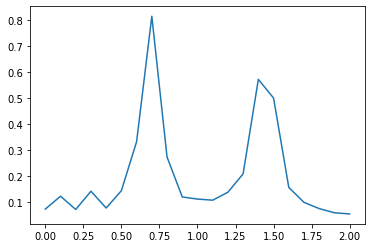

In [5]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
n = 21
ns = np.linspace(0, 2, n)
trans_2 = []

for n in ns:
    print('n = ', n)
    nu = np.sqrt(4*jj**2+n*Delta**2)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans_2.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(ns,trans_2)

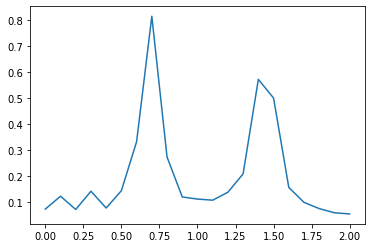

In [6]:
plt.plot(ns,trans_2)

The two peaks occur at $n = 0.7, 1.4$, where $\nu_{1,2} = 8.76, 12.11, \nu_2/\nu_1 = 1.41$

#### Case 1.2 $\Delta >> J$
$\Delta = 15, J = 1.3, \kappa = 1.4$
<br>
The code below finds the first suitable n = 1.45

n =  0.0
max= 0.020302639039893353


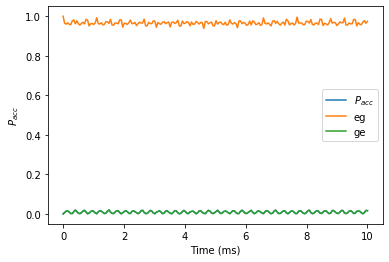

time used for solving mesolve: 0:00:12.185860  time used for ploting: 0:00:00.563570
n =  0.25
max= 0.021842258636427685


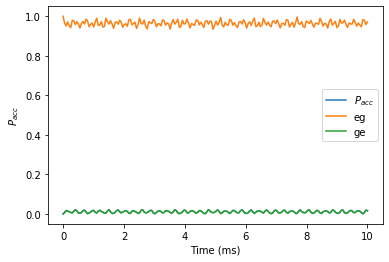

time used for solving mesolve: 0:00:32.188980  time used for ploting: 0:00:00.553270
n =  0.5
max= 0.027431089767712906


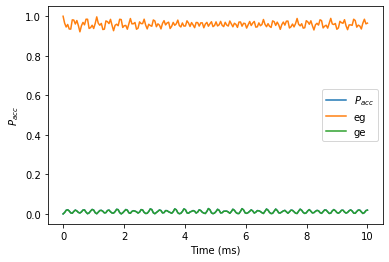

time used for solving mesolve: 0:01:08.871972  time used for ploting: 0:00:00.552442
n =  0.75
max= 0.3887834753790477


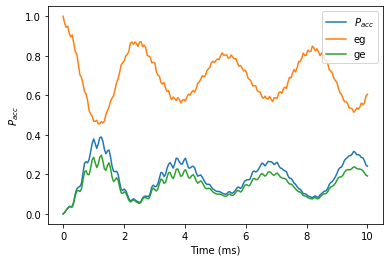

time used for solving mesolve: 0:01:13.803569  time used for ploting: 0:00:00.544398
n =  1.0
max= 0.052784664251343


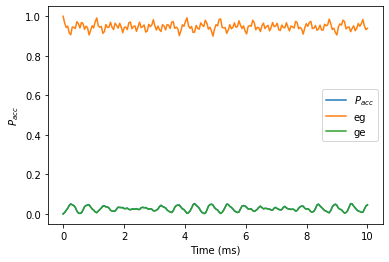

time used for solving mesolve: 0:01:01.674912  time used for ploting: 0:00:00.550231
n =  1.25
max= 0.4450822888876195


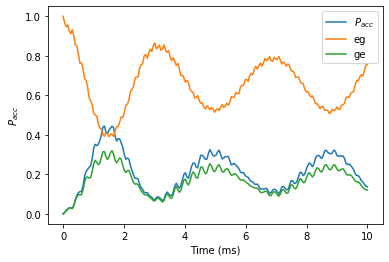

time used for solving mesolve: 0:01:00.128567  time used for ploting: 0:00:00.656589
n =  1.5
max= 0.03296971191422835


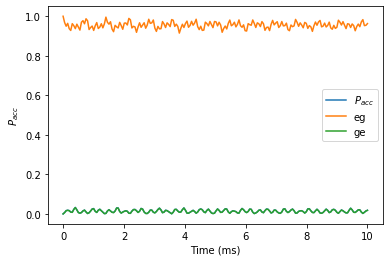

time used for solving mesolve: 0:01:43.590579  time used for ploting: 0:00:00.575716
n =  1.75
max= 0.021486049342000813


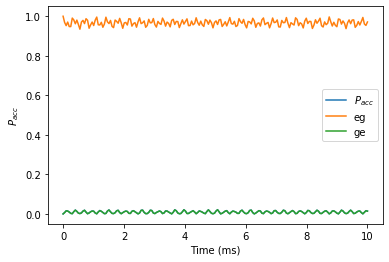

time used for solving mesolve: 0:02:01.488052  time used for ploting: 0:00:00.571170
n =  2.0
max= 0.019540986387301482


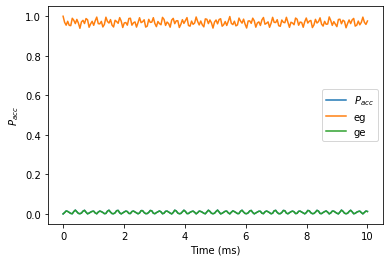

time used for solving mesolve: 0:01:28.710928  time used for ploting: 0:00:00.566434
n =  2.25
max= 0.018915313117463434


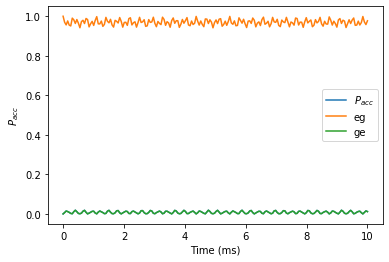

time used for solving mesolve: 0:01:24.096902  time used for ploting: 0:00:00.557511
n =  2.5
max= 0.018754462491123853


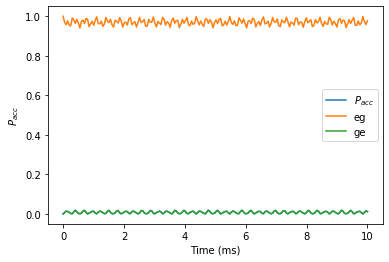

time used for solving mesolve: 0:01:35.800875  time used for ploting: 0:00:00.571701
n =  2.75
max= 0.018848773643671938


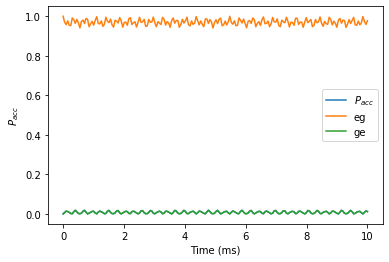

time used for solving mesolve: 0:01:45.602077  time used for ploting: 0:00:00.685815
n =  3.0
max= 0.01874199311482424


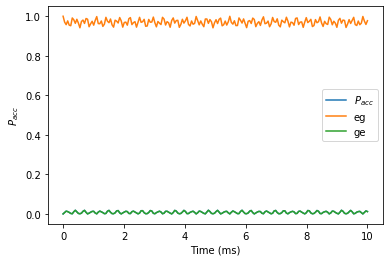

time used for solving mesolve: 0:01:50.128758  time used for ploting: 0:00:00.575953
n =  3.25
max= 0.0187041200889049


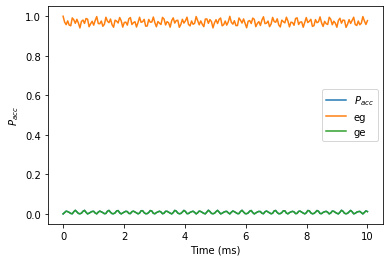

time used for solving mesolve: 0:01:51.205779  time used for ploting: 0:00:00.551251
n =  3.5
max= 0.01871023320850846


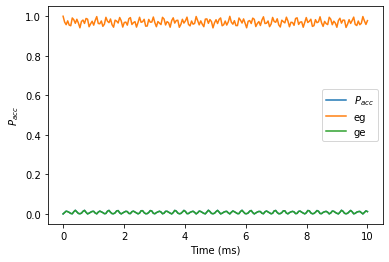

time used for solving mesolve: 0:01:57.227525  time used for ploting: 0:00:00.575779
n =  3.75
max= 0.01868098407246788


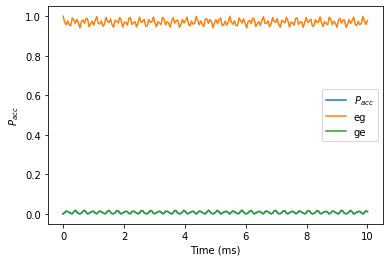

time used for solving mesolve: 0:02:46.374571  time used for ploting: 0:00:00.552803
n =  4.0
max= 0.01866415112337844


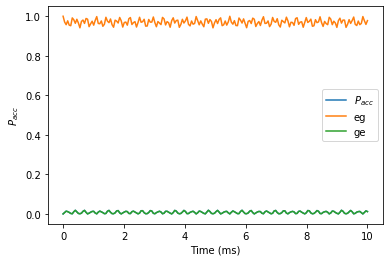

time used for solving mesolve: 0:02:02.854931  time used for ploting: 0:00:00.555826
n =  4.25
max= 0.01866101447725239


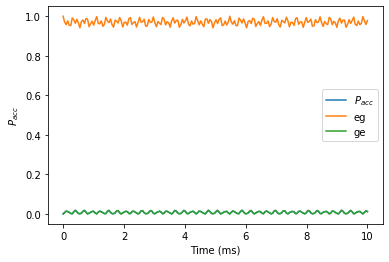

time used for solving mesolve: 0:02:07.487355  time used for ploting: 0:00:00.648011
n =  4.5
max= 0.018671550425326082


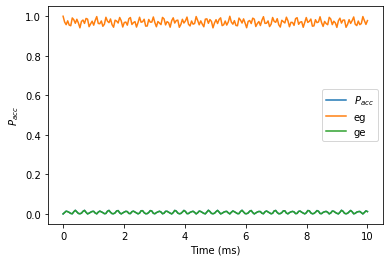

time used for solving mesolve: 0:02:07.687787  time used for ploting: 0:00:00.556380
n =  4.75
max= 0.018665707489222638


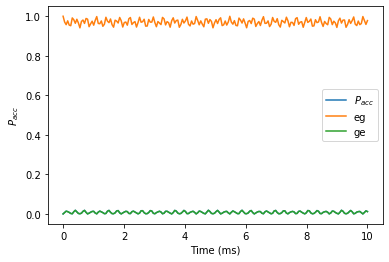

time used for solving mesolve: 0:02:14.591985  time used for ploting: 0:00:00.562598
n =  5.0
max= 0.018661786178441064


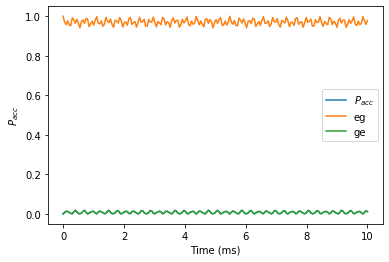

time used for solving mesolve: 0:02:22.300748  time used for ploting: 0:00:00.577195


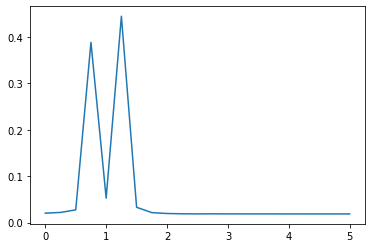

In [7]:
jj = 1.3
J = [jj]*4
Delta = 15
kappa = 1.4
n = 21
ns = np.linspace(0, 5, n)
trans_15 = []

for n in ns:
    print('n = ', n)
    nu = np.sqrt(4*jj**2+n*Delta**2)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans_15.append(exp3.time_scan(0, 10, 200, nth = 0.5))
plt.plot(ns,trans_15)

n =  0.5
max= 0.027431089767712906


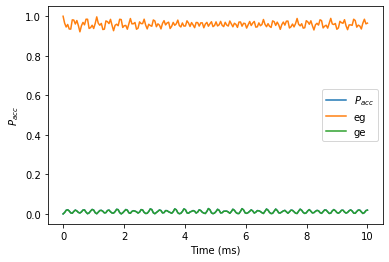

time used for solving mesolve: 0:01:05.123274  time used for ploting: 0:00:00.549508
n =  0.6
max= 0.04157556052856159


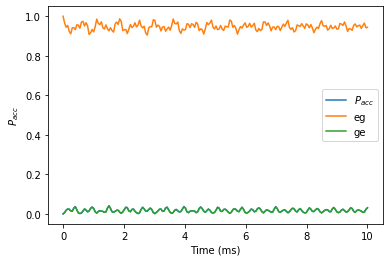

time used for solving mesolve: 0:01:05.614787  time used for ploting: 0:00:00.551702
n =  0.7
max= 0.11620191764101984


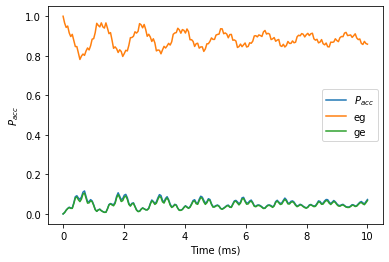

time used for solving mesolve: 0:00:53.525202  time used for ploting: 0:00:00.649358
n =  0.8
max= 0.5973304144494468


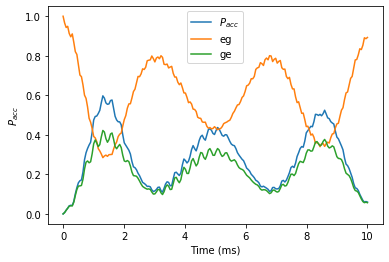

time used for solving mesolve: 0:00:50.143996  time used for ploting: 0:00:00.550672
n =  0.9
max= 0.08798610756333182


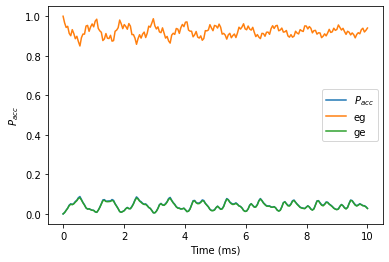

time used for solving mesolve: 0:01:00.197576  time used for ploting: 0:00:00.557682
n =  1.0
max= 0.052784664251343


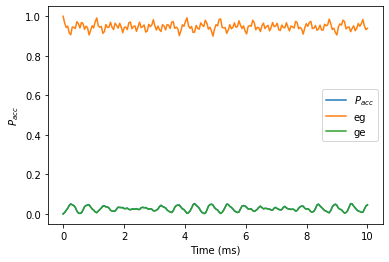

time used for solving mesolve: 0:01:01.549455  time used for ploting: 0:00:00.553321
n =  1.1
max= 0.059708240779049626


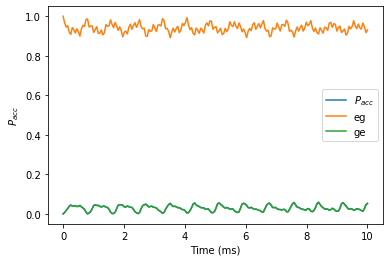

time used for solving mesolve: 0:01:03.718473  time used for ploting: 0:00:00.564660
n =  1.2000000000000002
max= 0.14519710723280493


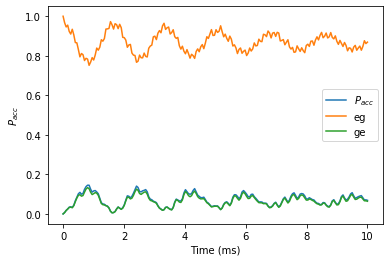

time used for solving mesolve: 0:00:27.518442  time used for ploting: 0:00:00.549587
n =  1.3
max= 0.5145824793624174


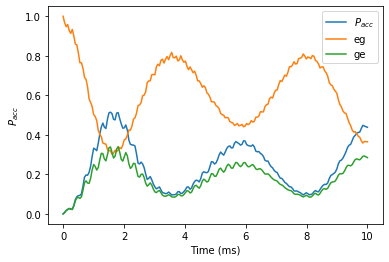

time used for solving mesolve: 0:01:55.255027  time used for ploting: 0:00:00.759331
n =  1.4
max= 0.06302142705176642


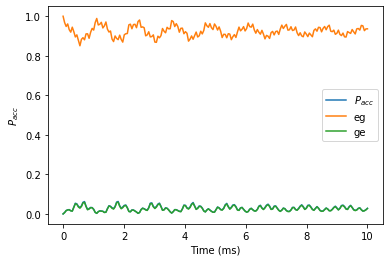

time used for solving mesolve: 0:01:00.023321  time used for ploting: 0:00:00.556219
n =  1.5
max= 0.03296971191422835


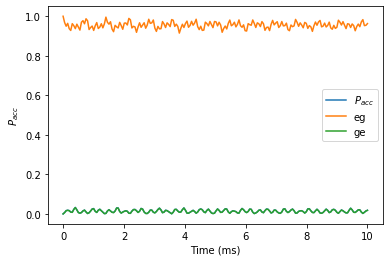

time used for solving mesolve: 0:01:46.021802  time used for ploting: 0:00:00.568476


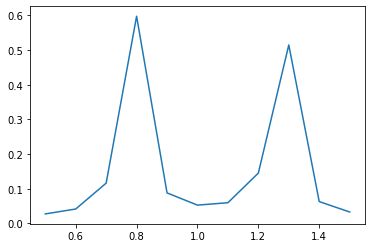

In [8]:
jj = 1.3
J = [jj]*4
Delta = 15
kappa = 1.4
n = 11
ns = np.linspace(0.5, 1.5, n)
trans_15 = []

for n in ns:
    print('n = ', n)
    nu = np.sqrt(4*jj**2+n*Delta**2)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans_15.append(exp3.time_scan(0, 10, 200, nth = 0.5))
plt.plot(ns,trans_15)

The two peaks occur at $n = 0.8, 1.3$, where $\nu_{1,2} = 13.67, 17.30, \nu_2/\nu_1 = 1.27$

#### Case 1.3 $\Delta >> J$
$\Delta = 20, J = 1.3, \kappa = 1.4$
<br>
The code below finds the first suitable n = 1.45

n =  0.0
max= 0.010240132284158373


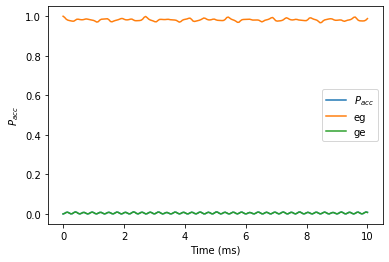

time used for solving mesolve: 0:00:14.515927  time used for ploting: 0:00:00.550557
n =  0.25
max= 0.010848627368771277


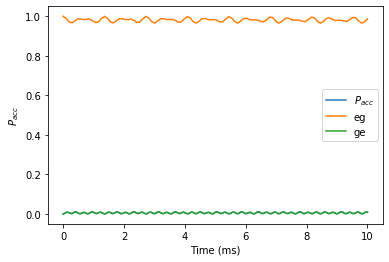

time used for solving mesolve: 0:00:41.147941  time used for ploting: 0:00:00.575239
n =  0.5
max= 0.012016506168233085


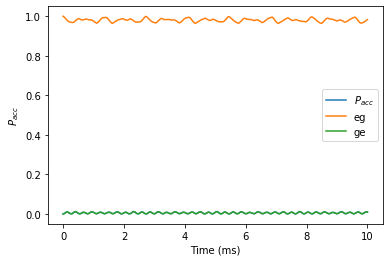

time used for solving mesolve: 0:01:26.609173  time used for ploting: 0:00:00.564982
n =  0.75
max= 0.04222800990902949


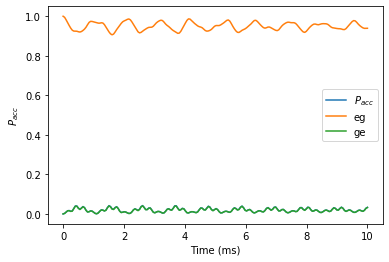

time used for solving mesolve: 0:01:13.409484  time used for ploting: 0:00:00.657975
n =  1.0
max= 0.029905285676815024


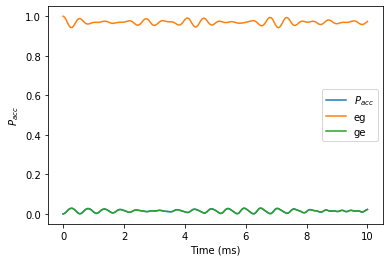

time used for solving mesolve: 0:01:47.691832  time used for ploting: 0:00:00.551808
n =  1.25
max= 0.10102168259353293


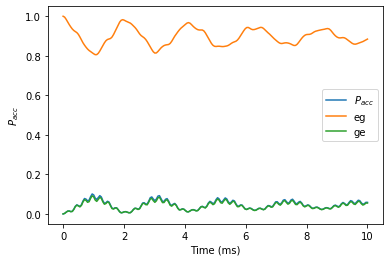

time used for solving mesolve: 0:02:16.738399  time used for ploting: 0:00:00.548660
n =  1.5
max= 0.012529203714980815


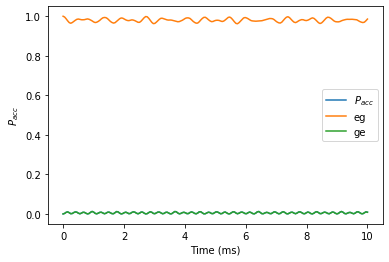

time used for solving mesolve: 0:02:49.331447  time used for ploting: 0:00:00.565617
n =  1.75
max= 0.010645483394823074


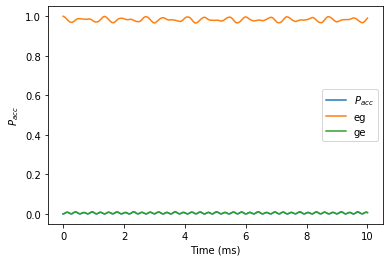

time used for solving mesolve: 0:01:53.857840  time used for ploting: 0:00:00.562721
n =  2.0
max= 0.010244014314661206


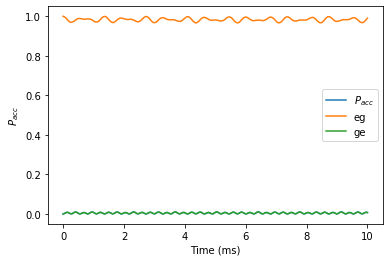

time used for solving mesolve: 0:01:58.909557  time used for ploting: 0:00:00.556700
n =  2.25
max= 0.010196397025858752


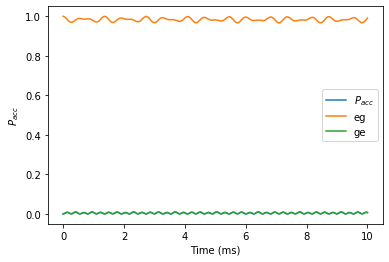

time used for solving mesolve: 0:03:35.102348  time used for ploting: 0:00:00.646358
n =  2.5
max= 0.010103534609113002


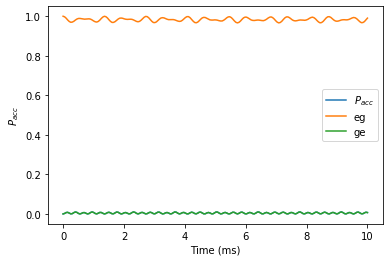

time used for solving mesolve: 0:02:08.834280  time used for ploting: 0:00:00.564547
n =  2.75
max= 0.010090208277373102


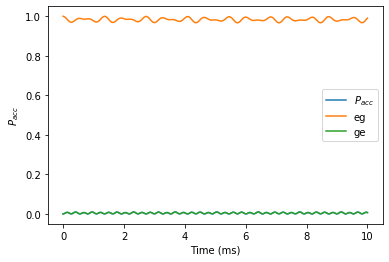

time used for solving mesolve: 0:03:36.246565  time used for ploting: 0:00:00.559715
n =  3.0
max= 0.010071190295932295


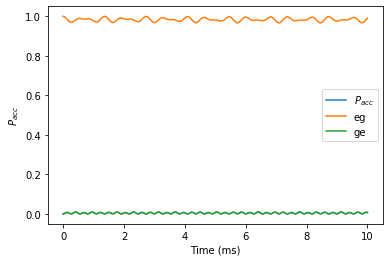

time used for solving mesolve: 0:02:38.086539  time used for ploting: 0:00:00.570078
n =  3.25
max= 0.010068037932661696


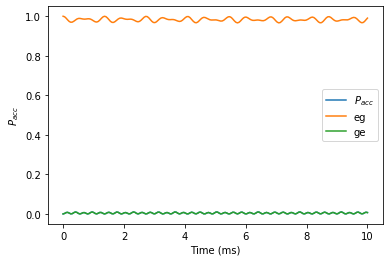

time used for solving mesolve: 0:02:38.966317  time used for ploting: 0:00:00.587490
n =  3.5
max= 0.010051631104660697


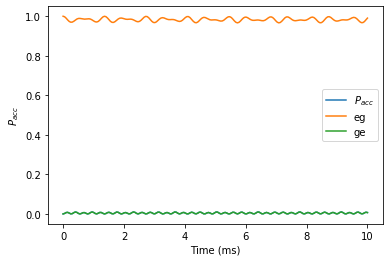

time used for solving mesolve: 0:03:51.177504  time used for ploting: 0:00:00.671909
n =  3.75
max= 0.010049194833869525


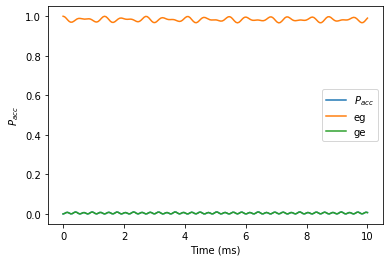

time used for solving mesolve: 0:03:13.483535  time used for ploting: 0:00:00.713964
n =  4.0
max= 0.010053878163396793


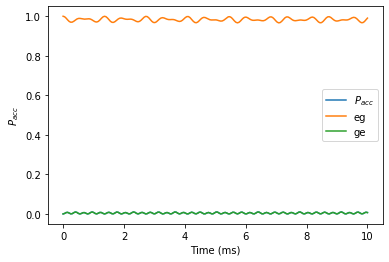

time used for solving mesolve: 0:03:03.175004  time used for ploting: 0:00:00.556993
n =  4.25
max= 0.010047686706158661


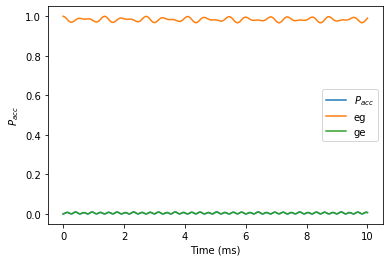

time used for solving mesolve: 0:03:00.619486  time used for ploting: 0:00:00.561743
n =  4.5
max= 0.010048077767965452


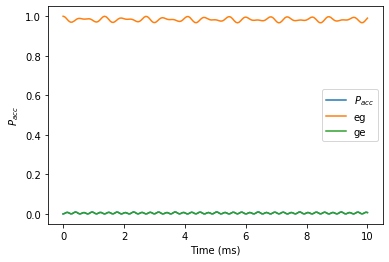

time used for solving mesolve: 0:03:13.001944  time used for ploting: 0:00:00.614651
n =  4.75
max= 0.010049222782923034


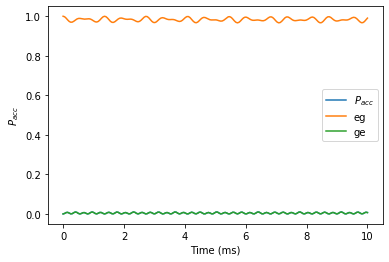

time used for solving mesolve: 0:03:09.139310  time used for ploting: 0:00:00.546436
n =  5.0
max= 0.010047407077298454


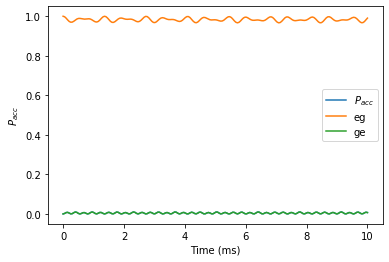

time used for solving mesolve: 0:05:28.360368  time used for ploting: 0:00:00.559268


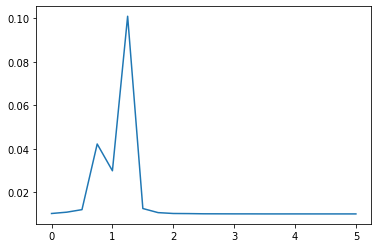

In [9]:
jj = 1.3
J = [jj]*4
Delta = 20
kappa = 1.4
n = 21
ns = np.linspace(0, 5, n)
trans_20 = []

for n in ns:
    print('n = ', n)
    nu = np.sqrt(4*jj**2+n*Delta**2)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans_20.append(exp3.time_scan(0, 10, 200, nth = 0.5))
plt.plot(ns,trans_20)

n =  0.5
max= 0.012016506168233085


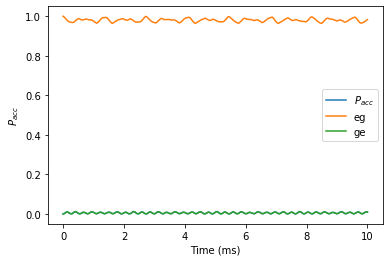

time used for solving mesolve: 0:01:23.938011  time used for ploting: 0:00:00.658307
n =  0.575
max= 0.012803205929937401


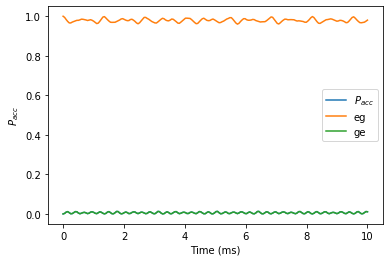

time used for solving mesolve: 0:01:30.009928  time used for ploting: 0:00:00.547739
n =  0.65
max= 0.01652774254676847


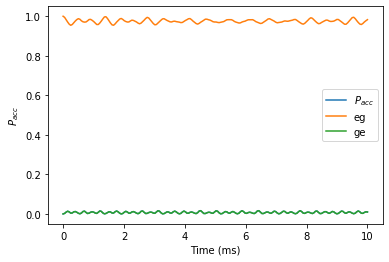

time used for solving mesolve: 0:01:07.568221  time used for ploting: 0:00:00.552612
n =  0.725
max= 0.031175499868104053


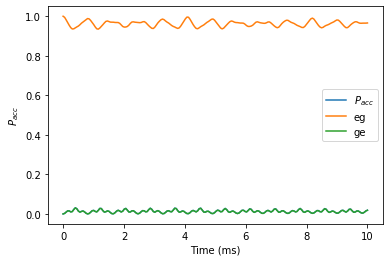

time used for solving mesolve: 0:01:55.407449  time used for ploting: 0:00:00.550825
n =  0.8
max= 0.18786745264538066


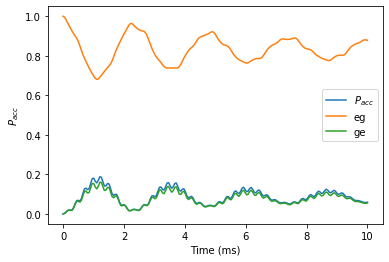

time used for solving mesolve: 0:01:14.618519  time used for ploting: 0:00:00.547257
n =  0.875
max= 0.13248241495021382


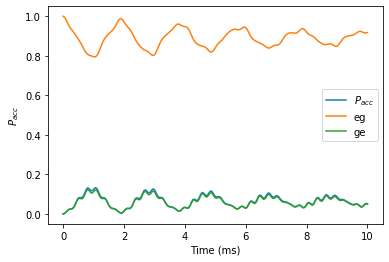

time used for solving mesolve: 0:02:12.820391  time used for ploting: 0:00:00.587572
n =  0.95
max= 0.03746654827206266


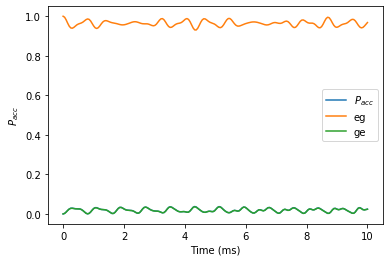

time used for solving mesolve: 0:01:25.781539  time used for ploting: 0:00:00.549156
n =  1.025
max= 0.030325006383063107


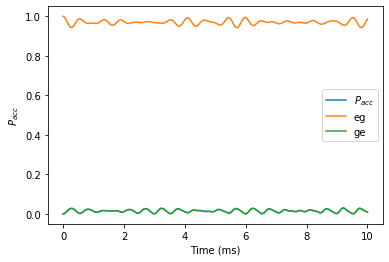

time used for solving mesolve: 0:02:02.490072  time used for ploting: 0:00:00.657861
n =  1.1
max= 0.04258264668480943


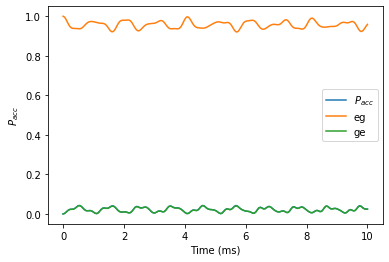

time used for solving mesolve: 0:01:16.010096  time used for ploting: 0:00:00.614416
n =  1.1749999999999998
max= 0.2565488625825512


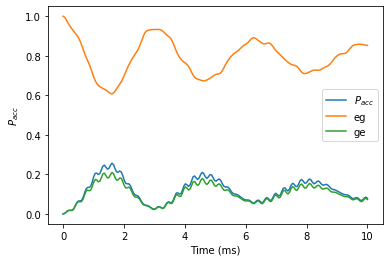

time used for solving mesolve: 0:01:25.827486  time used for ploting: 0:00:00.572885
n =  1.25
max= 0.10102168259353293


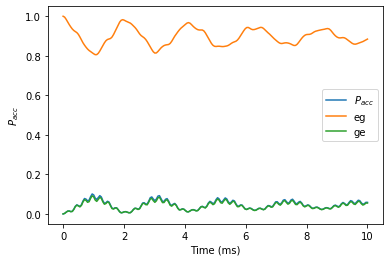

time used for solving mesolve: 0:02:27.150674  time used for ploting: 0:00:00.566207
n =  1.325
max= 0.02503680182851541


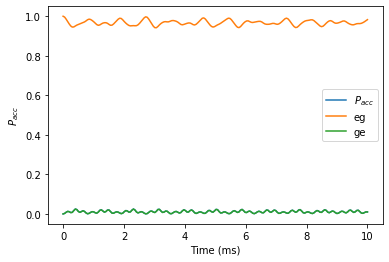

time used for solving mesolve: 0:01:29.790185  time used for ploting: 0:00:00.574302
n =  1.4
max= 0.015452032862556727


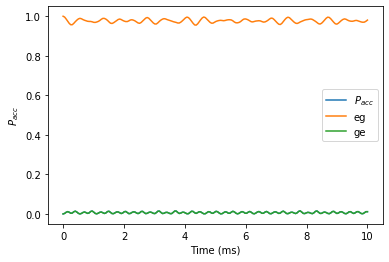

time used for solving mesolve: 0:01:47.788676  time used for ploting: 0:00:00.561671
n =  1.475
max= 0.01302309533713701


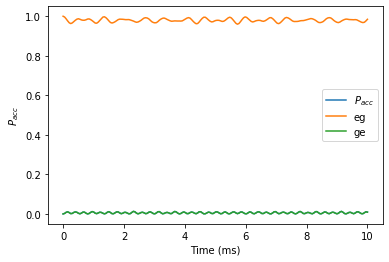

time used for solving mesolve: 0:03:02.188667  time used for ploting: 0:00:00.543830
n =  1.55
max= 0.01082385908365113


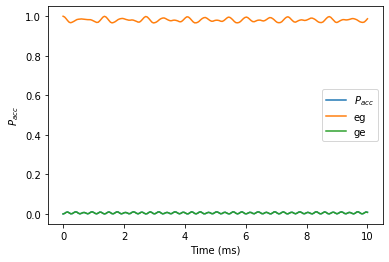

time used for solving mesolve: 0:02:30.090249  time used for ploting: 0:00:00.667395
n =  1.625
max= 0.01119951459890868


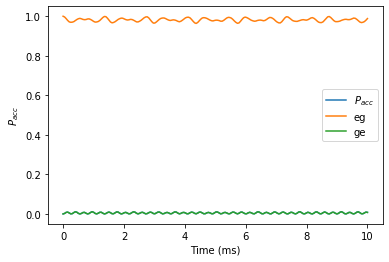

time used for solving mesolve: 0:01:51.399949  time used for ploting: 0:00:00.551629
n =  1.7
max= 0.010853919024710577


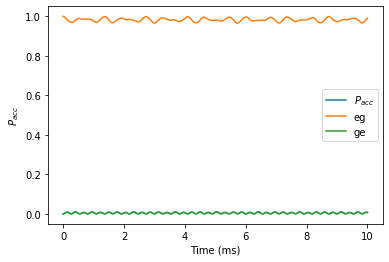

time used for solving mesolve: 0:01:53.577780  time used for ploting: 0:00:00.555984
n =  1.775
max= 0.010596304271653853


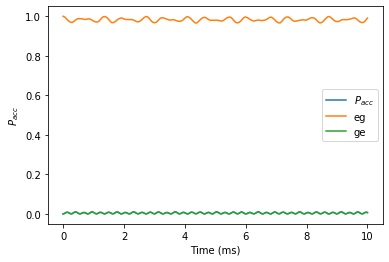

time used for solving mesolve: 0:01:54.186494  time used for ploting: 0:00:00.567970
n =  1.8499999999999999
max= 0.010165673562468376


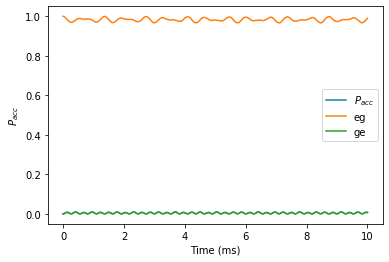

time used for solving mesolve: 0:03:31.083279  time used for ploting: 0:00:00.567399
n =  1.925
max= 0.010321954772165715


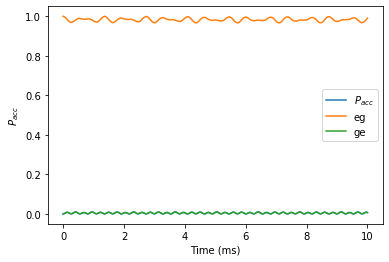

time used for solving mesolve: 0:03:31.931933  time used for ploting: 0:00:00.565306
n =  2.0
max= 0.010244014314661206


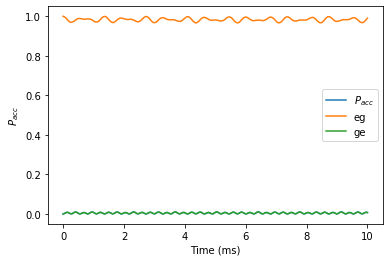

time used for solving mesolve: 0:02:04.028298  time used for ploting: 0:00:00.582192


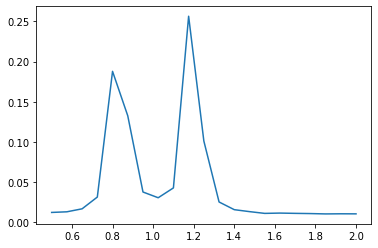

In [10]:
jj = 1.3
J = [jj]*4
Delta = 20
kappa = 1.4
n = 21
ns = np.linspace(0.5, 2, n)
trans_20 = []

for n in ns:
    print('n = ', n)
    nu = np.sqrt(4*jj**2+n*Delta**2)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans_20.append(exp3.time_scan(0, 10, 200, nth = 0.5))
plt.plot(ns,trans_20)

The two peaks occur at $n = 0.8, 1.18$, where $\nu_{1,2} = 18.08, 21.79, \nu_2/\nu_1 = 1.21$

#### Case 2. Normal parameters (J ~ $\Delta$)
J = 1.3, $\Delta$ = 4.56, $\kappa$ = 1.4

n =  0.0
max= 0.7285636590580641


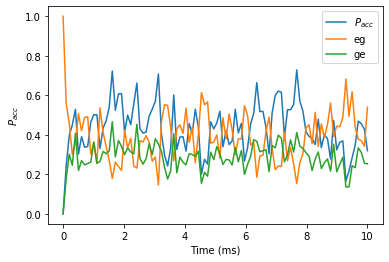

time used for solving mesolve: 0:00:11.384462  time used for ploting: 0:00:00.338566
n =  0.15
max= 0.6240662218791497


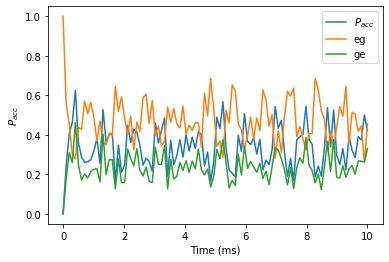

time used for solving mesolve: 0:00:11.841394  time used for ploting: 0:00:00.332246
n =  0.3
max= 0.7057176308941832


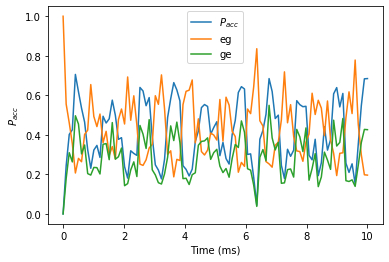

time used for solving mesolve: 0:00:09.669614  time used for ploting: 0:00:00.339735
n =  0.44999999999999996
max= 0.75421266657017


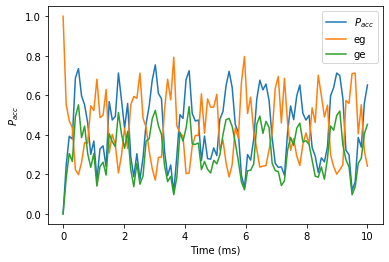

time used for solving mesolve: 0:00:13.735377  time used for ploting: 0:00:00.492308
n =  0.6
max= 0.6301203324218695


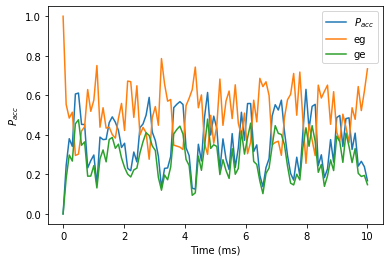

time used for solving mesolve: 0:00:16.079969  time used for ploting: 0:00:00.349560
n =  0.75
max= 0.5239711536561457


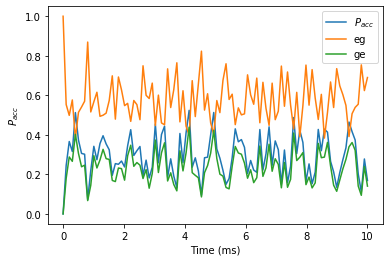

time used for solving mesolve: 0:00:17.522356  time used for ploting: 0:00:00.339914
n =  0.8999999999999999
max= 0.4344433268875511


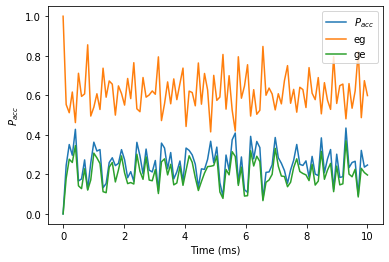

time used for solving mesolve: 0:00:13.975712  time used for ploting: 0:00:00.365262
n =  1.05
max= 0.38693899896130485


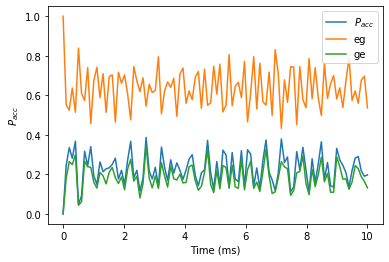

time used for solving mesolve: 0:00:16.500367  time used for ploting: 0:00:00.346807
n =  1.2
max= 0.36139487198934034


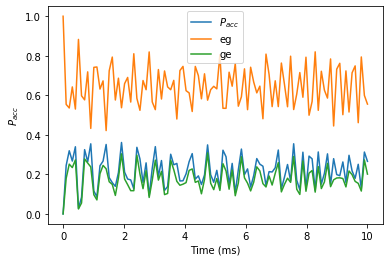

time used for solving mesolve: 0:00:18.400120  time used for ploting: 0:00:00.374796
n =  1.3499999999999999
max= 0.36931565205476724


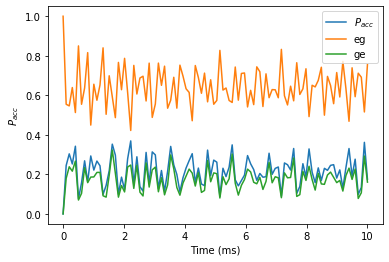

time used for solving mesolve: 0:00:22.231188  time used for ploting: 0:00:00.366202
n =  1.5
max= 0.45675297279968097


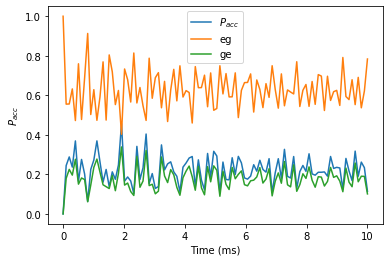

time used for solving mesolve: 0:00:21.266560  time used for ploting: 0:00:00.463101
n =  1.65
max= 0.4547664328088556


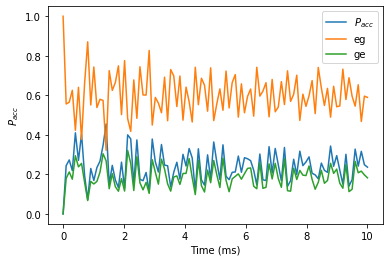

time used for solving mesolve: 0:00:22.517924  time used for ploting: 0:00:00.352838
n =  1.7999999999999998
max= 0.5271626908131637


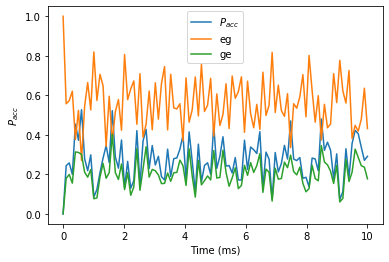

time used for solving mesolve: 0:00:23.047195  time used for ploting: 0:00:00.369507
n =  1.95
max= 0.6983387409379844


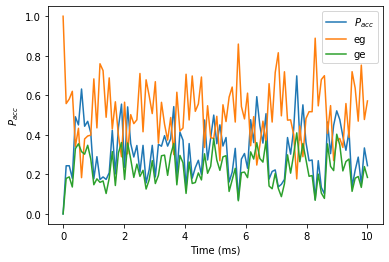

time used for solving mesolve: 0:00:35.393039  time used for ploting: 0:00:00.352249
n =  2.1
max= 0.783865234412338


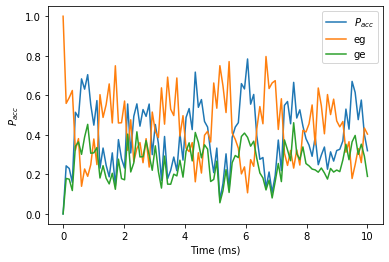

time used for solving mesolve: 0:00:22.188311  time used for ploting: 0:00:00.344118
n =  2.25
max= 0.8049487346725273


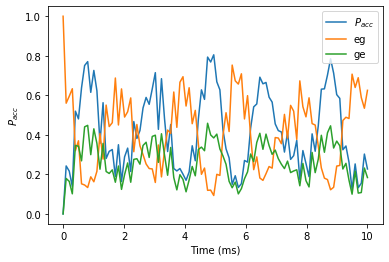

time used for solving mesolve: 0:00:23.620069  time used for ploting: 0:00:00.357133
n =  2.4
max= 0.7429685215069327


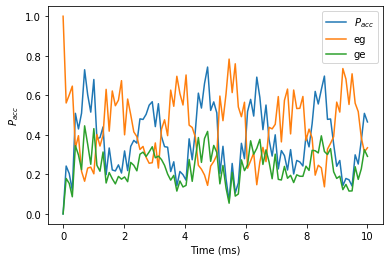

time used for solving mesolve: 0:00:22.710334  time used for ploting: 0:00:00.345887
n =  2.55
max= 0.6045750315358794


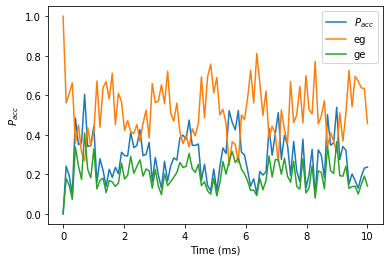

time used for solving mesolve: 0:00:38.602582  time used for ploting: 0:00:00.347807
n =  2.6999999999999997
max= 0.4622135299347303


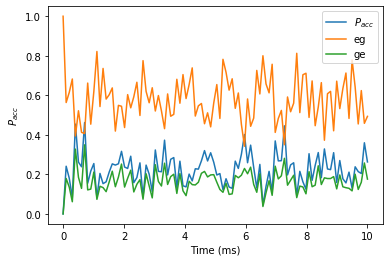

time used for solving mesolve: 0:00:24.446349  time used for ploting: 0:00:00.357095
n =  2.85
max= 0.4204267674284161


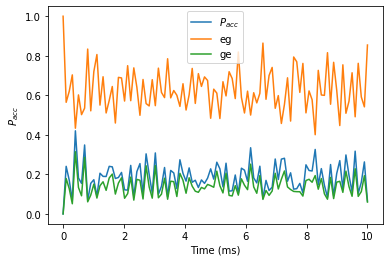

time used for solving mesolve: 0:00:24.764781  time used for ploting: 0:00:00.454270
n =  3.0
max= 0.3874571882316187


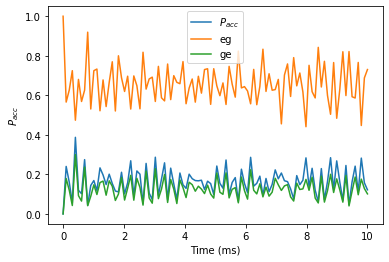

time used for solving mesolve: 0:00:43.924236  time used for ploting: 0:00:00.357163


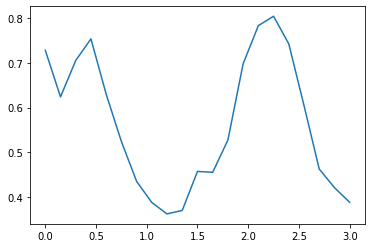

In [13]:
jj = 1.3
J = [jj]*4
Delta = 4.56
kappa = 1.4
n = 21
ns = np.linspace(0, 3, n)
trans2_1 = []

for n in ns:
    print('n = ', n)
    nu = np.sqrt(4*jj**2+n*Delta**2)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans2_1.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(ns,trans2_1)

#### Case 3. J >> $\Delta$
J = 1.3, $\Delta$ = 0.1, $\kappa$ = 1.4

m =  1.0 n =  1.0


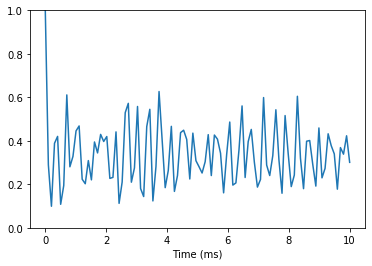

max= 0.8803832032443332


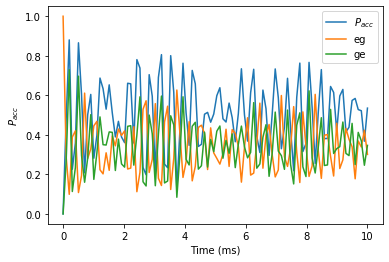

time used for solving mesolve: 0:00:06.103626  time used for ploting: 0:00:00.507519
m =  1.0 n =  1.75


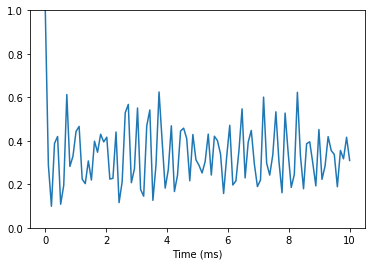

max= 0.8804435742047224


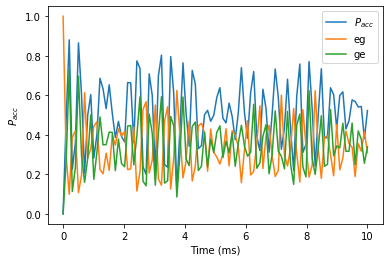

time used for solving mesolve: 0:00:05.934910  time used for ploting: 0:00:00.681594
m =  1.0 n =  2.5


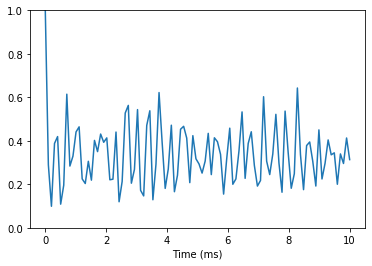

max= 0.8805039047340061


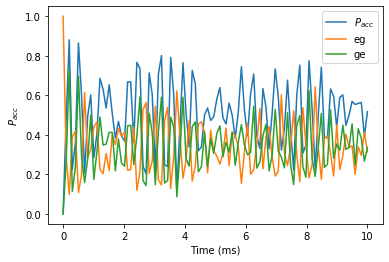

time used for solving mesolve: 0:00:06.502731  time used for ploting: 0:00:00.581628
m =  1.0 n =  3.25


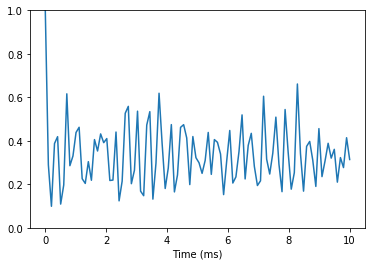

max= 0.8805641949707196


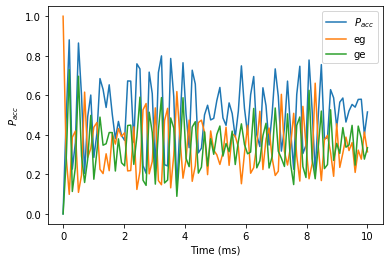

time used for solving mesolve: 0:00:06.215765  time used for ploting: 0:00:00.595125
m =  1.0 n =  4.0


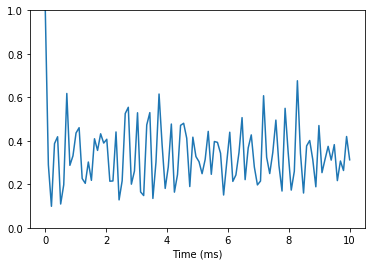

max= 0.8806244450517939


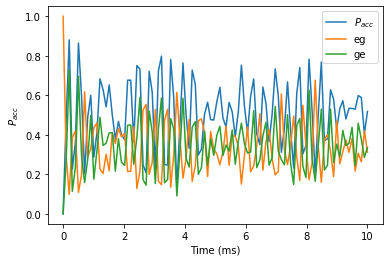

time used for solving mesolve: 0:00:05.844904  time used for ploting: 0:00:00.609359
m =  2.75 n =  1.0


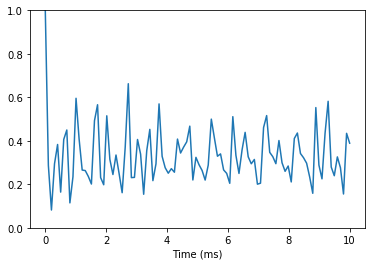

max= 0.9016763948528613


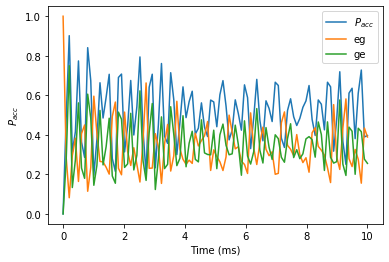

time used for solving mesolve: 0:00:09.976593  time used for ploting: 0:00:00.553080
m =  2.75 n =  1.75


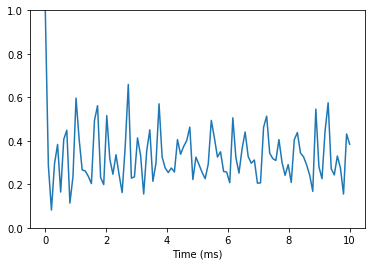

max= 0.9017245883742004


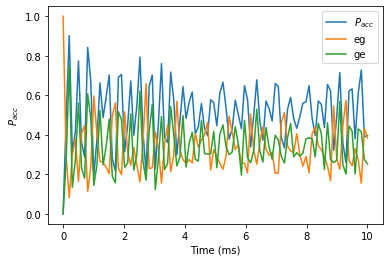

time used for solving mesolve: 0:00:08.395430  time used for ploting: 0:00:00.551168
m =  2.75 n =  2.5


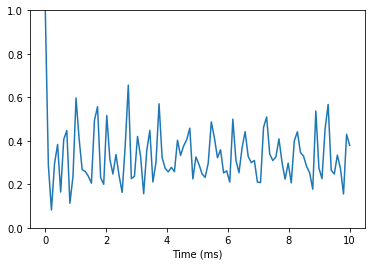

max= 0.9017727531439175


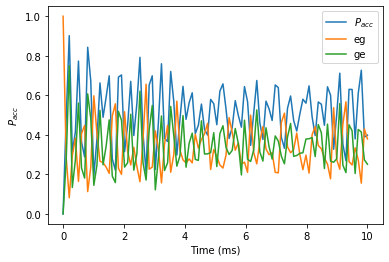

time used for solving mesolve: 0:00:09.380071  time used for ploting: 0:00:00.596331
m =  2.75 n =  3.25


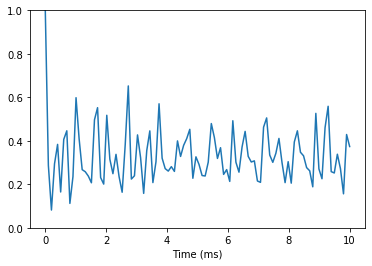

max= 0.901820889158864


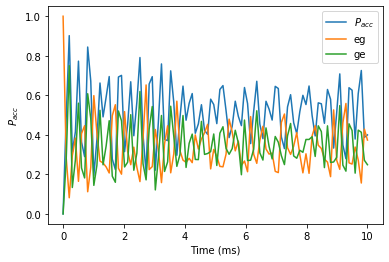

time used for solving mesolve: 0:00:09.847615  time used for ploting: 0:00:00.665217
m =  2.75 n =  4.0


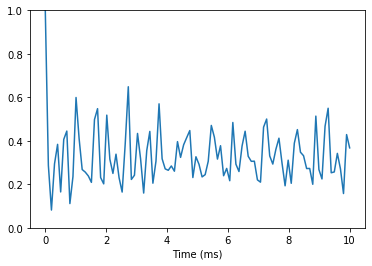

max= 0.9018689964157987


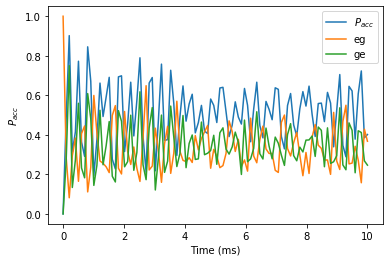

time used for solving mesolve: 0:00:08.776492  time used for ploting: 0:00:00.578774
m =  4.5 n =  1.0


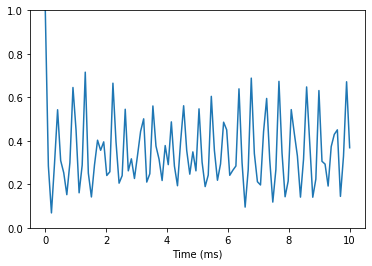

max= 0.9184266421864703


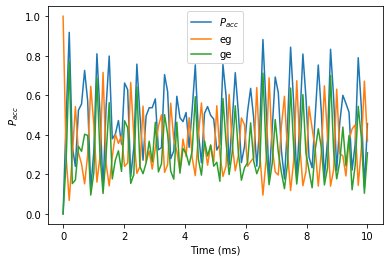

time used for solving mesolve: 0:00:10.528652  time used for ploting: 0:00:00.578749
m =  4.5 n =  1.75


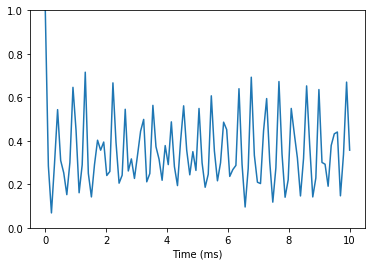

max= 0.9184633775217224


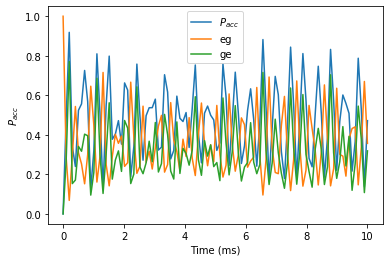

time used for solving mesolve: 0:00:09.828006  time used for ploting: 0:00:00.595389
m =  4.5 n =  2.5


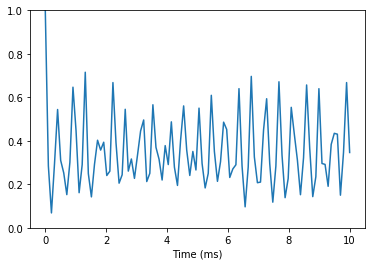

max= 0.9185000842662274


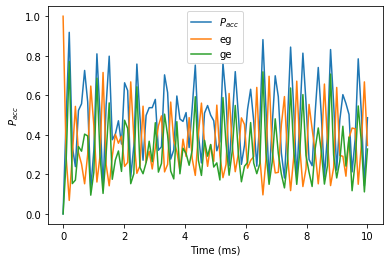

time used for solving mesolve: 0:00:09.218057  time used for ploting: 0:00:00.567363
m =  4.5 n =  3.25


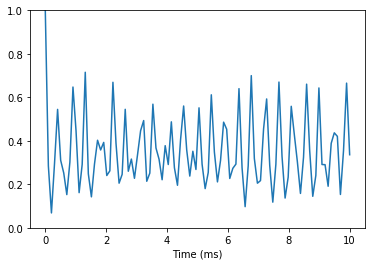

max= 0.9185367625031348


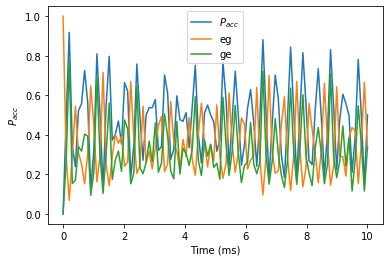

time used for solving mesolve: 0:00:09.951153  time used for ploting: 0:00:00.739702
m =  4.5 n =  4.0


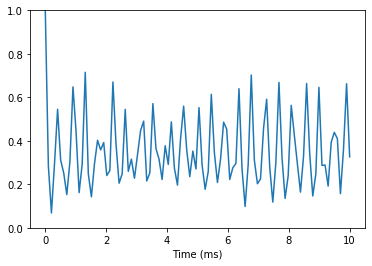

max= 0.9185734120986007


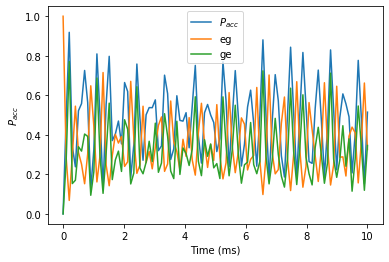

time used for solving mesolve: 0:00:10.816244  time used for ploting: 0:00:00.697481
m =  6.25 n =  1.0


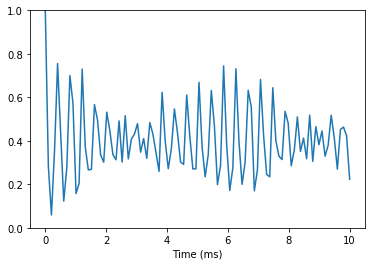

max= 0.9308070303713045


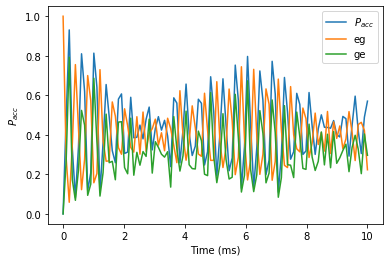

time used for solving mesolve: 0:00:11.657657  time used for ploting: 0:00:00.701626
m =  6.25 n =  1.75


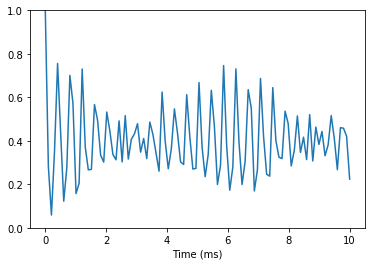

max= 0.9308334302303924


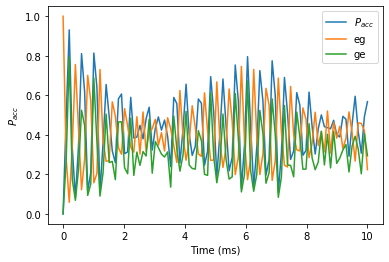

time used for solving mesolve: 0:00:10.694389  time used for ploting: 0:00:00.602447
m =  6.25 n =  2.5


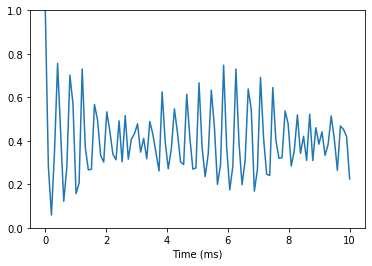

max= 0.9308598070698066


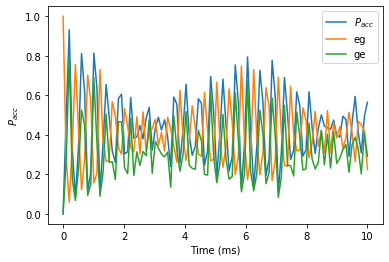

time used for solving mesolve: 0:00:10.737023  time used for ploting: 0:00:00.558675
m =  6.25 n =  3.25


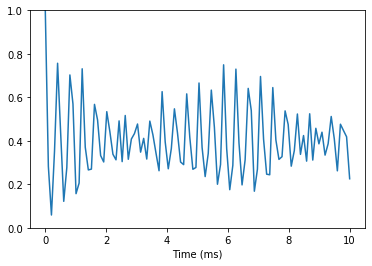

max= 0.9308861608777161


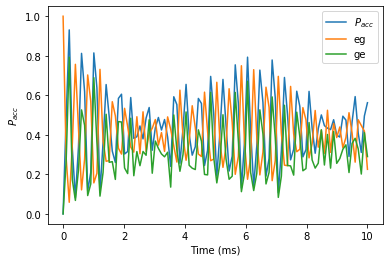

time used for solving mesolve: 0:00:10.259368  time used for ploting: 0:00:00.592262
m =  6.25 n =  4.0


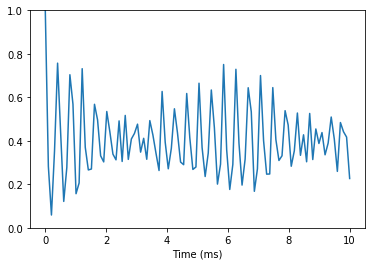

max= 0.9309124916901101


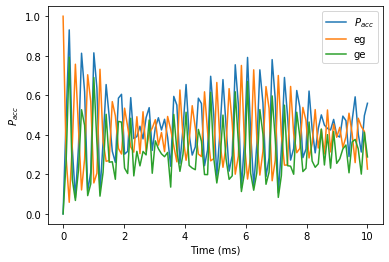

time used for solving mesolve: 0:00:11.504458  time used for ploting: 0:00:00.593519
m =  8.0 n =  1.0


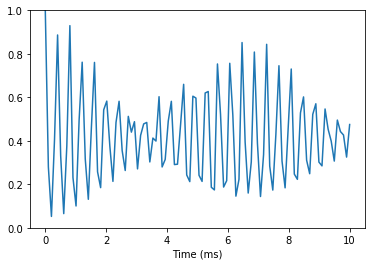

max= 0.9396348329183126


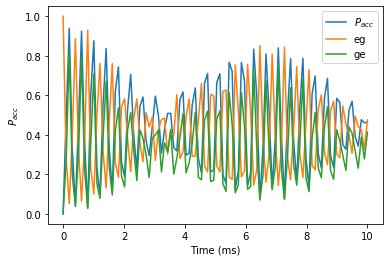

time used for solving mesolve: 0:00:14.469930  time used for ploting: 0:00:00.574337
m =  8.0 n =  1.75


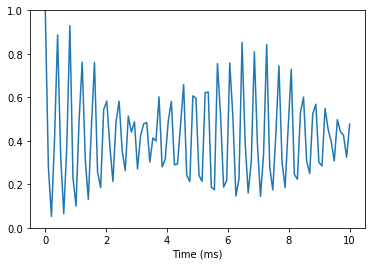

max= 0.9396537194797082


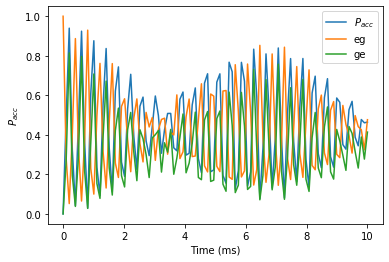

time used for solving mesolve: 0:00:14.322490  time used for ploting: 0:00:00.624595
m =  8.0 n =  2.5


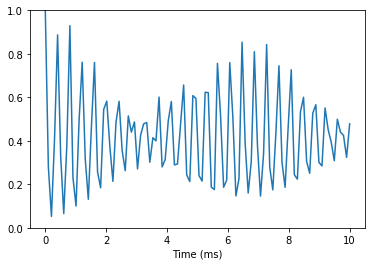

max= 0.9396725910432675


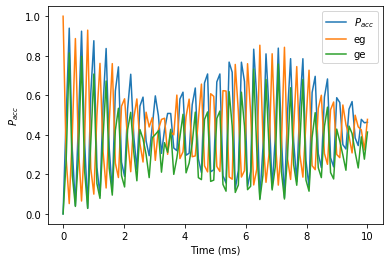

time used for solving mesolve: 0:00:14.657471  time used for ploting: 0:00:00.608004
m =  8.0 n =  3.25


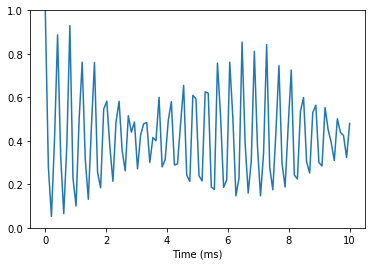

max= 0.9396914476289469


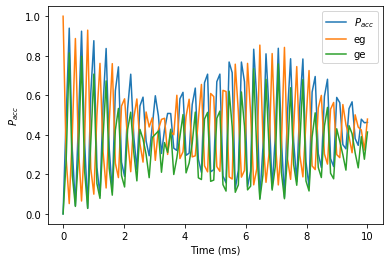

time used for solving mesolve: 0:00:14.297517  time used for ploting: 0:00:00.586892
m =  8.0 n =  4.0


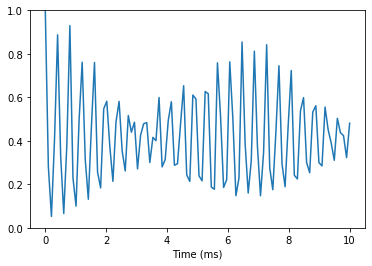

max= 0.9397102892566893


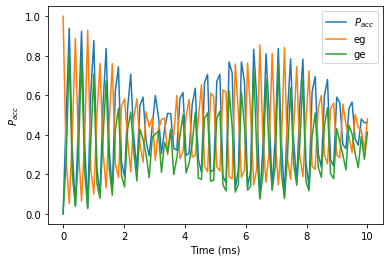

time used for solving mesolve: 0:00:14.084777  time used for ploting: 0:00:00.649013


In [37]:
jj = 1.3
J = [jj]*4
Delta = 0.1
kappa = 1.4
n = 5
m = 5
ns = np.linspace(1.0, 4, n)
ms = np.linspace(1, 8, m)
trans3 = [[0] * n for i in range(m)]
i,j = 0,0
for m in ms:
    for n in ns:
        print('m = ',m, 'n = ', n)
        nu = np.sqrt(m*jj**2+n*Delta**2)
        exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
        trans3[i][j] = exp3.time_scan(0, 10, 100, nth = 0.5)
        j+=1
    i+=1
    j = 0

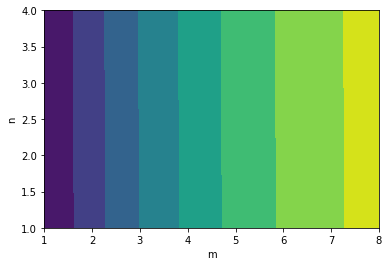

In [38]:
nn,mm = np.meshgrid(ns,ms)
plt.contourf(mm,nn,trans3)
plt.xlabel('m')
plt.ylabel('n')
plt.show()

### Step 2. Check integer k in $\nu_{eff} = \sqrt{n\Delta^2+mJ^2}/k$
#### Case 1. $\Delta >> J$
$\Delta = 10, J = 1.3, \kappa = 1.4$

k =  1.0
max= 0.8553270206835069


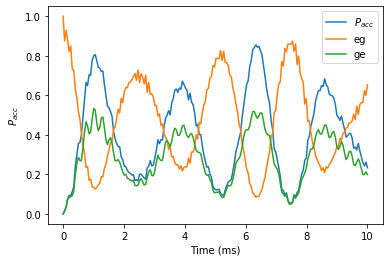

time used for solving mesolve: 0:00:26.694042  time used for ploting: 0:00:00.505049
k =  1.25
max= 0.08036095126656707


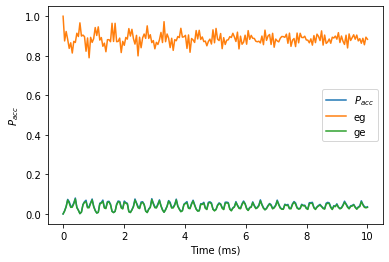

time used for solving mesolve: 0:00:22.695058  time used for ploting: 0:00:00.528471
k =  1.5
max= 0.07191206550974766


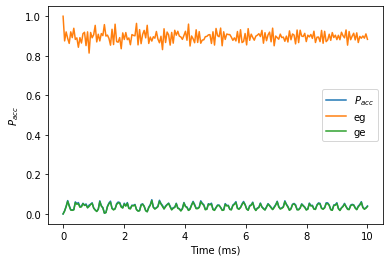

time used for solving mesolve: 0:00:21.714959  time used for ploting: 0:00:00.536959
k =  1.75
max= 0.08046353295269551


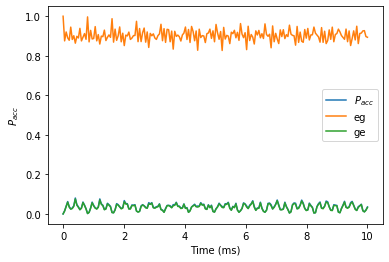

time used for solving mesolve: 0:00:16.639073  time used for ploting: 0:00:00.541118
k =  2.0
max= 0.8890468071556725


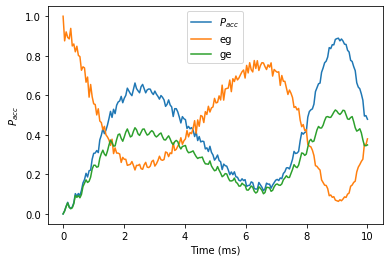

time used for solving mesolve: 0:00:11.648890  time used for ploting: 0:00:00.537968
k =  2.25
max= 0.07850885927820292


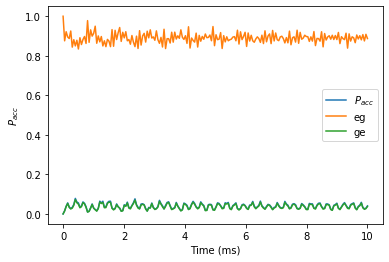

time used for solving mesolve: 0:00:10.568052  time used for ploting: 0:00:00.626206
k =  2.5
max= 0.0655326460920674


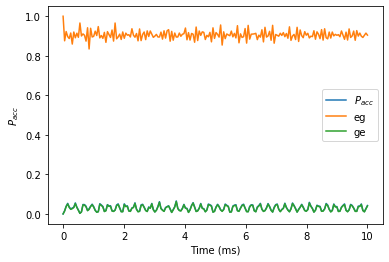

time used for solving mesolve: 0:00:10.629720  time used for ploting: 0:00:00.525917
k =  2.75
max= 0.07826538585774864


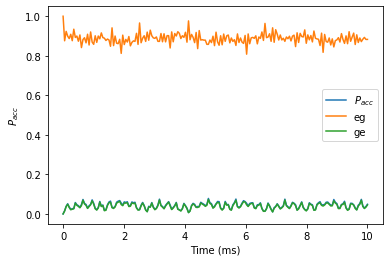

time used for solving mesolve: 0:00:09.945340  time used for ploting: 0:00:00.527854
k =  3.0
max= 0.5402262749393882


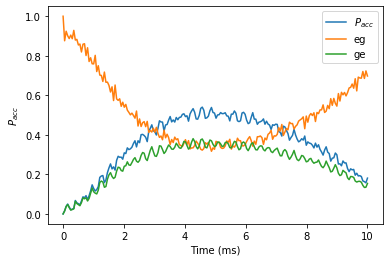

time used for solving mesolve: 0:00:08.817296  time used for ploting: 0:00:00.536758
k =  3.25
max= 0.07303633778439372


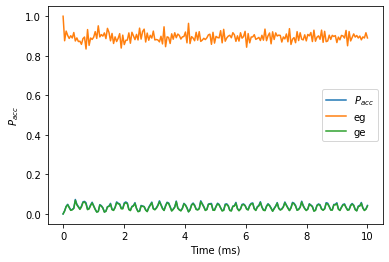

time used for solving mesolve: 0:00:08.832154  time used for ploting: 0:00:00.534795
k =  3.5
max= 0.11187258511126125


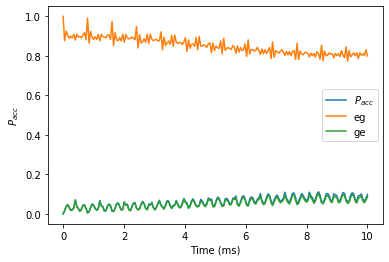

time used for solving mesolve: 0:00:08.784948  time used for ploting: 0:00:00.541347
k =  3.7500000000000004
max= 0.06951048976832609


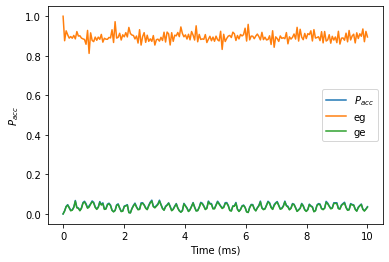

time used for solving mesolve: 0:00:09.223058  time used for ploting: 0:00:00.555132
k =  4.0
max= 0.34708654989669374


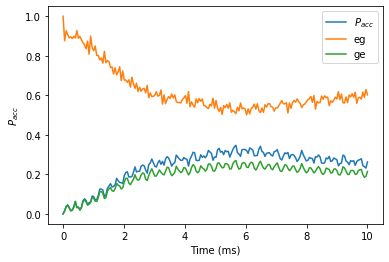

time used for solving mesolve: 0:00:08.970715  time used for ploting: 0:00:00.658579
k =  4.25
max= 0.07331948122675425


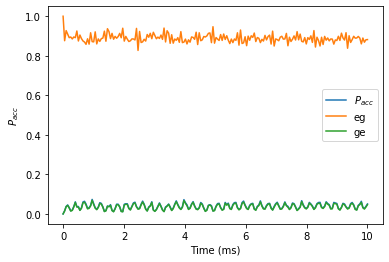

time used for solving mesolve: 0:00:08.688829  time used for ploting: 0:00:00.553530
k =  4.5
max= 0.061008244031850366


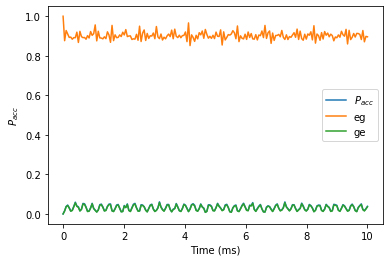

time used for solving mesolve: 0:00:08.643516  time used for ploting: 0:00:00.534254
k =  4.75
max= 0.06931676325250102


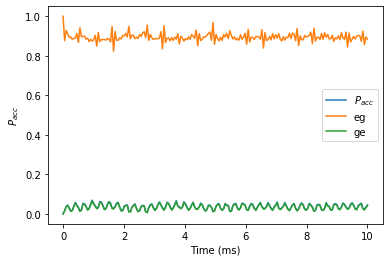

time used for solving mesolve: 0:00:08.794547  time used for ploting: 0:00:00.547564
k =  5.0
max= 0.24846775466643775


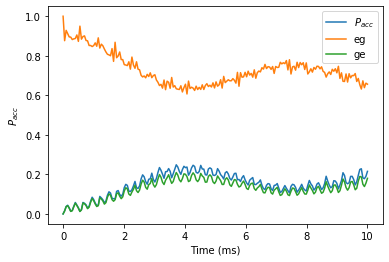

time used for solving mesolve: 0:00:08.818613  time used for ploting: 0:00:00.533964


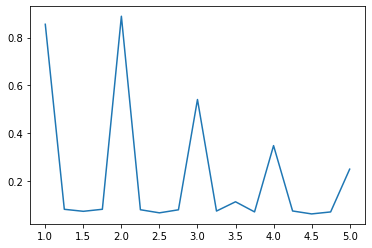

In [15]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
NU = np.sqrt(4*jj**2+1.45*Delta**2)/np.sqrt(2)
k = np.linspace(1, 5, 17)
nus = NU/k
trans4 = []
for nu in nus:
    print('k = ',NU/nu)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans4.append(exp3.time_scan(0, 10, 200, nth = 0.5))
plt.plot(k,trans4)

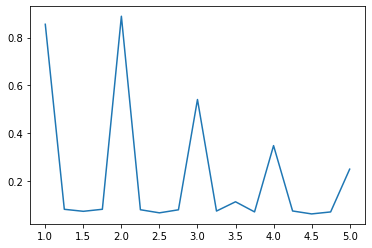

In [16]:
plt.plot(k,trans4)

#### Case 2. Normal parameters (J ~ $\Delta$)
J = 1.3, $\Delta$ = 4.56, $\kappa$ = 1.4

When $\Delta$ becomes smaller, the k-interger condition is no longer strict.

k =  1.0
max= 0.7962879876888688


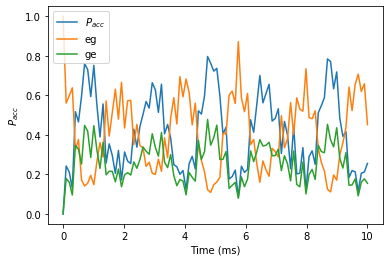

time used for solving mesolve: 0:00:21.754085  time used for ploting: 0:00:00.351064
k =  1.125
max= 0.4973051800877463


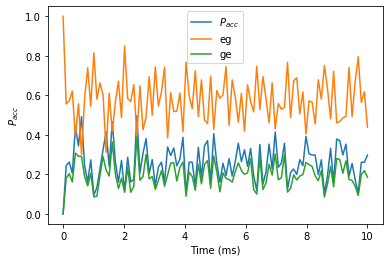

time used for solving mesolve: 0:00:12.051134  time used for ploting: 0:00:00.348535
k =  1.25
max= 0.3552836186309675


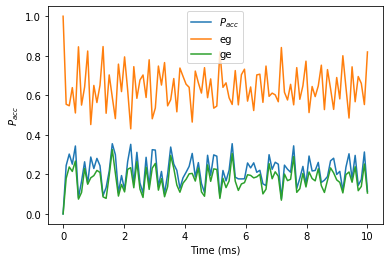

time used for solving mesolve: 0:00:18.862221  time used for ploting: 0:00:00.348081
k =  1.375
max= 0.39177568759166465


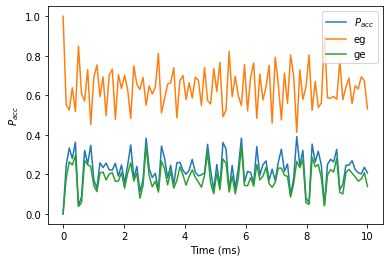

time used for solving mesolve: 0:00:15.488743  time used for ploting: 0:00:00.355567
k =  1.5
max= 0.4567255217018628


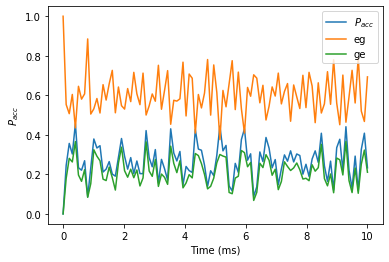

time used for solving mesolve: 0:00:12.519611  time used for ploting: 0:00:00.346915
k =  1.6249999999999998
max= 0.5741494251329101


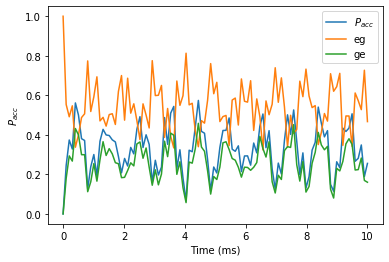

time used for solving mesolve: 0:00:15.591668  time used for ploting: 0:00:00.350262
k =  1.75
max= 0.7290903111357022


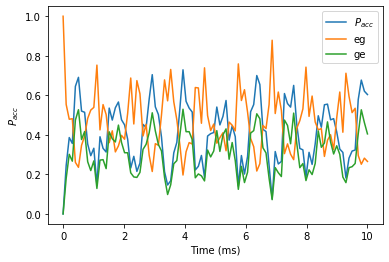

time used for solving mesolve: 0:00:12.807035  time used for ploting: 0:00:00.351586
k =  1.875
max= 0.7964464371100963


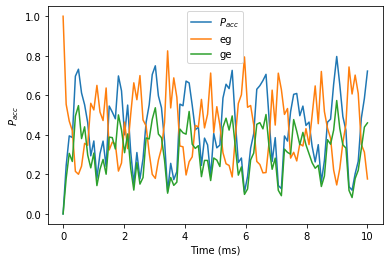

time used for solving mesolve: 0:00:12.527649  time used for ploting: 0:00:00.356719
k =  2.0
max= 0.7600328934928541


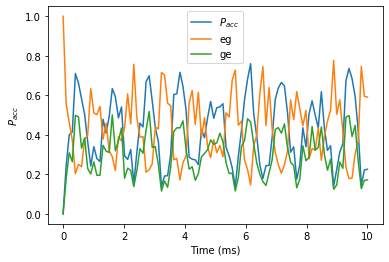

time used for solving mesolve: 0:00:08.876170  time used for ploting: 0:00:00.349092
k =  2.125
max= 0.6917189288648263


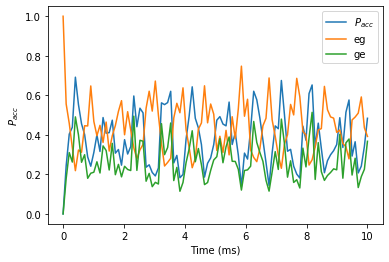

time used for solving mesolve: 0:00:09.274812  time used for ploting: 0:00:00.345370
k =  2.25
max= 0.656199658857386


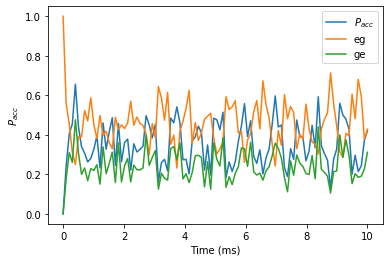

time used for solving mesolve: 0:00:08.470370  time used for ploting: 0:00:00.342212
k =  2.375
max= 0.6178692257217787


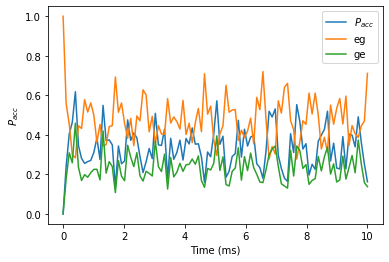

time used for solving mesolve: 0:00:11.682962  time used for ploting: 0:00:00.344033
k =  2.5
max= 0.5842831473324513


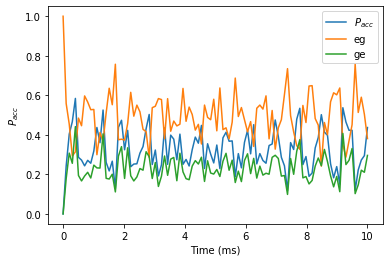

time used for solving mesolve: 0:00:11.502910  time used for ploting: 0:00:00.342428
k =  2.625
max= 0.5917605052813566


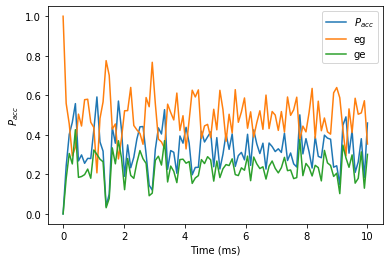

time used for solving mesolve: 0:00:11.584672  time used for ploting: 0:00:00.344075
k =  2.75
max= 0.639733093038768


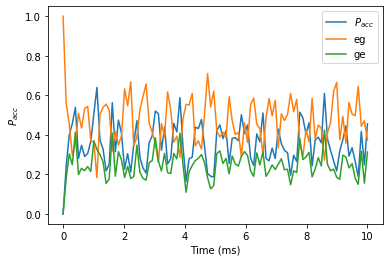

time used for solving mesolve: 0:00:11.215933  time used for ploting: 0:00:00.353584
k =  2.875
max= 0.8001757915820213


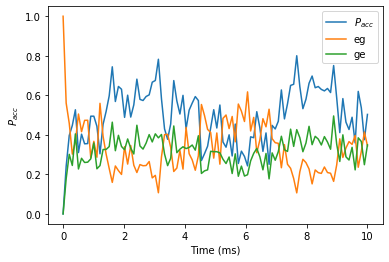

time used for solving mesolve: 0:00:08.903968  time used for ploting: 0:00:00.371777
k =  3.0
max= 0.6469751036127929


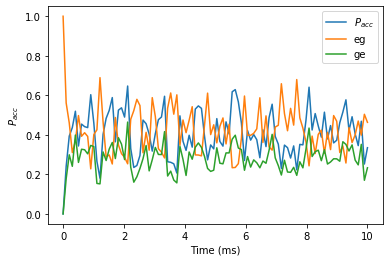

time used for solving mesolve: 0:00:09.202902  time used for ploting: 0:00:00.344135
k =  3.125
max= 0.6794635568790802


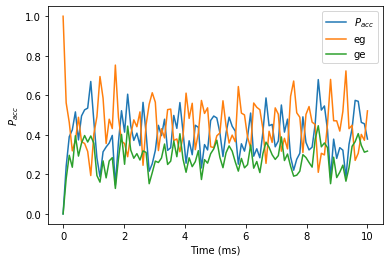

time used for solving mesolve: 0:00:08.770987  time used for ploting: 0:00:00.342177
k =  3.2499999999999996
max= 0.6888736435588799


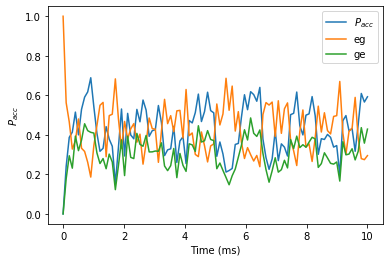

time used for solving mesolve: 0:00:08.669236  time used for ploting: 0:00:00.338139
k =  3.3749999999999996
max= 0.7945330101958429


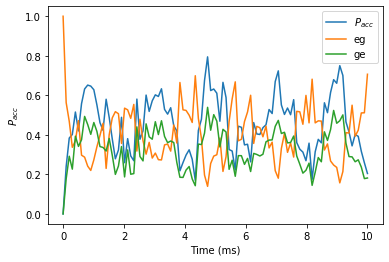

time used for solving mesolve: 0:00:08.364655  time used for ploting: 0:00:00.346333
k =  3.5
max= 0.7195543541238212


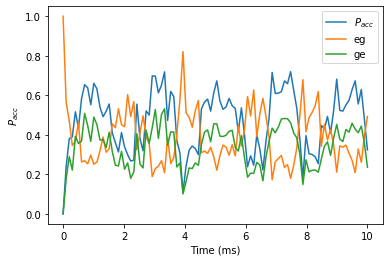

time used for solving mesolve: 0:00:08.411096  time used for ploting: 0:00:00.346765
k =  3.625
max= 0.7227639308267683


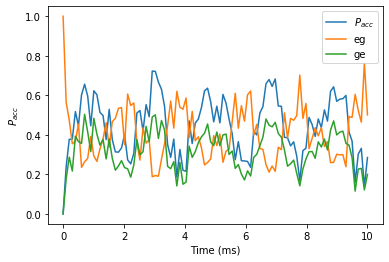

time used for solving mesolve: 0:00:08.378747  time used for ploting: 0:00:00.343508
k =  3.75
max= 0.6697482895933461


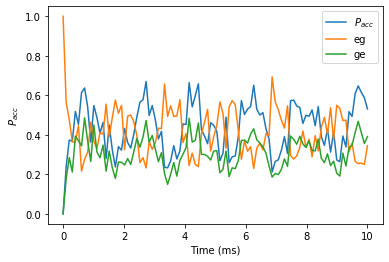

time used for solving mesolve: 0:00:08.240438  time used for ploting: 0:00:00.346666
k =  3.875
max= 0.6402414953431997


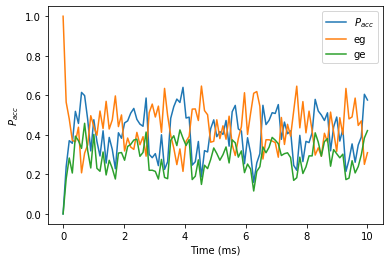

time used for solving mesolve: 0:00:08.288400  time used for ploting: 0:00:00.343928
k =  4.0
max= 0.6044958240259115


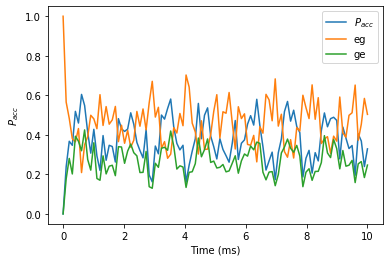

time used for solving mesolve: 0:00:08.118667  time used for ploting: 0:00:00.350130


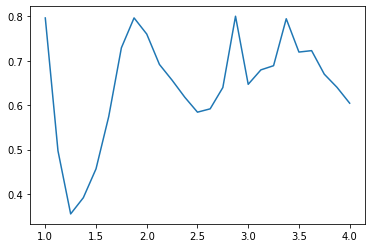

In [17]:
jj = 1.3
J = [jj]*4
Delta = 4.56
kappa = 1.4
NU = np.sqrt(6.25*jj**2+2.125*Delta**2)
k = np.linspace(1, 4, 25)
nus = NU/k
trans5=[]
for nu in nus:
    print('k = ',NU/nu)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans5.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(k,trans5)

k =  1.0
max= 0.7731850192564912


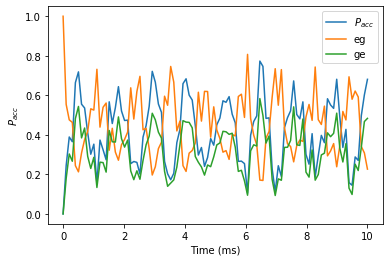

time used for solving mesolve: 0:00:13.016817  time used for ploting: 0:00:00.355534
k =  1.125
max= 0.7565731791664557


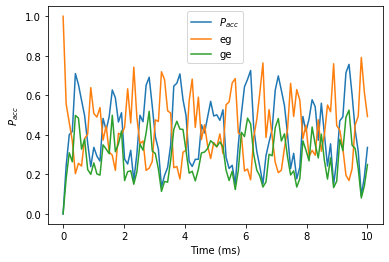

time used for solving mesolve: 0:00:08.994346  time used for ploting: 0:00:00.403955
k =  1.25
max= 0.6614569885306912


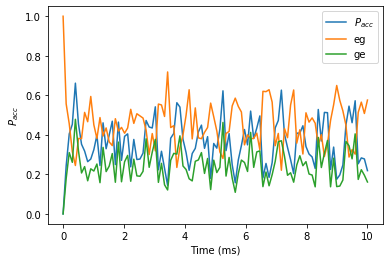

time used for solving mesolve: 0:00:08.976547  time used for ploting: 0:00:00.357814
k =  1.375
max= 0.6379202949733334


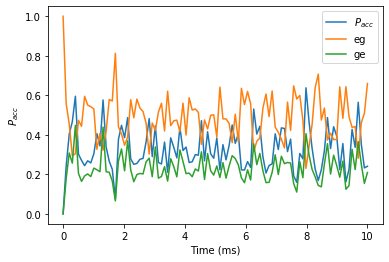

time used for solving mesolve: 0:00:11.561390  time used for ploting: 0:00:00.359346
k =  1.5
max= 0.6431453690391165


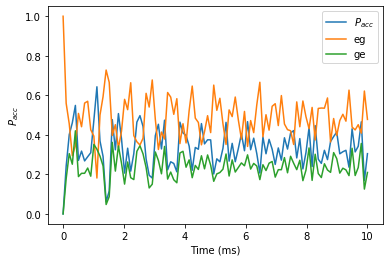

time used for solving mesolve: 0:00:11.343785  time used for ploting: 0:00:00.344550
k =  1.625
max= 0.8347555812390848


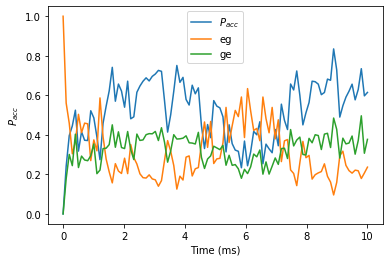

time used for solving mesolve: 0:00:10.822812  time used for ploting: 0:00:00.342474
k =  1.75
max= 0.6813951014624006


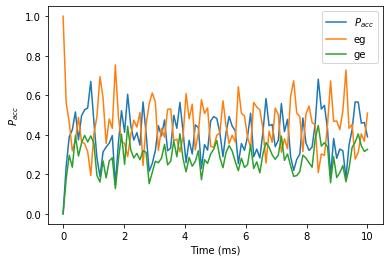

time used for solving mesolve: 0:00:08.631605  time used for ploting: 0:00:00.350730
k =  1.8750000000000002
max= 0.7647168529678511


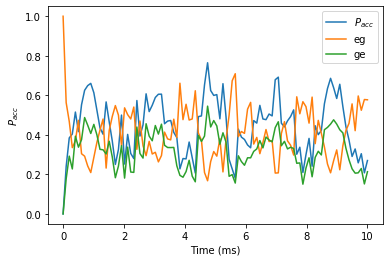

time used for solving mesolve: 0:00:08.488159  time used for ploting: 0:00:00.364633
k =  2.0
max= 0.7497261412095427


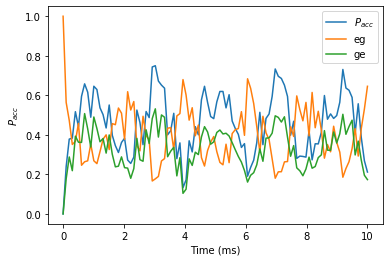

time used for solving mesolve: 0:00:08.723612  time used for ploting: 0:00:00.367206
k =  2.125
max= 0.6795656083766064


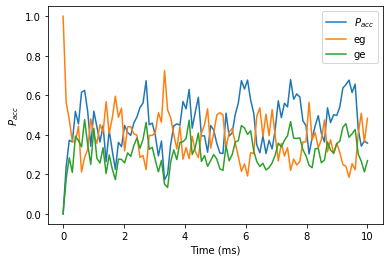

time used for solving mesolve: 0:00:08.371858  time used for ploting: 0:00:00.348625
k =  2.25
max= 0.6020422798415884


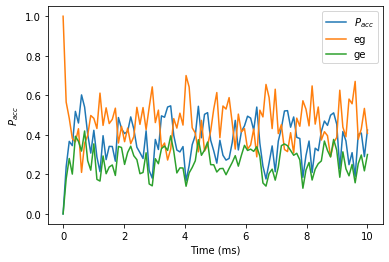

time used for solving mesolve: 0:00:08.371962  time used for ploting: 0:00:00.351185
k =  2.375
max= 0.5612326340333625


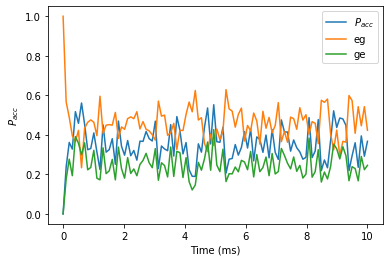

time used for solving mesolve: 0:00:08.223058  time used for ploting: 0:00:00.351967
k =  2.5
max= 0.5666026958893207


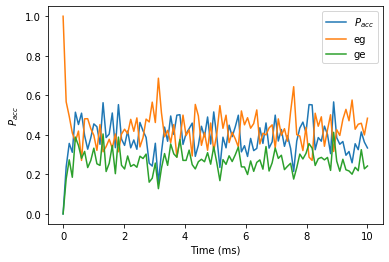

time used for solving mesolve: 0:00:08.173837  time used for ploting: 0:00:00.349070
k =  2.625
max= 0.7541240940571066


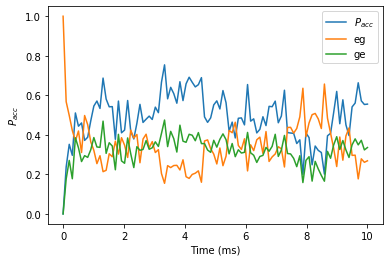

time used for solving mesolve: 0:00:07.924342  time used for ploting: 0:00:00.349568
k =  2.75
max= 0.7735098421555924


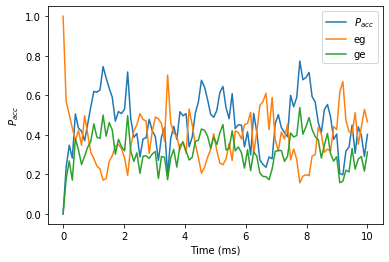

time used for solving mesolve: 0:00:08.163004  time used for ploting: 0:00:00.358499
k =  2.875
max= 0.7333260943920783


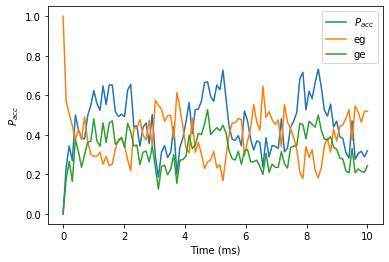

time used for solving mesolve: 0:00:06.457595  time used for ploting: 0:00:00.365340
k =  3.0
max= 0.592263129442615


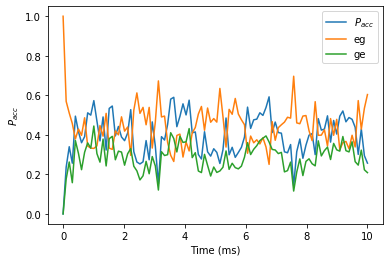

time used for solving mesolve: 0:00:06.330725  time used for ploting: 0:00:00.349565
k =  3.125
max= 0.5529539718387423


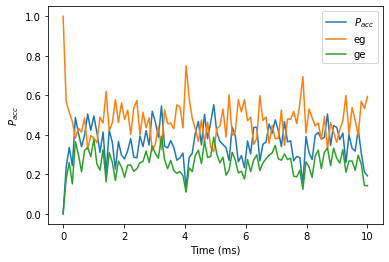

time used for solving mesolve: 0:00:06.108620  time used for ploting: 0:00:00.345281
k =  3.25
max= 0.5061604489249745


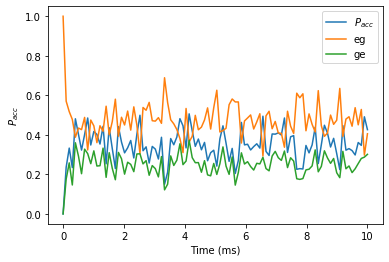

time used for solving mesolve: 0:00:06.205321  time used for ploting: 0:00:00.364675
k =  3.3749999999999996
max= 0.5775335567051813


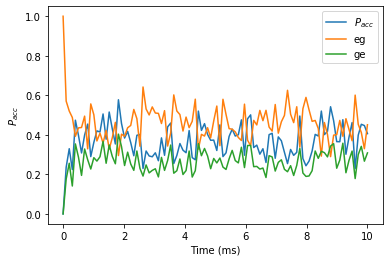

time used for solving mesolve: 0:00:06.169093  time used for ploting: 0:00:00.348665
k =  3.5
max= 0.6554617298071405


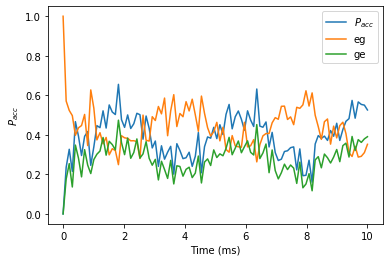

time used for solving mesolve: 0:00:06.115708  time used for ploting: 0:00:00.352241
k =  3.625
max= 0.670554555528053


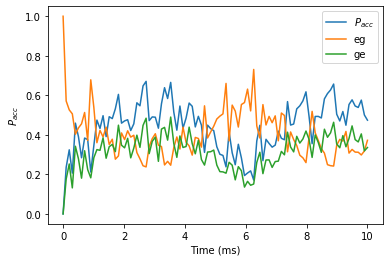

time used for solving mesolve: 0:00:06.045158  time used for ploting: 0:00:00.352086
k =  3.7500000000000004
max= 0.5587988948315454


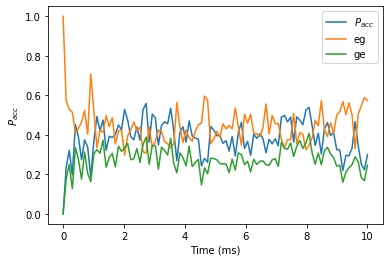

time used for solving mesolve: 0:00:06.050785  time used for ploting: 0:00:00.346537
k =  3.8749999999999996
max= 0.5696428792583874


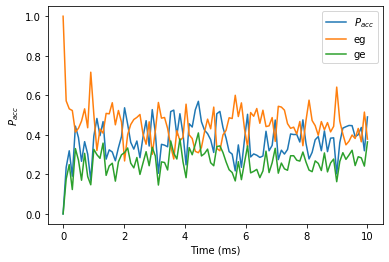

time used for solving mesolve: 0:00:05.966719  time used for ploting: 0:00:00.352838
k =  4.0
max= 0.47672539565159006


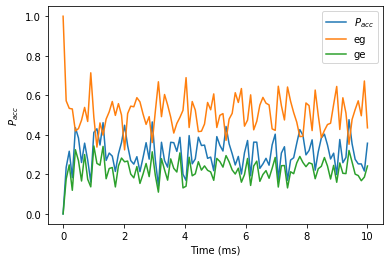

time used for solving mesolve: 0:00:05.897421  time used for ploting: 0:00:00.350450


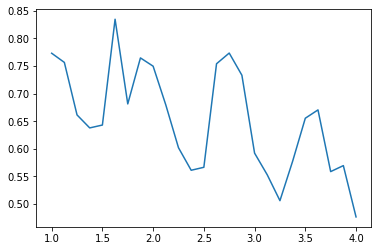

In [18]:
jj = 1.3
J = [jj]*4
Delta = 4.56
kappa = 1.4
NU = np.sqrt(4*jj**2+0.5*Delta**2)
k = np.linspace(1, 4, 25)
nus = NU/k
trans5_1=[]
for nu in nus:
    print('k = ',NU/nu)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans5_1.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(k,trans5_1)

### Step 3. When $\Delta >> J$, what will happen if $\nu = J$

k =  1.0


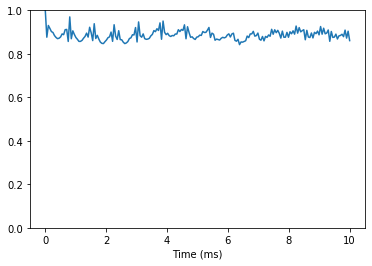

max= 0.07427959029118376


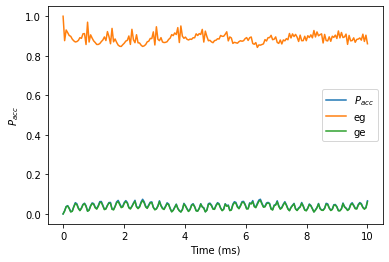

time used for solving mesolve: 0:00:08.440152  time used for ploting: 0:00:00.780081
k =  2.0


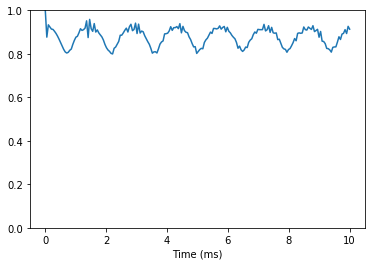

max= 0.07128976499398536


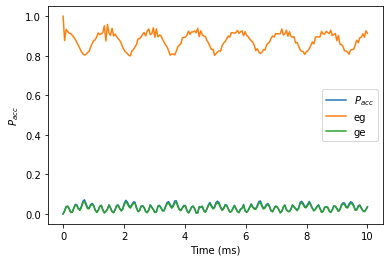

time used for solving mesolve: 0:00:08.498587  time used for ploting: 0:00:00.884694
k =  3.0


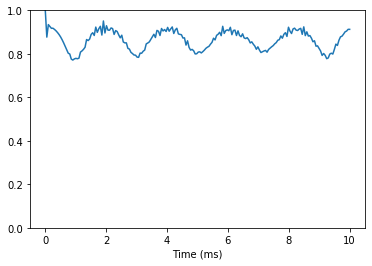

max= 0.07735792196222374


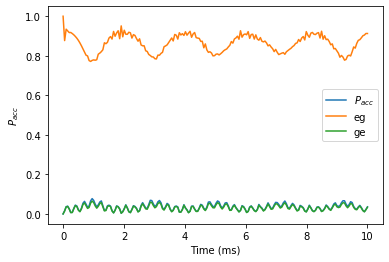

time used for solving mesolve: 0:00:08.689631  time used for ploting: 0:00:00.818744
k =  4.0


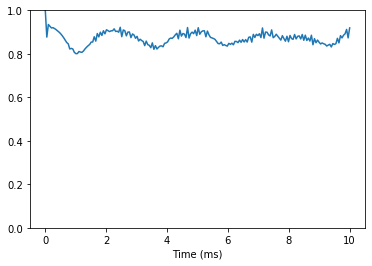

max= 0.06735041418026633


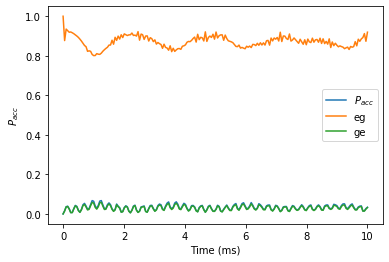

time used for solving mesolve: 0:00:08.626960  time used for ploting: 0:00:00.827953
k =  5.0


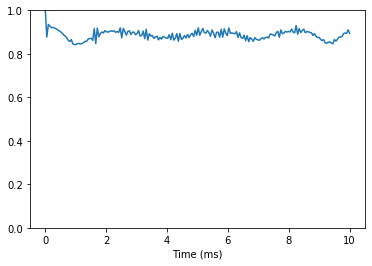

max= 0.05924884211176365


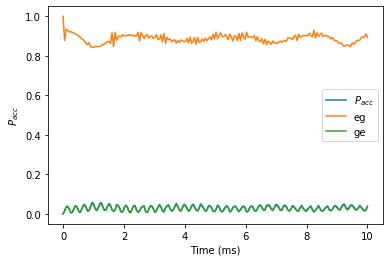

time used for solving mesolve: 0:00:08.899203  time used for ploting: 0:00:00.842702
k =  6.0


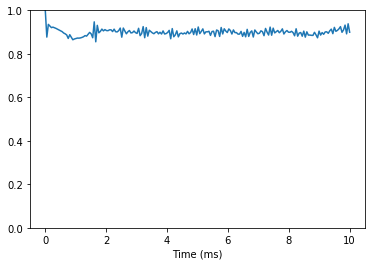

max= 0.05227804203800307


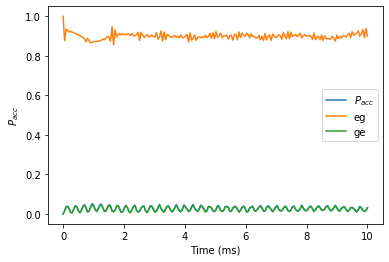

time used for solving mesolve: 0:00:08.838697  time used for ploting: 0:00:00.842460
k =  7.0


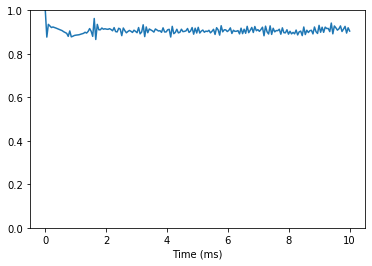

max= 0.047827319077998504


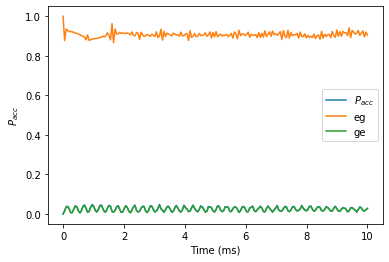

time used for solving mesolve: 0:00:08.840022  time used for ploting: 0:00:00.917058
k =  8.0


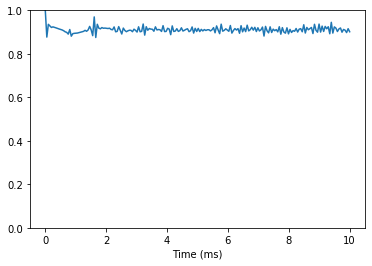

max= 0.04769355920200646


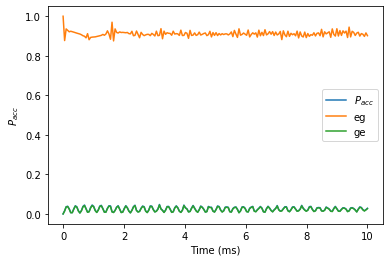

time used for solving mesolve: 0:00:09.104020  time used for ploting: 0:00:00.861073
k =  9.0


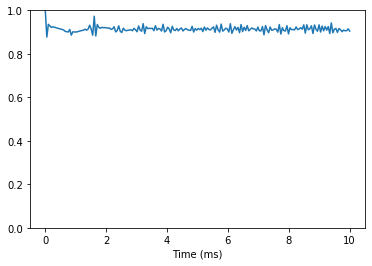

max= 0.04804152531175257


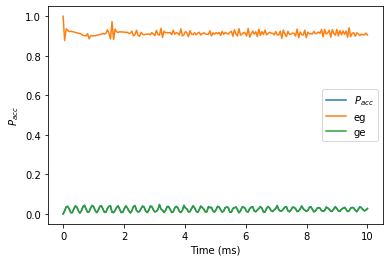

time used for solving mesolve: 0:00:09.869946  time used for ploting: 0:00:01.041338
k =  10.0


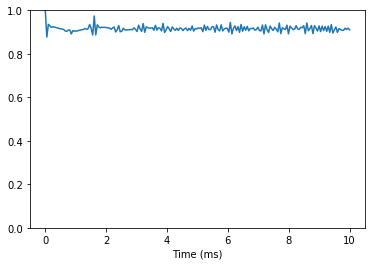

max= 0.04861059895613837


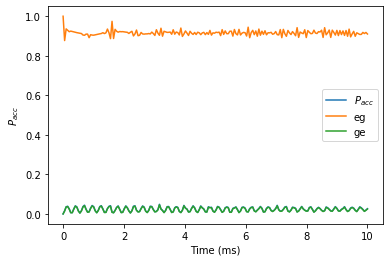

time used for solving mesolve: 0:00:10.607899  time used for ploting: 0:00:00.901357
k =  11.0


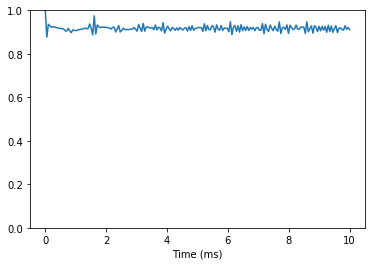

max= 0.049198611838624735


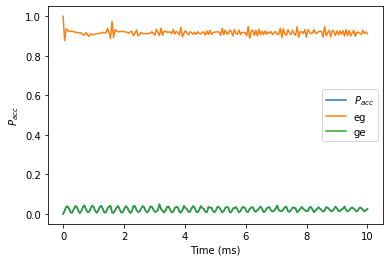

time used for solving mesolve: 0:00:09.748484  time used for ploting: 0:00:00.846820


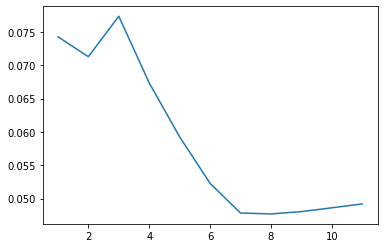

In [21]:
J = 1.3
Delta = 10
kappa = 1.4
NU = J
k = np.linspace(1, 11, 11)
nus = NU/k
trans = []
for nu in nus:
    print('k = ',NU/nu)
    exp3 = VAET(Nmax=10, J = J, Delta = Delta, kappa = kappa, nu = -nu)
    trans.append(exp3.time_scan(0, 10, 200, nth = 0.5))
plt.plot(k,trans)

#### Conclusion: Donor cannot transfer energy to the acceptors

## Add adjustment on the phase and coupling (Only $\Delta >> J$)

### Case 1. $\Phi = [\phi, 0, 0,0]$

phi =  0.0
max= 0.8138524557651872


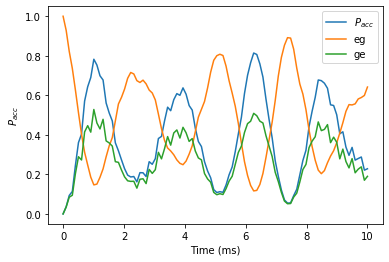

time used for solving mesolve: 0:00:33.759612  time used for ploting: 0:00:00.344036
phi =  0.20943951023931953
max= 0.80934150997197


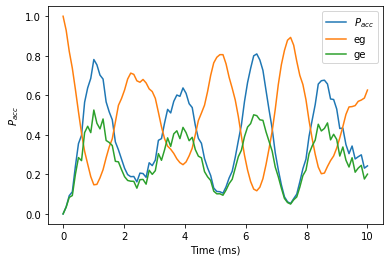

time used for solving mesolve: 0:00:34.209114  time used for ploting: 0:00:00.348496
phi =  0.41887902047863906
max= 0.792728907737082


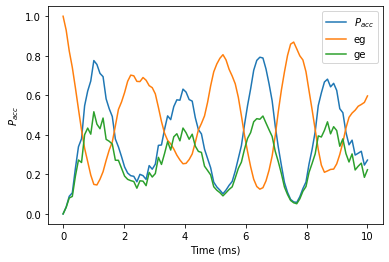

time used for solving mesolve: 0:00:33.889545  time used for ploting: 0:00:00.346893
phi =  0.6283185307179586
max= 0.7836642452094593


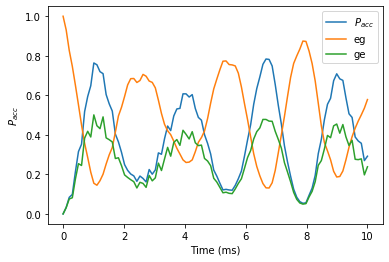

time used for solving mesolve: 0:00:29.624768  time used for ploting: 0:00:00.350664
phi =  0.8377580409572781
max= 0.7651733266516205


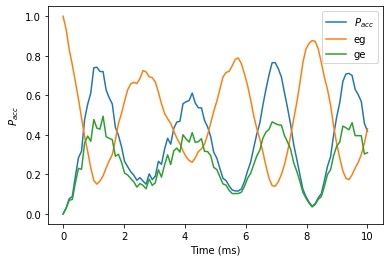

time used for solving mesolve: 0:00:33.095958  time used for ploting: 0:00:00.369579
phi =  1.0471975511965976
max= 0.7261321074183587


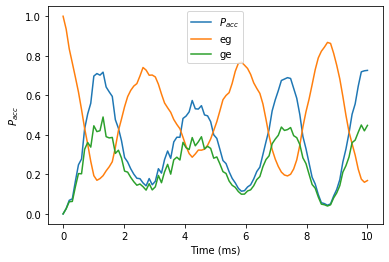

time used for solving mesolve: 0:00:31.911765  time used for ploting: 0:00:00.361390
phi =  1.2566370614359172
max= 0.6924292321095065


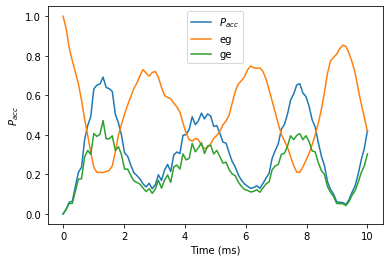

time used for solving mesolve: 0:00:31.367738  time used for ploting: 0:00:00.352001
phi =  1.4660765716752366
max= 0.6398618909541427


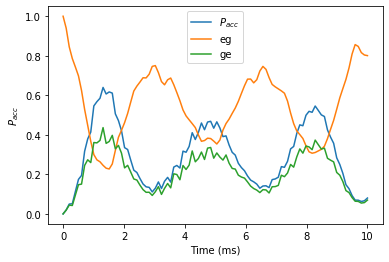

time used for solving mesolve: 0:00:30.262796  time used for ploting: 0:00:00.364641
phi =  1.6755160819145563
max= 0.5617344593178841


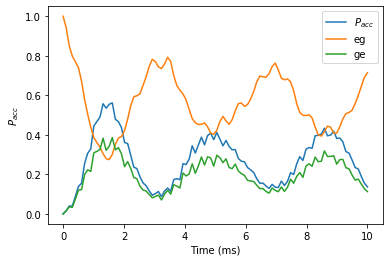

time used for solving mesolve: 0:00:33.539978  time used for ploting: 0:00:00.349176
phi =  1.8849555921538759
max= 0.4796897113487113


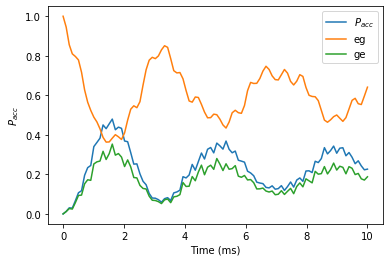

time used for solving mesolve: 0:00:35.202236  time used for ploting: 0:00:00.348029
phi =  2.0943951023931953
max= 0.3895931423975403


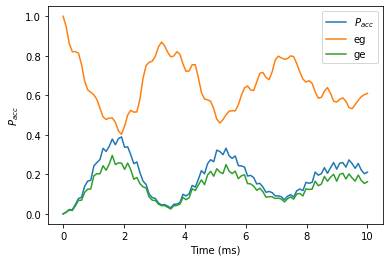

time used for solving mesolve: 0:00:31.210637  time used for ploting: 0:00:00.356905
phi =  2.3038346126325147
max= 0.3013525245941699


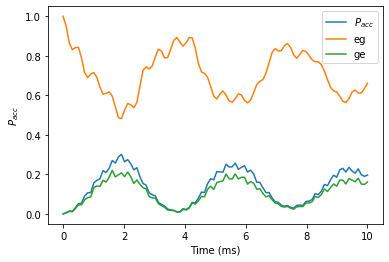

time used for solving mesolve: 0:00:30.782621  time used for ploting: 0:00:00.360684
phi =  2.5132741228718345
max= 0.1910987564115508


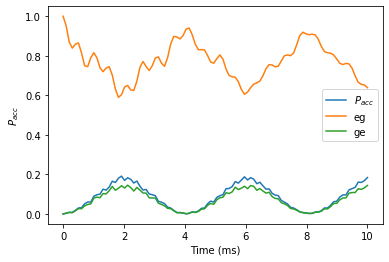

time used for solving mesolve: 0:00:30.049093  time used for ploting: 0:00:00.365550
phi =  2.722713633111154
max= 0.0908994852986662


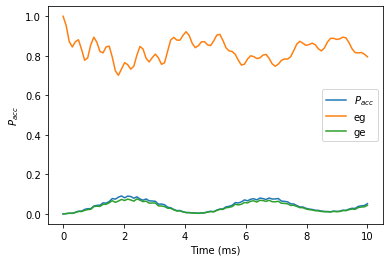

time used for solving mesolve: 0:00:32.041334  time used for ploting: 0:00:00.356598
phi =  2.9321531433504733
max= 0.023736033299917133


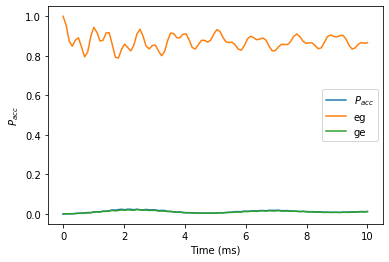

time used for solving mesolve: 0:00:33.584467  time used for ploting: 0:00:00.361558
phi =  3.141592653589793
max= 0.0


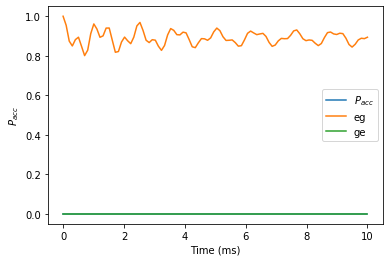

time used for solving mesolve: 0:00:32.957180  time used for ploting: 0:00:00.332473
phi =  3.3510321638291125
max= 0.02373603329992061


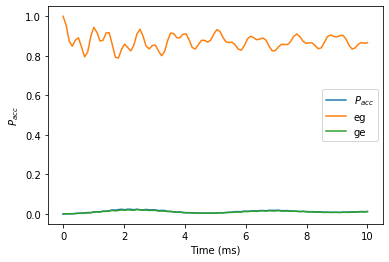

time used for solving mesolve: 0:00:34.212022  time used for ploting: 0:00:00.347023
phi =  3.560471674068432
max= 0.09089948529866125


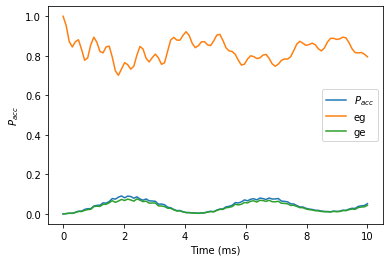

time used for solving mesolve: 0:00:31.918977  time used for ploting: 0:00:00.347738
phi =  3.7699111843077517
max= 0.1910987564116083


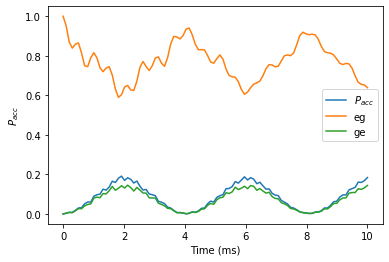

time used for solving mesolve: 0:00:30.114948  time used for ploting: 0:00:00.350456
phi =  3.979350694547071
max= 0.3013525245940174


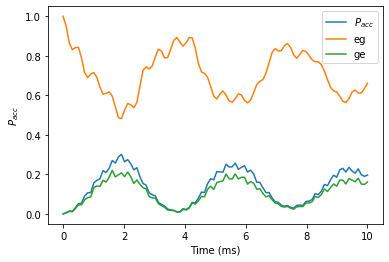

time used for solving mesolve: 0:00:30.887692  time used for ploting: 0:00:00.349468
phi =  4.1887902047863905
max= 0.38959314239757353


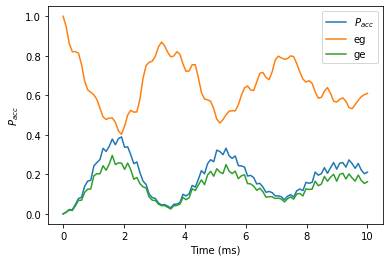

time used for solving mesolve: 0:00:31.331480  time used for ploting: 0:00:00.354527
phi =  4.39822971502571
max= 0.47968971134866534


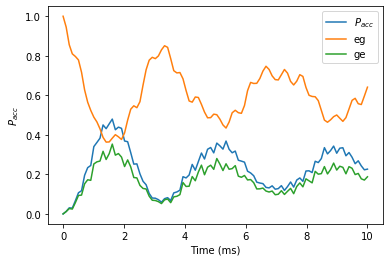

time used for solving mesolve: 0:00:34.919426  time used for ploting: 0:00:00.351514
phi =  4.607669225265029
max= 0.5617344593180312


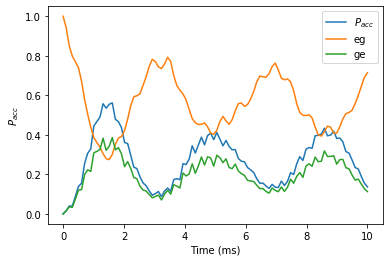

time used for solving mesolve: 0:00:34.193904  time used for ploting: 0:00:00.357794
phi =  4.817108735504349
max= 0.639861890954156


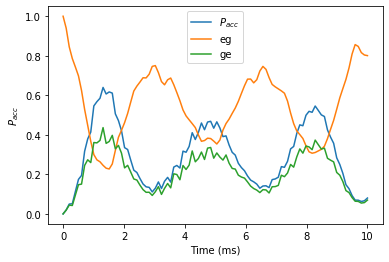

time used for solving mesolve: 0:00:30.605019  time used for ploting: 0:00:00.354742
phi =  5.026548245743669
max= 0.6924292321095002


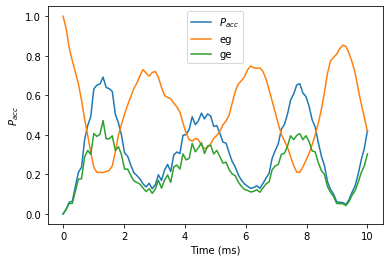

time used for solving mesolve: 0:00:32.293744  time used for ploting: 0:00:00.358235
phi =  5.235987755982988
max= 0.7261321094249592


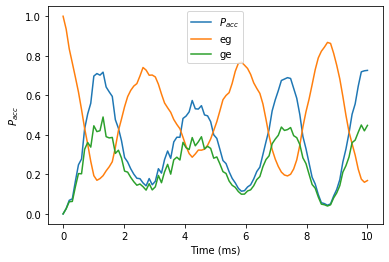

time used for solving mesolve: 0:00:31.489558  time used for ploting: 0:00:00.360187
phi =  5.445427266222308
max= 0.765173326651576


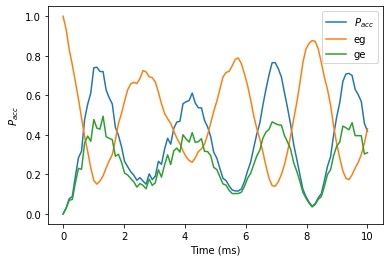

time used for solving mesolve: 0:00:33.661663  time used for ploting: 0:00:00.349627
phi =  5.654866776461628
max= 0.7836642445723635


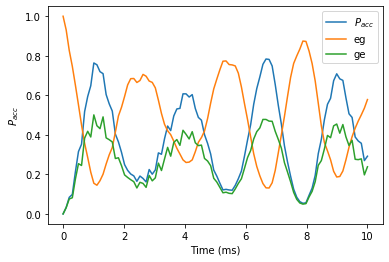

time used for solving mesolve: 0:00:30.339611  time used for ploting: 0:00:00.354233
phi =  5.864306286700947
max= 0.7927289077377455


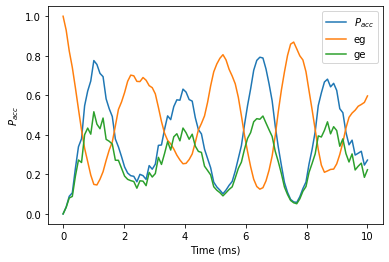

time used for solving mesolve: 0:00:34.145249  time used for ploting: 0:00:00.350905
phi =  6.073745796940266
max= 0.8093415086942589


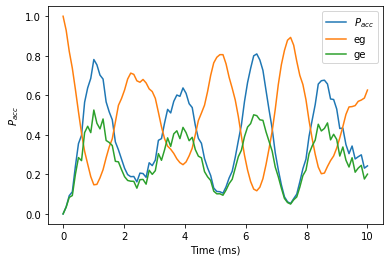

time used for solving mesolve: 0:00:34.382412  time used for ploting: 0:00:00.348052
phi =  6.283185307179586
max= 0.8138524557651872


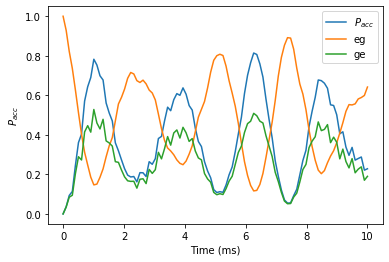

time used for solving mesolve: 0:00:34.152024  time used for ploting: 0:00:00.349486


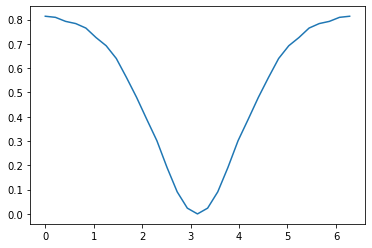

In [35]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_phase1 = []
n = 31
phis = np.linspace(0,2*np.pi,n)
for phi in phis:  
    print('phi = ', phi)
    Phi = [phi, 0, 0, 0]
    nu = np.sqrt(4*jj**2+0.7*Delta**2)
    exp3 = VAET(Nmax=10, J = J, phi = Phi, Delta = Delta, kappa = kappa, nu = -nu)
    result_phase1.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(phis, result_phase1)

### Case 2.1 $\Phi = [\phi, -\phi, 0,0]$

phi =  0.0
max= 0.8138524557651872


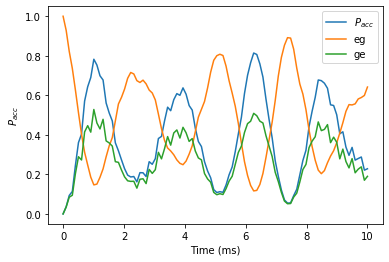

time used for solving mesolve: 0:00:34.716361  time used for ploting: 0:00:00.374122
phi =  0.20943951023931953
max= 0.7927289077391585


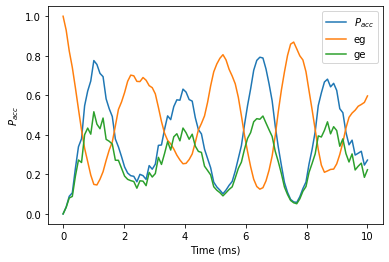

time used for solving mesolve: 0:00:34.254300  time used for ploting: 0:00:00.351693
phi =  0.41887902047863906
max= 0.7651733269995887


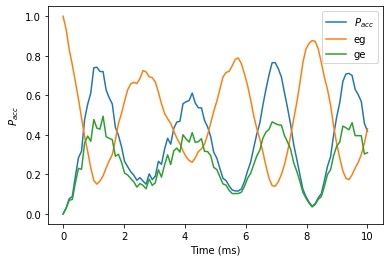

time used for solving mesolve: 0:00:33.765510  time used for ploting: 0:00:00.348316
phi =  0.6283185307179586
max= 0.6924292321095108


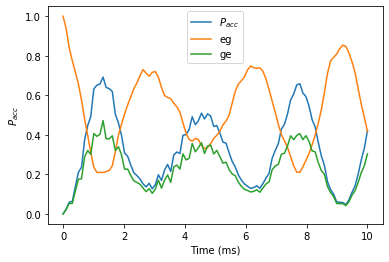

time used for solving mesolve: 0:00:32.346758  time used for ploting: 0:00:00.352195
phi =  0.8377580409572781
max= 0.5617344593179201


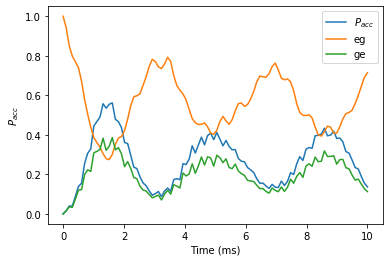

time used for solving mesolve: 0:00:34.013819  time used for ploting: 0:00:00.349294
phi =  1.0471975511965976
max= 0.3895931423975628


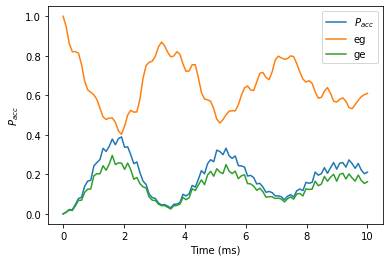

time used for solving mesolve: 0:00:30.613234  time used for ploting: 0:00:00.347070
phi =  1.2566370614359172
max= 0.19109875641069596


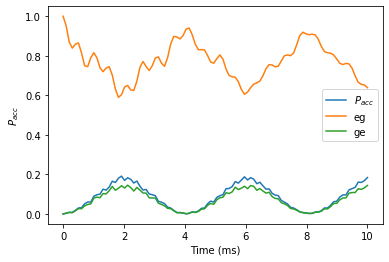

time used for solving mesolve: 0:00:30.299388  time used for ploting: 0:00:00.353787
phi =  1.4660765716752366
max= 0.02373603329991241


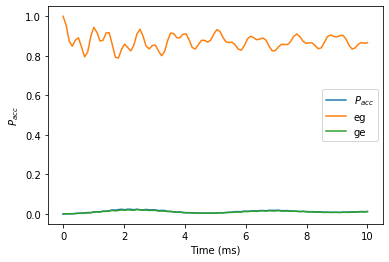

time used for solving mesolve: 0:00:34.721709  time used for ploting: 0:00:00.349845
phi =  1.6755160819145563
max= 0.02373603329992242


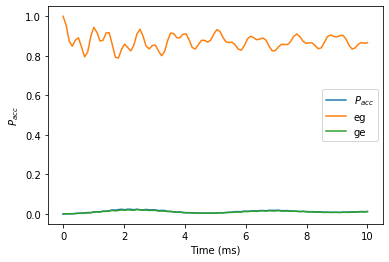

time used for solving mesolve: 0:00:33.800507  time used for ploting: 0:00:00.354631
phi =  1.8849555921538759
max= 0.19109875641062754


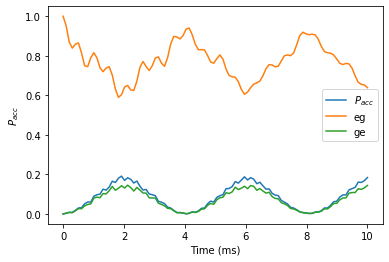

time used for solving mesolve: 0:00:31.299650  time used for ploting: 0:00:00.359334
phi =  2.0943951023931953
max= 0.38959314239749443


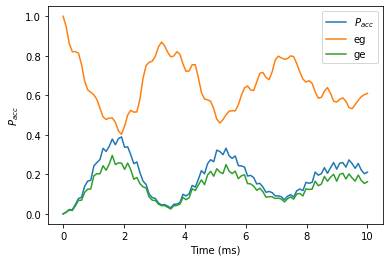

time used for solving mesolve: 0:00:33.289433  time used for ploting: 0:00:00.353656
phi =  2.3038346126325147
max= 0.5617344593180335


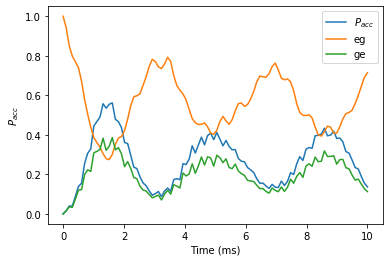

time used for solving mesolve: 0:00:35.893078  time used for ploting: 0:00:00.399052
phi =  2.5132741228718345
max= 0.6924292321094994


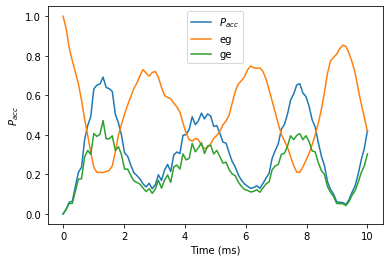

time used for solving mesolve: 0:00:35.076192  time used for ploting: 0:00:00.394602
phi =  2.722713633111154
max= 0.7651733269991916


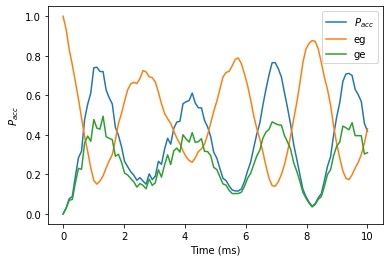

time used for solving mesolve: 0:00:35.312541  time used for ploting: 0:00:00.360748
phi =  2.9321531433504733
max= 0.7927289077407003


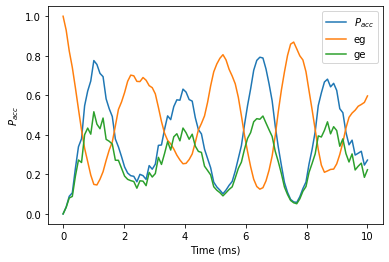

time used for solving mesolve: 0:00:35.790190  time used for ploting: 0:00:00.361729
phi =  3.141592653589793
max= 0.8138524557651872


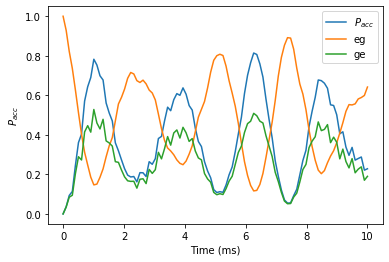

time used for solving mesolve: 0:00:35.695054  time used for ploting: 0:00:00.366216
phi =  3.3510321638291125
max= 0.792728907739945


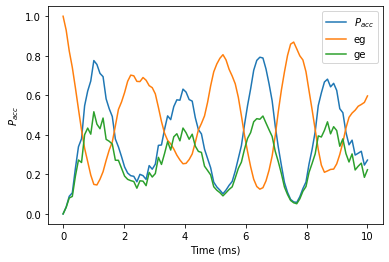

time used for solving mesolve: 0:00:35.352424  time used for ploting: 0:00:00.368230
phi =  3.560471674068432
max= 0.765173326999203


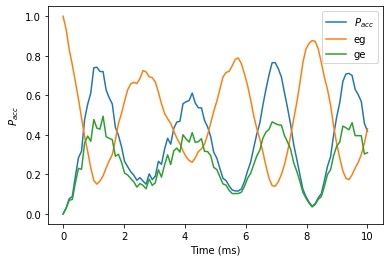

time used for solving mesolve: 0:00:35.329346  time used for ploting: 0:00:00.363078
phi =  3.7699111843077517
max= 0.6924292321095


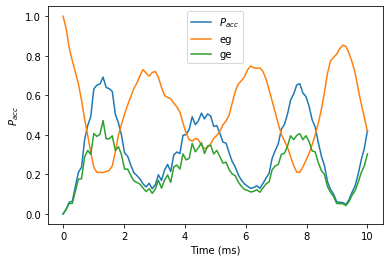

time used for solving mesolve: 0:00:33.260163  time used for ploting: 0:00:00.353727
phi =  3.979350694547071
max= 0.56173445931779


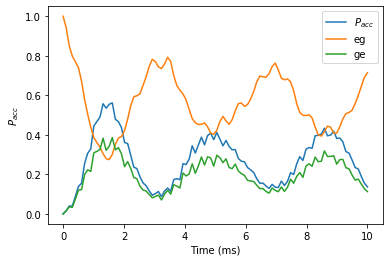

time used for solving mesolve: 0:00:35.040158  time used for ploting: 0:00:00.354109
phi =  4.1887902047863905
max= 0.38959314239746506


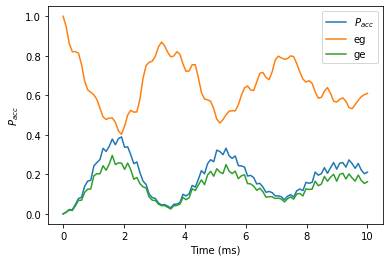

time used for solving mesolve: 0:00:32.383420  time used for ploting: 0:00:00.356430
phi =  4.39822971502571
max= 0.19109875641063603


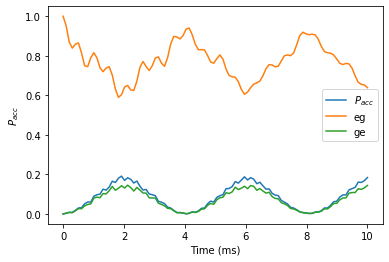

time used for solving mesolve: 0:00:31.675154  time used for ploting: 0:00:00.356087
phi =  4.607669225265029
max= 0.023736033299915787


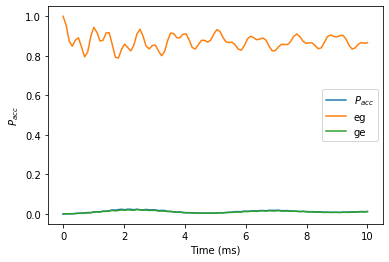

time used for solving mesolve: 0:00:35.112964  time used for ploting: 0:00:00.360829
phi =  4.817108735504349
max= 0.023736033299915252


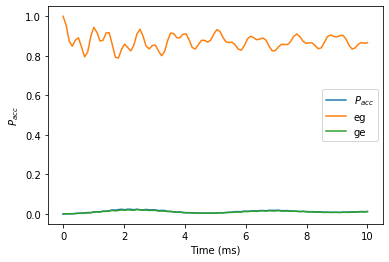

time used for solving mesolve: 0:00:35.135065  time used for ploting: 0:00:00.356578
phi =  5.026548245743669
max= 0.1910987564106936


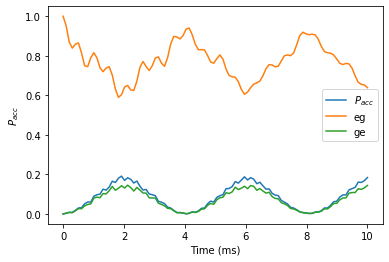

time used for solving mesolve: 0:00:31.787720  time used for ploting: 0:00:00.365007
phi =  5.235987755982988
max= 0.38959314239750975


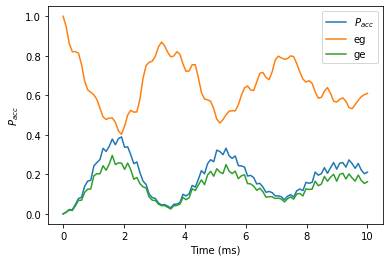

time used for solving mesolve: 0:00:32.350225  time used for ploting: 0:00:00.353585
phi =  5.445427266222308
max= 0.5617344593178455


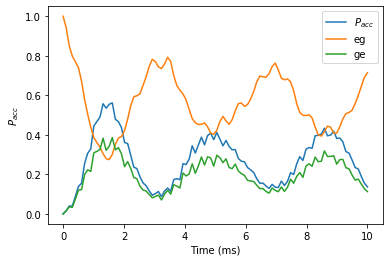

time used for solving mesolve: 0:00:35.058711  time used for ploting: 0:00:00.346378
phi =  5.654866776461628
max= 0.6924292321094994


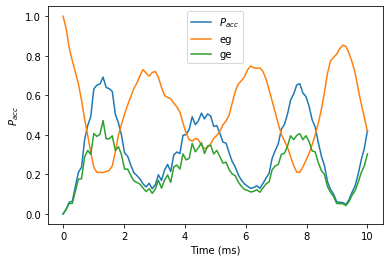

time used for solving mesolve: 0:00:32.824287  time used for ploting: 0:00:00.356015
phi =  5.864306286700947
max= 0.7651733269989386


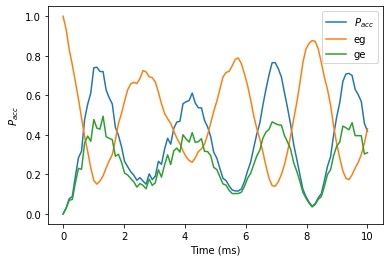

time used for solving mesolve: 0:00:35.125504  time used for ploting: 0:00:00.356480
phi =  6.073745796940266
max= 0.7927289077394766


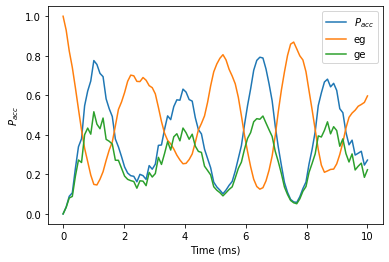

time used for solving mesolve: 0:00:35.466862  time used for ploting: 0:00:00.363009
phi =  6.283185307179586
max= 0.8138524557651872


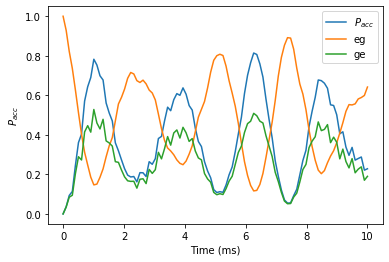

time used for solving mesolve: 0:00:35.764331  time used for ploting: 0:00:00.364424


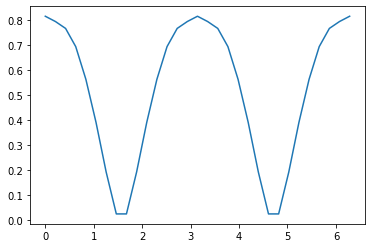

In [36]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_phase21 = []
n = 31
phis = np.linspace(0,2*np.pi,n)
for phi in phis:  
    print('phi = ', phi)
    Phi = [phi, -phi, 0,0]
    nu = np.sqrt(4*jj**2+0.7*Delta**2)
    exp3 = VAET(Nmax=10, J = J, phi = Phi, Delta = Delta, kappa = kappa, nu = -nu)
    result_phase21.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(phis, result_phase21)

### Case 2.2 $\Phi = [\phi, \phi, 0,0]$

phi =  0.0
max= 0.8138524557651872


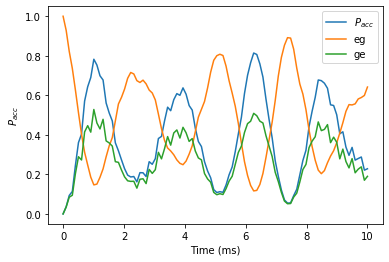

time used for solving mesolve: 0:00:36.034329  time used for ploting: 0:00:00.359273
phi =  0.20943951023931953
max= 0.8138524560542415


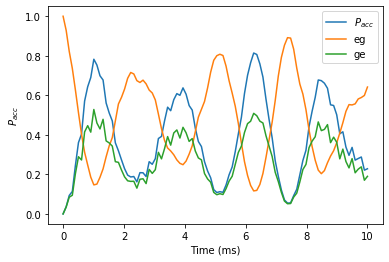

time used for solving mesolve: 0:00:35.584496  time used for ploting: 0:00:00.353162
phi =  0.41887902047863906
max= 0.8138524566790025


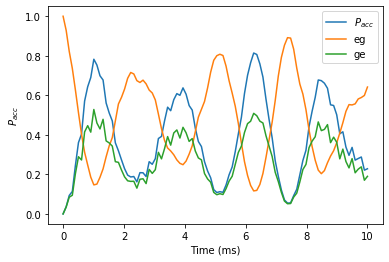

time used for solving mesolve: 0:00:35.783904  time used for ploting: 0:00:00.364813
phi =  0.6283185307179586
max= 0.8138524545408904


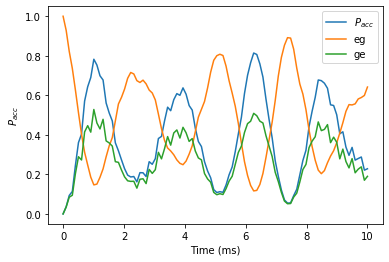

time used for solving mesolve: 0:00:35.871392  time used for ploting: 0:00:00.353592
phi =  0.8377580409572781
max= 0.813852457200052


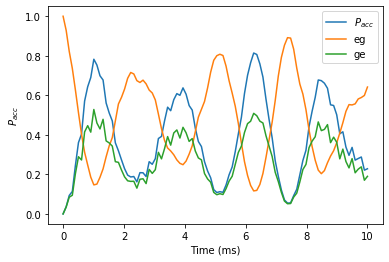

time used for solving mesolve: 0:00:36.852849  time used for ploting: 0:00:00.362542
phi =  1.0471975511965976
max= 0.8138524571792596


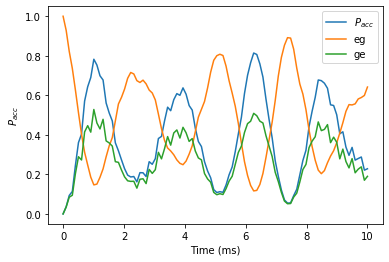

time used for solving mesolve: 0:00:35.830769  time used for ploting: 0:00:00.361750
phi =  1.2566370614359172
max= 0.813852455960549


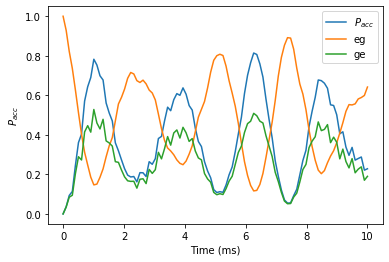

time used for solving mesolve: 0:00:35.882969  time used for ploting: 0:00:00.367192
phi =  1.4660765716752366
max= 0.8138524563406997


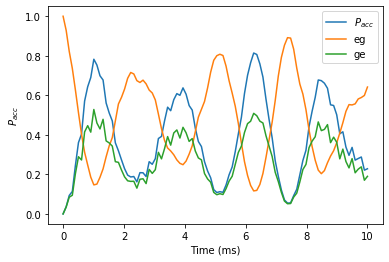

time used for solving mesolve: 0:00:41.200763  time used for ploting: 0:00:00.384056
phi =  1.6755160819145563
max= 0.8138524563490198


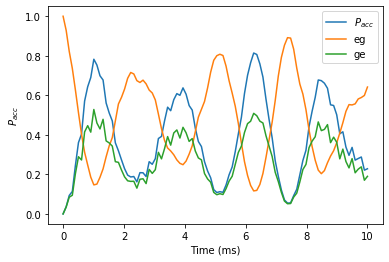

time used for solving mesolve: 0:00:40.098049  time used for ploting: 0:00:00.378306
phi =  1.8849555921538759
max= 0.8138524551054926


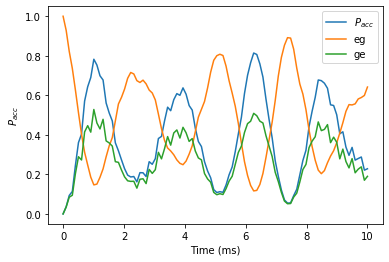

time used for solving mesolve: 0:00:36.853749  time used for ploting: 0:00:00.370679
phi =  2.0943951023931953
max= 0.813852455839434


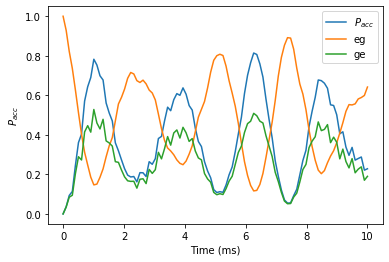

time used for solving mesolve: 0:00:36.451442  time used for ploting: 0:00:00.364833
phi =  2.3038346126325147
max= 0.8138524567336703


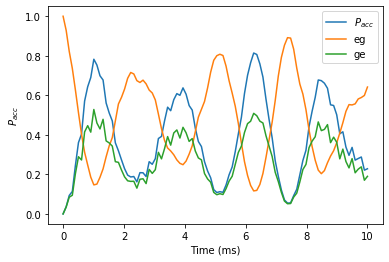

time used for solving mesolve: 0:00:35.952071  time used for ploting: 0:00:00.358043
phi =  2.5132741228718345
max= 0.8138524553960693


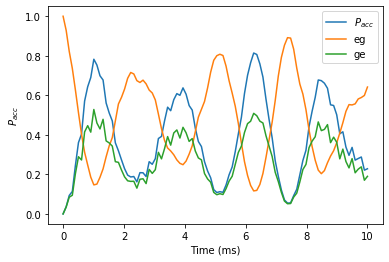

time used for solving mesolve: 0:00:35.977836  time used for ploting: 0:00:00.359630
phi =  2.722713633111154
max= 0.813852454941876


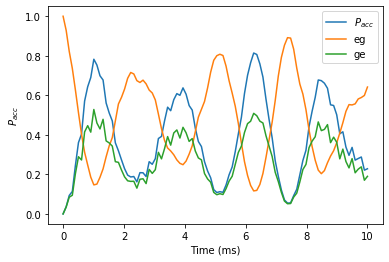

time used for solving mesolve: 0:00:36.240845  time used for ploting: 0:00:00.361023
phi =  2.9321531433504733
max= 0.8138524563932544


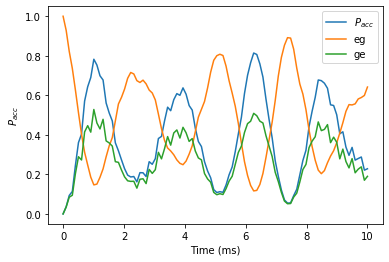

time used for solving mesolve: 0:00:35.546906  time used for ploting: 0:00:00.358859
phi =  3.141592653589793
max= 0.8138524557651872


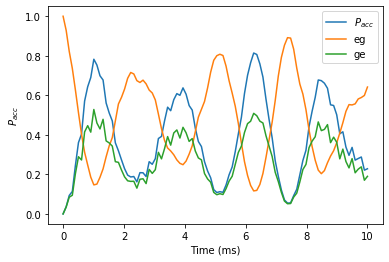

time used for solving mesolve: 0:00:36.446114  time used for ploting: 0:00:00.363126
phi =  3.3510321638291125
max= 0.8138524560654167


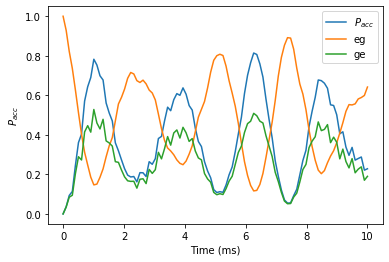

time used for solving mesolve: 0:00:37.042664  time used for ploting: 0:00:00.389872
phi =  3.560471674068432
max= 0.8138524560386612


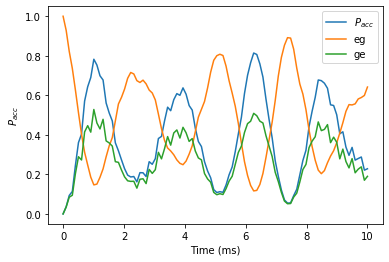

time used for solving mesolve: 0:00:37.826434  time used for ploting: 0:00:00.368842
phi =  3.7699111843077517
max= 0.8138524563881845


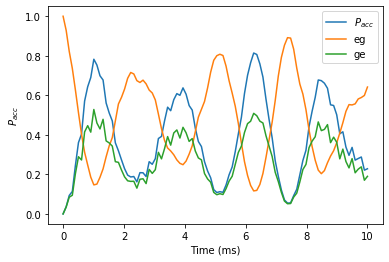

time used for solving mesolve: 0:00:36.407103  time used for ploting: 0:00:00.365692
phi =  3.979350694547071
max= 0.813852455135479


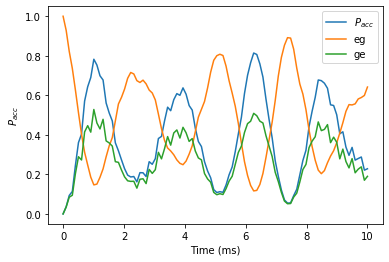

time used for solving mesolve: 0:00:37.020628  time used for ploting: 0:00:00.355902
phi =  4.1887902047863905
max= 0.8138524569895013


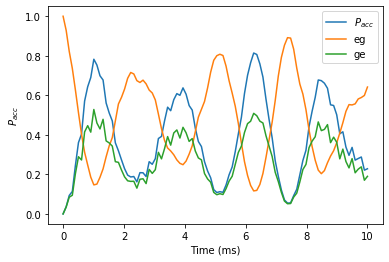

time used for solving mesolve: 0:00:36.817196  time used for ploting: 0:00:00.366952
phi =  4.39822971502571
max= 0.8138524557537392


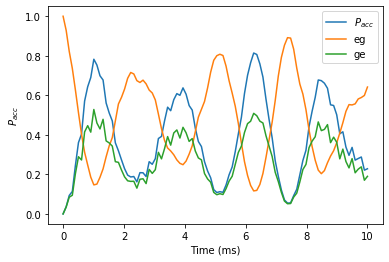

time used for solving mesolve: 0:00:36.169126  time used for ploting: 0:00:00.368141
phi =  4.607669225265029
max= 0.8138524561530325


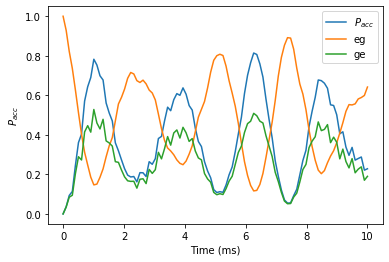

time used for solving mesolve: 0:00:36.090681  time used for ploting: 0:00:00.361473
phi =  4.817108735504349
max= 0.8138524563913225


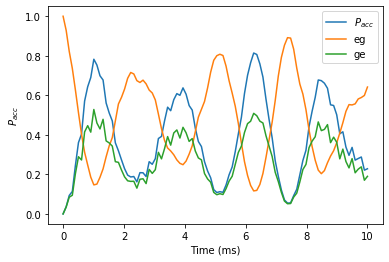

time used for solving mesolve: 0:00:36.594031  time used for ploting: 0:00:00.367071
phi =  5.026548245743669
max= 0.8138524560855693


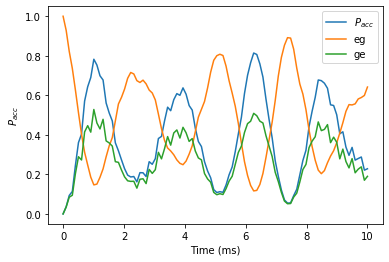

time used for solving mesolve: 0:00:35.931238  time used for ploting: 0:00:00.363511
phi =  5.235987755982988
max= 0.8138524561832567


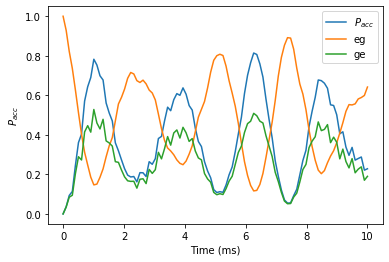

time used for solving mesolve: 0:00:37.256165  time used for ploting: 0:00:00.368800
phi =  5.445427266222308
max= 0.8138524556620401


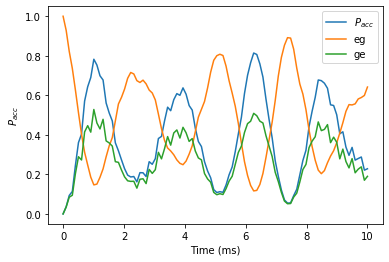

time used for solving mesolve: 0:00:38.198895  time used for ploting: 0:00:00.370826
phi =  5.654866776461628
max= 0.8138524553960693


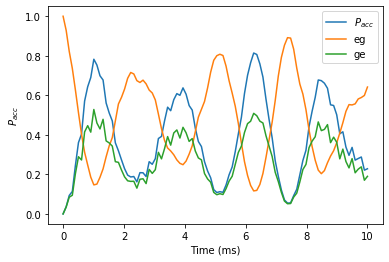

time used for solving mesolve: 0:00:36.757234  time used for ploting: 0:00:00.360397
phi =  5.864306286700947
max= 0.8138524566932169


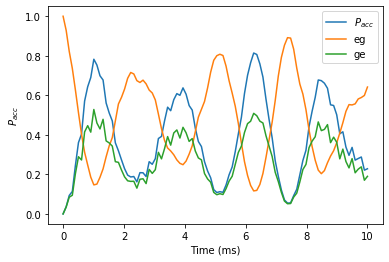

time used for solving mesolve: 0:00:36.495027  time used for ploting: 0:00:00.350141
phi =  6.073745796940266
max= 0.8138524561551138


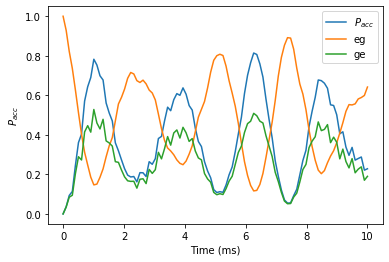

time used for solving mesolve: 0:00:34.797979  time used for ploting: 0:00:00.355205
phi =  6.283185307179586
max= 0.8138524557651872


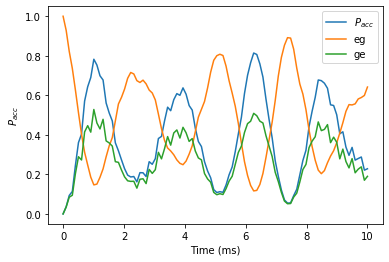

time used for solving mesolve: 0:00:38.516576  time used for ploting: 0:00:00.420194


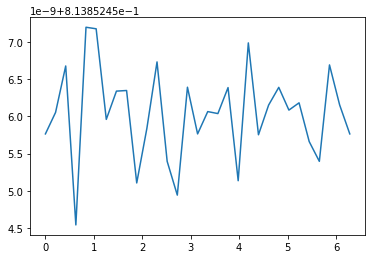

In [37]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_phase22 = []
n = 31
phis = np.linspace(0,2*np.pi,n)
for phi in phis:  
    print('phi = ', phi)
    Phi = [phi, phi, 0,0]
    nu = np.sqrt(4*jj**2+0.7*Delta**2)
    exp3 = VAET(Nmax=10, J = J, phi = Phi, Delta = Delta, kappa = kappa, nu = -nu)
    result_phase22.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(phis, result_phase22)

### Case 3. $\Phi = [\phi, -\phi, \phi, -\phi]$

phi =  0.0
max= 0.8138524557651872


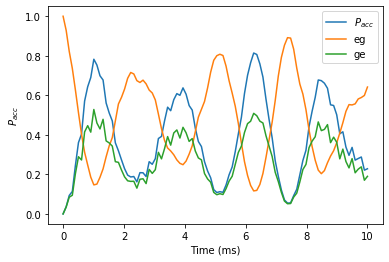

time used for solving mesolve: 0:00:41.657928  time used for ploting: 0:00:00.429841
phi =  0.20943951023931953
max= 0.813852456407123


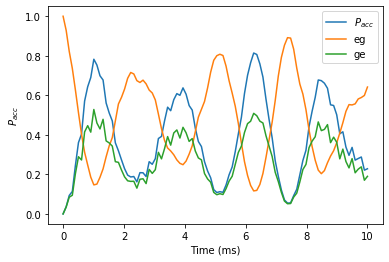

time used for solving mesolve: 0:00:46.011133  time used for ploting: 0:00:00.461200
phi =  0.41887902047863906
max= 0.8138524558711838


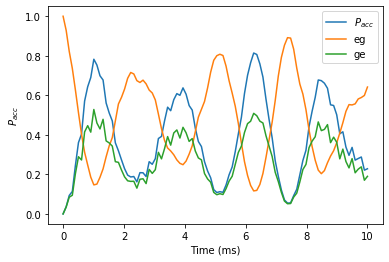

time used for solving mesolve: 0:00:43.217250  time used for ploting: 0:00:00.384520
phi =  0.6283185307179586
max= 0.8138524572322052


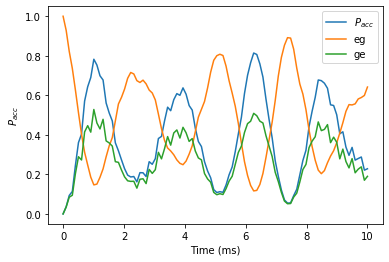

time used for solving mesolve: 0:00:41.457711  time used for ploting: 0:00:00.365191
phi =  0.8377580409572781
max= 0.8138524545589219


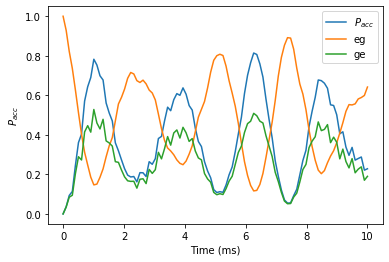

time used for solving mesolve: 0:00:35.942795  time used for ploting: 0:00:00.347595
phi =  1.0471975511965976
max= 0.8138524558567783


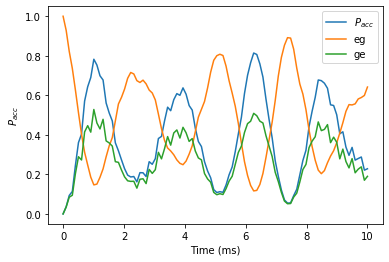

time used for solving mesolve: 0:00:35.183766  time used for ploting: 0:00:00.357629
phi =  1.2566370614359172
max= 0.813852456281151


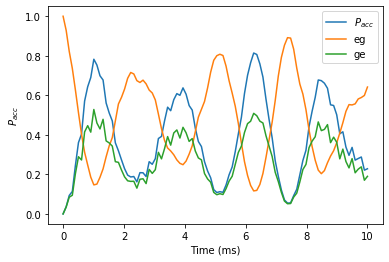

time used for solving mesolve: 0:00:34.894496  time used for ploting: 0:00:00.354429
phi =  1.4660765716752366
max= 0.8138524568134378


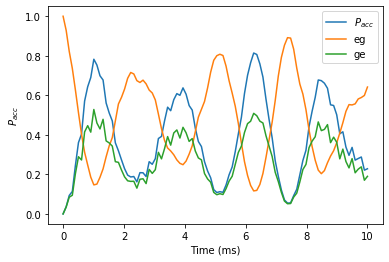

time used for solving mesolve: 0:00:34.577668  time used for ploting: 0:00:00.376799
phi =  1.6755160819145563
max= 0.8138524571732878


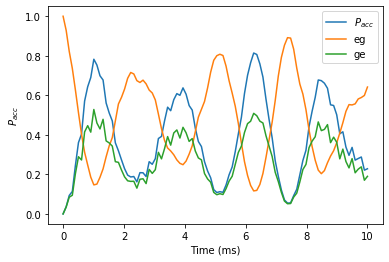

time used for solving mesolve: 0:00:35.224776  time used for ploting: 0:00:00.357517
phi =  1.8849555921538759
max= 0.8138524563660733


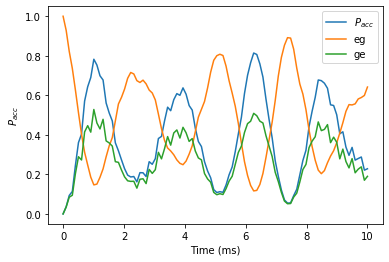

time used for solving mesolve: 0:00:34.680365  time used for ploting: 0:00:00.359999
phi =  2.0943951023931953
max= 0.8138524558936088


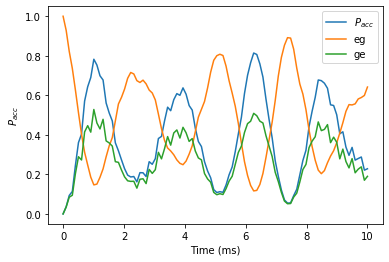

time used for solving mesolve: 0:00:34.440102  time used for ploting: 0:00:00.360130
phi =  2.3038346126325147
max= 0.813852456488499


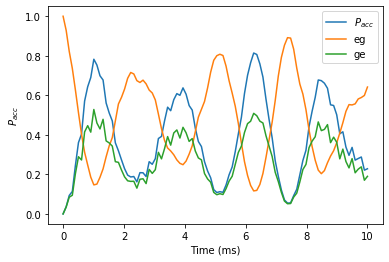

time used for solving mesolve: 0:00:34.898999  time used for ploting: 0:00:00.359549
phi =  2.5132741228718345
max= 0.8138524560408434


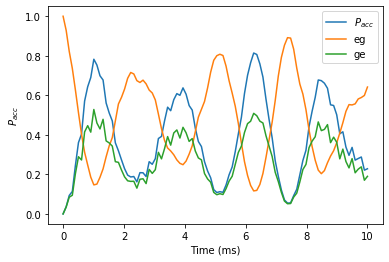

time used for solving mesolve: 0:00:35.004056  time used for ploting: 0:00:00.347277
phi =  2.722713633111154
max= 0.8138524545205832


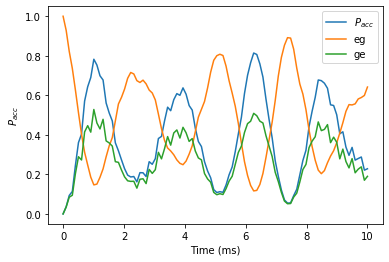

time used for solving mesolve: 0:00:34.567145  time used for ploting: 0:00:00.356397
phi =  2.9321531433504733
max= 0.8138524562415609


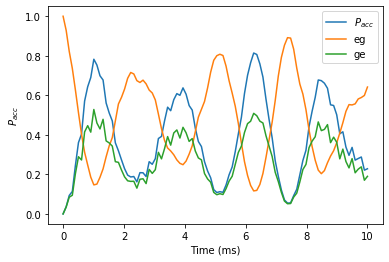

time used for solving mesolve: 0:00:34.952125  time used for ploting: 0:00:00.359464
phi =  3.141592653589793
max= 0.8138524557651872


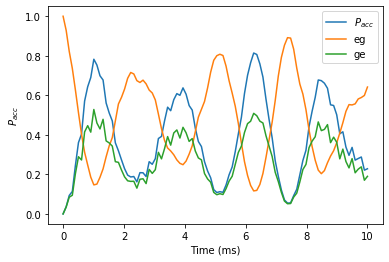

time used for solving mesolve: 0:00:34.954085  time used for ploting: 0:00:00.352758
phi =  3.3510321638291125
max= 0.813852456493178


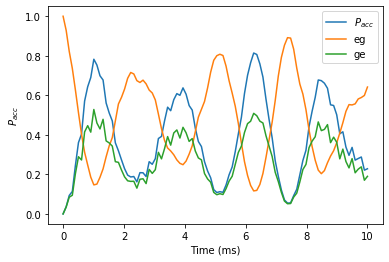

time used for solving mesolve: 0:00:34.584546  time used for ploting: 0:00:00.358644
phi =  3.560471674068432
max= 0.81385245544303


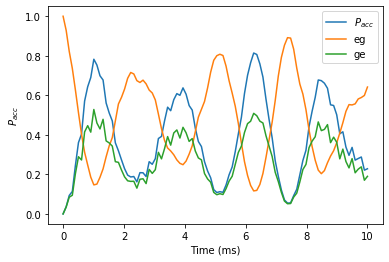

time used for solving mesolve: 0:00:34.592429  time used for ploting: 0:00:00.353192
phi =  3.7699111843077517
max= 0.8138524553365204


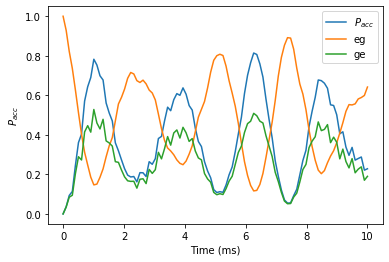

time used for solving mesolve: 0:00:34.747449  time used for ploting: 0:00:00.359160
phi =  3.979350694547071
max= 0.8138524554719281


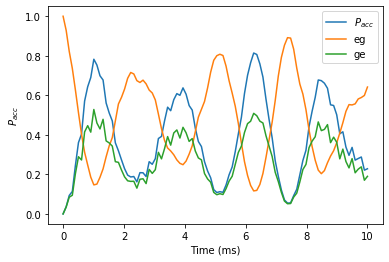

time used for solving mesolve: 0:00:34.773593  time used for ploting: 0:00:00.356339
phi =  4.1887902047863905
max= 0.8138524567140629


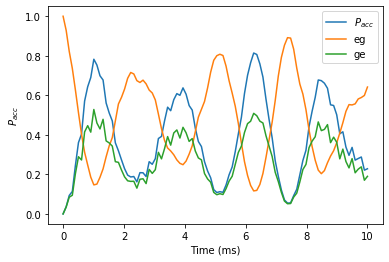

time used for solving mesolve: 0:00:34.602036  time used for ploting: 0:00:00.359989
phi =  4.39822971502571
max= 0.8138524553257299


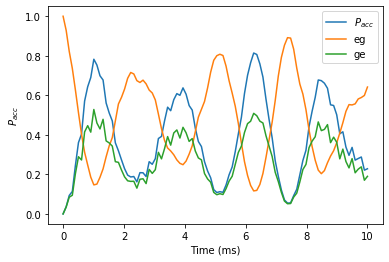

time used for solving mesolve: 0:00:34.982410  time used for ploting: 0:00:00.350574
phi =  4.607669225265029
max= 0.8138524555832718


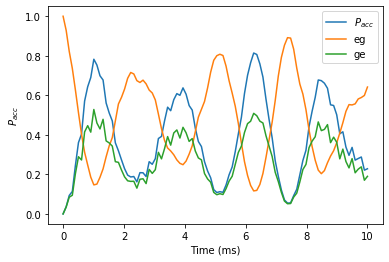

time used for solving mesolve: 0:00:34.526304  time used for ploting: 0:00:00.355541
phi =  4.817108735504349
max= 0.8138524558256534


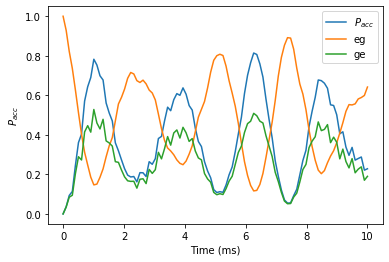

time used for solving mesolve: 0:00:34.570739  time used for ploting: 0:00:00.364320
phi =  5.026548245743669
max= 0.8138524560801587


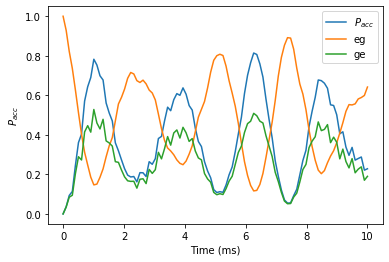

time used for solving mesolve: 0:00:35.059309  time used for ploting: 0:00:00.359515
phi =  5.235987755982988
max= 0.8138524571239193


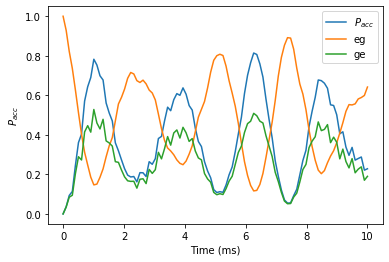

time used for solving mesolve: 0:00:35.156656  time used for ploting: 0:00:00.356266
phi =  5.445427266222308
max= 0.8138524554704633


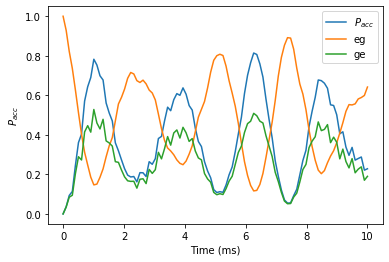

time used for solving mesolve: 0:00:34.666625  time used for ploting: 0:00:00.356138
phi =  5.654866776461628
max= 0.8138524560408434


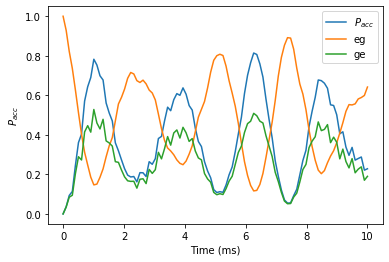

time used for solving mesolve: 0:00:34.838252  time used for ploting: 0:00:00.378131
phi =  5.864306286700947
max= 0.8138524560267841


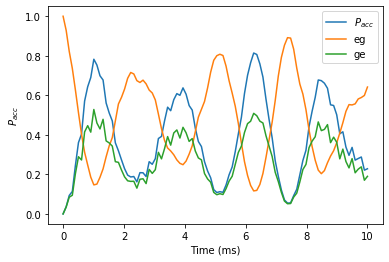

time used for solving mesolve: 0:00:35.031536  time used for ploting: 0:00:00.349936
phi =  6.073745796940266
max= 0.8138524564500498


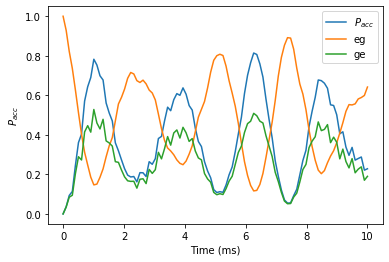

time used for solving mesolve: 0:00:34.798231  time used for ploting: 0:00:00.350805
phi =  6.283185307179586
max= 0.8138524557651872


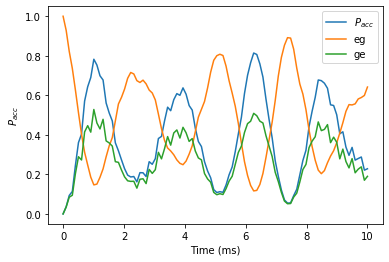

time used for solving mesolve: 0:00:34.923197  time used for ploting: 0:00:00.355634


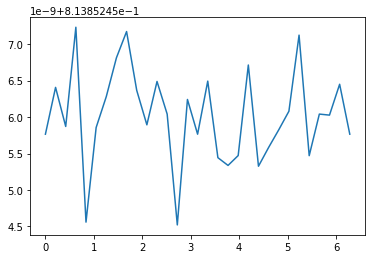

In [38]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_phase3 = []
n = 31
phis = np.linspace(0,2*np.pi,n)
for phi in phis:  
    print('phi = ', phi)
    Phi = [phi, -phi, phi, -phi]
    nu = np.sqrt(4*jj**2+0.7*Delta**2)
    exp3 = VAET(Nmax=10, J = J, phi = Phi, Delta = Delta, kappa = kappa, nu = -nu)
    result_phase3.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(phis, result_phase3)

### Case 3. $\Phi = [\phi, \phi, \phi, \phi]$

phi =  0.0
max= 0.8138524557651872


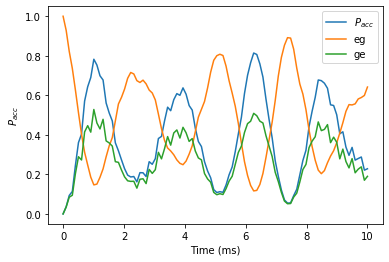

time used for solving mesolve: 0:00:35.147801  time used for ploting: 0:00:00.358498
phi =  0.20943951023931953
max= 0.8138524560641127


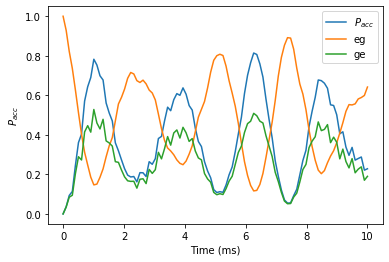

time used for solving mesolve: 0:00:35.032026  time used for ploting: 0:00:00.354094
phi =  0.41887902047863906
max= 0.8138524566702018


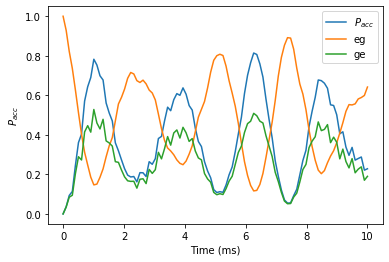

time used for solving mesolve: 0:00:34.883907  time used for ploting: 0:00:00.355071
phi =  0.6283185307179586
max= 0.8138524545571995


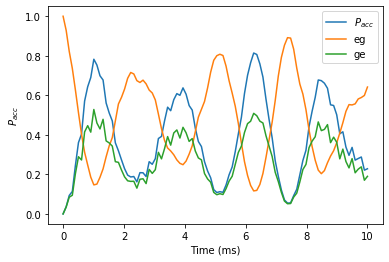

time used for solving mesolve: 0:00:34.828028  time used for ploting: 0:00:00.354713
phi =  0.8377580409572781
max= 0.8138524571656807


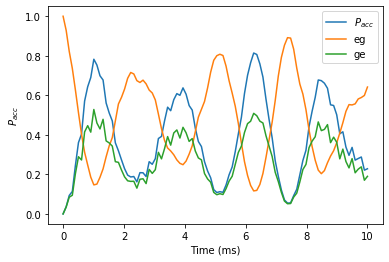

time used for solving mesolve: 0:00:35.325269  time used for ploting: 0:00:00.356467
phi =  1.0471975511965976
max= 0.8138524571825442


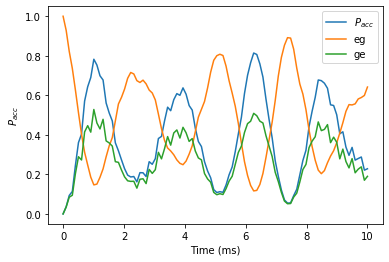

time used for solving mesolve: 0:00:34.649881  time used for ploting: 0:00:00.348705
phi =  1.2566370614359172
max= 0.8138524558476209


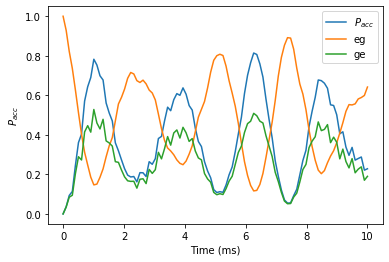

time used for solving mesolve: 0:00:35.033686  time used for ploting: 0:00:00.363597
phi =  1.4660765716752366
max= 0.8138524563446288


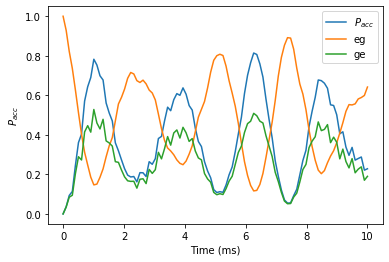

time used for solving mesolve: 0:00:35.451476  time used for ploting: 0:00:00.364397
phi =  1.6755160819145563
max= 0.8138524562766623


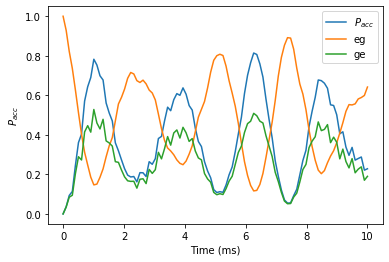

time used for solving mesolve: 0:00:35.727861  time used for ploting: 0:00:00.354683
phi =  1.8849555921538759
max= 0.8138524550188085


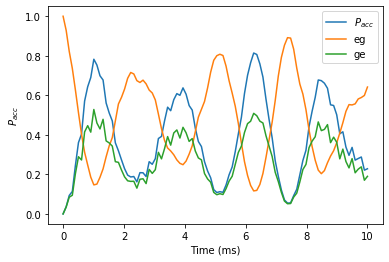

time used for solving mesolve: 0:00:35.090471  time used for ploting: 0:00:00.362825
phi =  2.0943951023931953
max= 0.8138524558683804


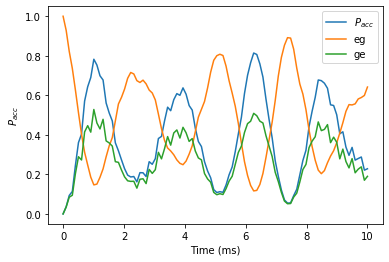

time used for solving mesolve: 0:00:34.706816  time used for ploting: 0:00:00.351936
phi =  2.3038346126325147
max= 0.8138524567380274


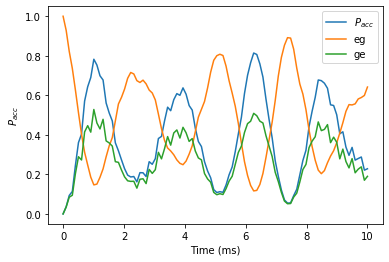

time used for solving mesolve: 0:00:35.202171  time used for ploting: 0:00:00.354911
phi =  2.5132741228718345
max= 0.8138524549143973


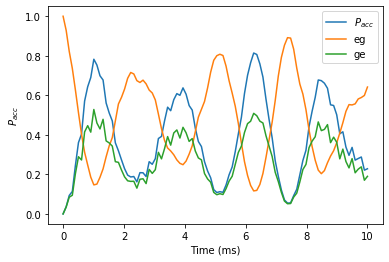

time used for solving mesolve: 0:00:34.322248  time used for ploting: 0:00:00.349653
phi =  2.722713633111154
max= 0.8138524555129496


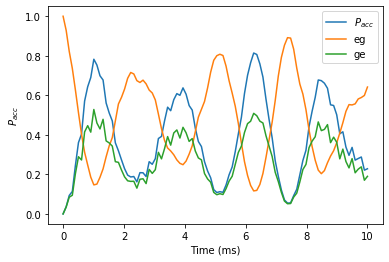

time used for solving mesolve: 0:00:35.173118  time used for ploting: 0:00:00.348410
phi =  2.9321531433504733
max= 0.8138524565098442


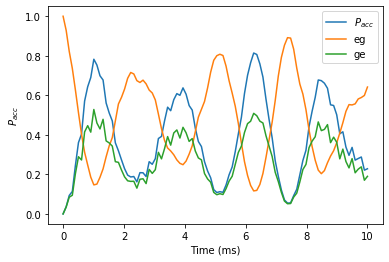

time used for solving mesolve: 0:00:35.244765  time used for ploting: 0:00:00.353856
phi =  3.141592653589793
max= 0.8138524557651872


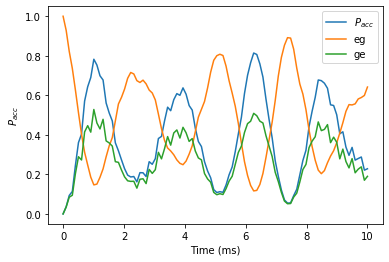

time used for solving mesolve: 0:00:34.446158  time used for ploting: 0:00:00.362242
phi =  3.3510321638291125
max= 0.8138524560620307


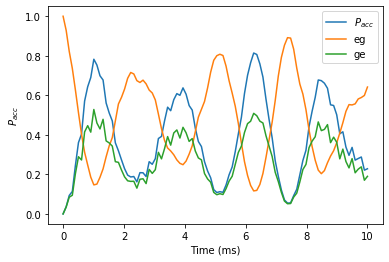

time used for solving mesolve: 0:00:35.211472  time used for ploting: 0:00:00.355451
phi =  3.560471674068432
max= 0.8138524560141207


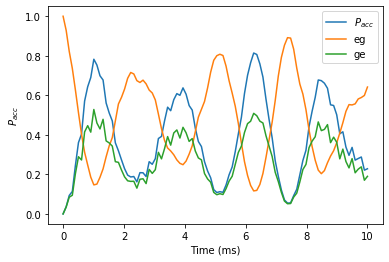

time used for solving mesolve: 0:00:35.478959  time used for ploting: 0:00:00.352184
phi =  3.7699111843077517
max= 0.813852456932127


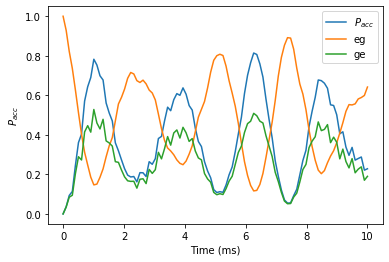

time used for solving mesolve: 0:00:35.061950  time used for ploting: 0:00:00.355503
phi =  3.979350694547071
max= 0.8138524551185278


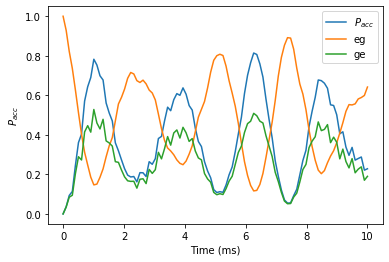

time used for solving mesolve: 0:00:35.068145  time used for ploting: 0:00:00.357727
phi =  4.1887902047863905
max= 0.8138524569242921


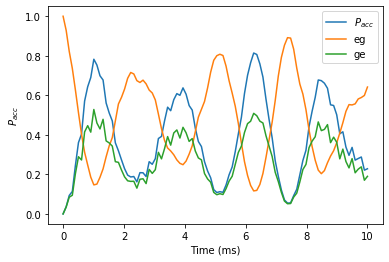

time used for solving mesolve: 0:00:34.844642  time used for ploting: 0:00:00.356977
phi =  4.39822971502571
max= 0.8138524557521529


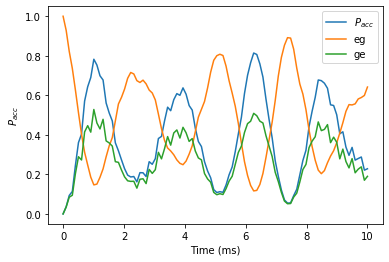

time used for solving mesolve: 0:00:38.476610  time used for ploting: 0:00:00.407574
phi =  4.607669225265029
max= 0.8138524562224325


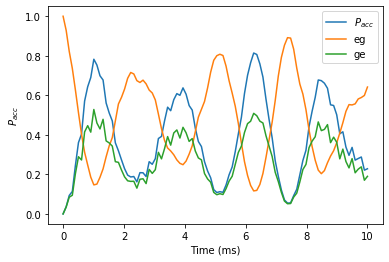

time used for solving mesolve: 0:00:40.599753  time used for ploting: 0:00:00.426804
phi =  4.817108735504349
max= 0.813852456358347


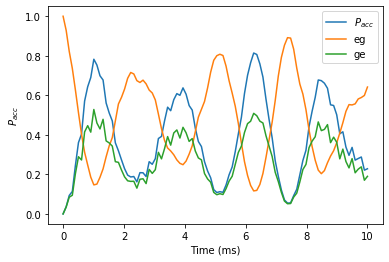

time used for solving mesolve: 0:00:34.747416  time used for ploting: 0:00:00.349879
phi =  5.026548245743669
max= 0.8138524561786936


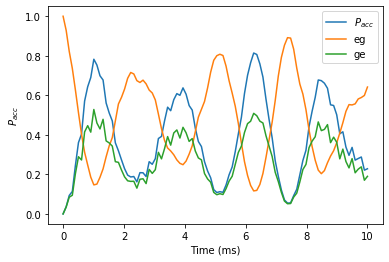

time used for solving mesolve: 0:00:34.679782  time used for ploting: 0:00:00.353000
phi =  5.235987755982988
max= 0.8138524561842394


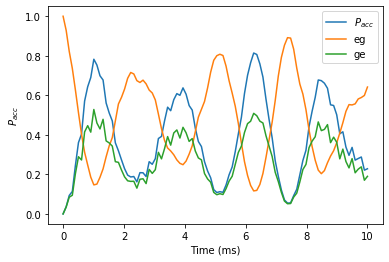

time used for solving mesolve: 0:00:34.032674  time used for ploting: 0:00:00.355186
phi =  5.445427266222308
max= 0.8138524556737342


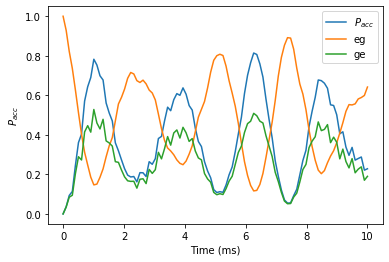

time used for solving mesolve: 0:00:33.884803  time used for ploting: 0:00:00.349143
phi =  5.654866776461628
max= 0.8138524549143973


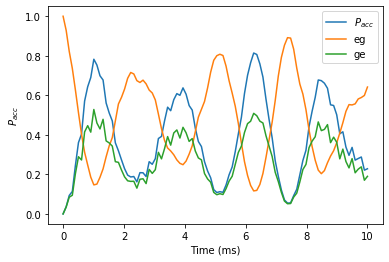

time used for solving mesolve: 0:00:34.473429  time used for ploting: 0:00:00.349022
phi =  5.864306286700947
max= 0.8138524566884225


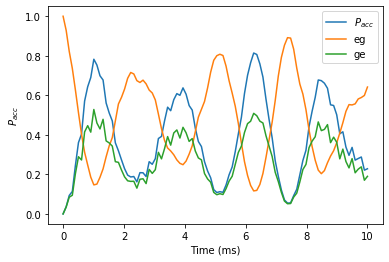

time used for solving mesolve: 0:00:34.221766  time used for ploting: 0:00:00.349844
phi =  6.073745796940266
max= 0.8138524561138015


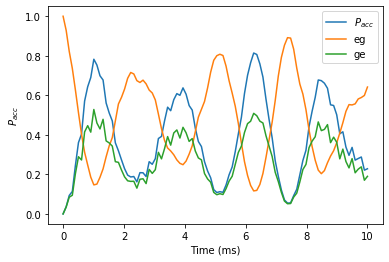

time used for solving mesolve: 0:00:34.210182  time used for ploting: 0:00:00.348153
phi =  6.283185307179586
max= 0.8138524557651872


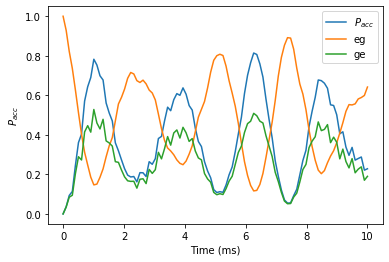

time used for solving mesolve: 0:00:34.153182  time used for ploting: 0:00:00.354390


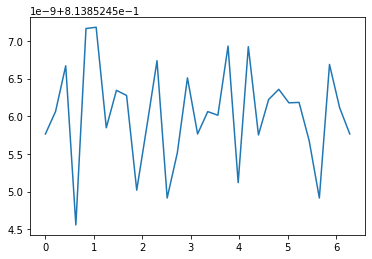

In [39]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_phase3 = []
n = 31
phis = np.linspace(0,2*np.pi,n)
for phi in phis:  
    print('phi = ', phi)
    Phi = [phi, phi, phi, phi]
    nu = np.sqrt(4*jj**2+0.7*Delta**2)
    exp3 = VAET(Nmax=10, J = J, phi = Phi, Delta = Delta, kappa = kappa, nu = -nu)
    result_phase3.append(exp3.time_scan(0, 10, 100, nth = 0.5))
plt.plot(phis, result_phase3)

## Add another individual beam on acceptor 1

One can add an individual beam on acceptor 1 by adding Delta1, kappa1, nu1 into the initial condition. Note that this will add another motional mode with dimension of Nmax (which is 10 normaly). This will increase the dimension damatically (from $40\times40$ to $400\times400$).

max= 0.8500444453236391


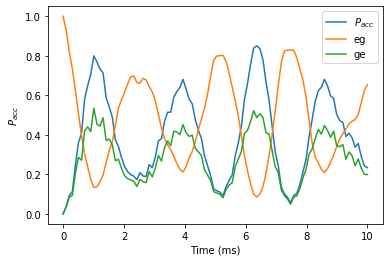

time used for solving mesolve: 0:00:32.852103  time used for ploting: 0:00:00.347274


In [33]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_ind = []
phase = [0,0,0,0]

nu = np.sqrt(4*jj**2+1.45*Delta**2)/np.sqrt(2)
exp3 = VAET(Nmax=10, J = J, phi = phase, Delta = Delta, kappa = kappa, nu = -nu)
result_ind.append(exp3.time_scan(0, 10, 100, nth = 0.5))

max= 0.8395773125611266


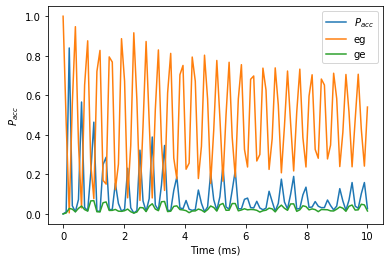

time used for solving mesolve: 0:00:34.592808  time used for ploting: 0:00:00.348827


In [34]:
jj = 1.3
J = [jj]*4
Delta = 10
kappa = 1.4
result_ind = []
phase = [0,0,0,0]

nu = np.sqrt(4*jj**2+1.45*Delta**2)/np.sqrt(2)
exp3 = VAET(Nmax=10, J = J, phi = phase, Delta = Delta, Delta1 = Delta, kappa = kappa, kappa1 = kappa, nu = -nu)
result_ind.append(exp3.time_scan(0, 10, 100, nth = 0.5))

## Need to find:
##### 1. What factors affect the effective parameters m and n? 
##### 2. Add phases somewhere to find interference.
##### 3. Try Cirac-Zoller gate